@author: Savan Agrawal
@file: vae-experiments.ipynb
@version: 0.1

# Training and Evaluating Variational Autoencoders on MuJoCo Ant Datasets

- Loads Ant dataset containing actions and observations. The dataset is collected from reinforcement model trained earlier.
- Preprocesses data by reshaping, normalization, differences, etc.
- Defines VAE encoder, decoder, loss functions, and PyTorch dataloader
- Trains multiple VAE models with different parameters
- Evaluates models by visualizing training loss convergence
- Visualizes and compares latent spaces learned by each model
- Plots original vs reconstructed actions to evaluate reconstruction error
- Calculates mean squared error of reconstructed actions for each model
- Interactively visualizes latent space and decodes points to actions
- Uses reconstructed actions to control simulated Ant environment
- Compares models and analyzes how hyperparameters affect learning

In summary, the notebook trains multiple VAEs on the Ant motion dataset, evaluates the models using different visualization techniques, and analyzes the effect of hyperparameters and design choices on learning the latent representation and action reconstruction.

## Importing Required libraries

In [1]:
# Keras and related imports
import keras
from keras import layers, regularizers, backend as K
from keras.layers import Input, Dense, Lambda, LeakyReLU, Dropout
from keras.losses import MSE
from keras.optimizers import SGD
from keras.models import Model, load_model
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

# Standard libraries and data processing
import numpy as np
import pandas as pd
import pickle

# Visualization
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter
import plotly
import plotly.express as px 
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import graphviz

# PyTorch and Tensorflow
import torch
from torch.utils.data import DataLoader
import tensorflow as tf

# sklearn
from sklearn.model_selection import train_test_split

# Others
from matplotlib.colors import ListedColormap
import wget
import pygame
import gymnasium as gym


pygame 2.1.3 (SDL 2.0.22, Python 3.11.4)
Hello from the pygame community. https://www.pygame.org/contribute.html


## Setting matplotlib style and color palette

In [2]:
wget.download('https://raw.githubusercontent.com/h4pZ/rose-pine-matplotlib/main/themes/rose-pine-dawn.mplstyle', out='/tmp')

cmap = ListedColormap(['#EA9D34', '#286983', '#7ED782', '#B4637A'])
color=["#EA9D34", "#286983", "#7ED782", "#B4637A", "#D9B650", "#4A90A6", "#A6D985", "#C87AB4", "#E45F56", "#5E7C88"]
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=["#B4637A", "#286983",  "#EA9D34", "#7ED782", "#D9B650",
                                                    "#4A90A6", "#A6D985", "#C87AB4", "#E45F56", "#5E7C88"]) 
mpl.style.use('/tmp/rose-pine-dawn.mplstyle')

## Loading and preprocessing Ant dataset

The actions and observations are loaded, reshaped, normalized, concatenated and prepared for training the VAE models.

In [3]:
# Importing dataset
dataset_path = '../dataset-creator/default-ant/assets/'
actions = np.load(dataset_path + 'actions100knew.npy')
observations = np.load(dataset_path + 'observations100knew.npy')
infos = np.load(dataset_path + 'infos100knew.npy', allow_pickle=True)

# actions_test = np.load(dataset_path + 'actionsTest.npy')
# observations_test = np.load(dataset_path + 'observationsTest.npy')
# rewards_test = np.load(dataset_path + 'rewardsTest.npy')
# infos_test = np.load(dataset_path + 'infosTest.npy', allow_pickle=True)

actions_test = np.load(dataset_path + 'actions.npy')
observations_test = np.load(dataset_path + 'observations.npy')
rewards_test = np.load(dataset_path + 'rewards.npy')
infos_test = np.load(dataset_path + 'infos.npy', allow_pickle=True)

# Assigning Labels (Since the RL Model were runned for 100k timesteps for each side)
labels = np.zeros(len(actions))
labels[100000:200000] = 1
labels[200000:300000] = 2
labels[300000:] = 3

actions = actions.reshape((len(actions), np.prod(actions.shape[1:])))
observations = observations.reshape((len(observations), np.prod(observations.shape[1:])))

# Standardising the action and observation space
actions_std = (actions - actions.mean(axis=0)) / actions.std(axis=0)
observations_std = (observations - observations.mean(axis=0)) / observations.std(axis=0)

actions_new = np.concatenate((actions, actions_std), axis=1)
observations_new = np.concatenate((observations, observations_std), axis=1)

actions_observations = np.concatenate((actions_new, observations_new), axis=1)

# Creating index variable for sorting the test dataset later
index = np.arange(0, 400000)

# Storing Data for Evaluation 
histories = []
encoded_data_list = []
labels_list = []
mse_values = []

print(actions.shape)
print(observations.shape)
print(actions_new.shape)
print(observations_new.shape)
print(actions_observations.shape)

(400000, 8)
(400000, 27)
(400000, 16)
(400000, 54)
(400000, 70)


In [4]:
actionsT = actions_test.reshape((len(actions_test), np.prod(actions_test.shape[1:])))
observationsT = observations_test.reshape((len(observations_test), np.prod(observations_test.shape[1:])))

# Standardising the action and observation space
actions_stdT = (actionsT - actionsT.mean(axis=0)) / actionsT.std(axis=0)
observations_stdT = (observationsT - observationsT.mean(axis=0)) / observationsT.std(axis=0)


actions_newT = np.concatenate((actionsT, actions_stdT), axis=1)
observations_newT = np.concatenate((observationsT, observations_stdT), axis=1)

actions_observationsT = np.concatenate((actions_newT, observations_newT), axis=1)


### Calculating differences between actions

In [5]:
diff_actions = np.zeros(actions.shape)

# Calculate differences in four 100,000-row segments
for i in range(4):
    start_idx = i * 100000
    end_idx = (i + 1) * 100000
    diff_actions[start_idx+1:end_idx] = np.diff(actions[start_idx:end_idx], axis=0)

actions_obs_diff_act = np.concatenate((actions_observations, diff_actions), axis=1)
actions_obs_diff_act.shape

actions_diff_act = np.concatenate((actions_new, diff_actions), axis=1)
actions_diff_act.shape

(400000, 24)

In [6]:
diff_actionsT = np.zeros(actionsT.shape)

# Calculate differences in four 100,000-row segments
for i in range(4):
    start_idx = i * 1000
    end_idx = (i + 1) * 1000
    diff_actionsT[start_idx+1:end_idx] = np.diff(actionsT[start_idx:end_idx], axis=0)

actions_obs_diff_actT = np.concatenate((actions_observationsT, diff_actionsT), axis=1)
actions_obs_diff_actT.shape

actions_diff_actT = np.concatenate((actions_newT, diff_actionsT), axis=1)
actions_diff_actT.shape

(4000, 24)

### Preprocessing custom observations

In [7]:
obs_custom = observations[:, np.r_[5:13, 19:27]]
actions_obs_cust_diff_act = np.concatenate((actions_new, diff_actions, obs_custom), axis=1)
actions_obs_cust_diff_act.shape

(400000, 40)

In [8]:
obs_customT = observationsT[:, np.r_[5:13, 19:27]]
actions_obs_cust_diff_actT = np.concatenate((actions_newT, diff_actionsT, obs_customT), axis=1)
actions_obs_cust_diff_actT.shape

(4000, 40)

## Creating PyTorch DataLoader for Ant dataset

In [9]:
class LabeledDataset(torch.utils.data.Dataset):
    """
    A class used to represent labeled dataset
    """
    def __init__(self, observations, labels):
        super(LabeledDataset, self).__init__()
        self.observations = observations
        self.labels = labels

    def __len__(self):
        return len(self.observations)

    def __getitem__(self, idx):
        return self.observations[idx], self.labels[idx]

# Create a LabeledDataset
dataset = LabeledDataset(actions, labels)

# Use the LabeledDataset with a DataLoader
dataloader = DataLoader(dataset, batch_size=108, shuffle=True)

## Defining formatter for axis ticks

In [10]:
def format_func(value, tick_number):
        # Define the mapping between numeric labels and text labels
        label_map = {0: 'X Direction', 1: 'Neg. X Direction', 2: 'Y Direction', 3: 'Neg. Y Direction'}
        label_map = {0: 'Pos. X', 1: 'Neg. X', 2: 'Pos. Y', 3: 'Neg. Y'}
        return label_map.get(value, '')

## Visualising X and Y position of ant

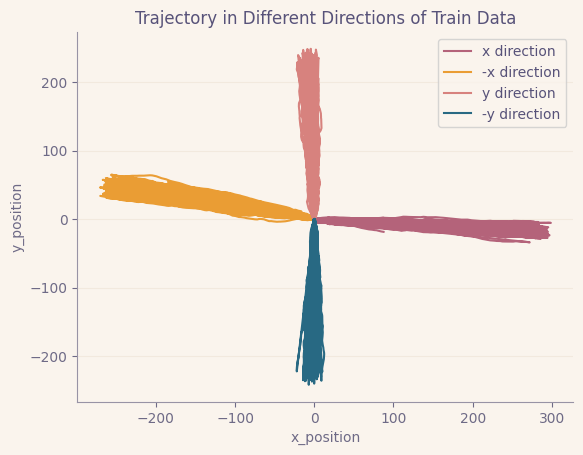

In [11]:
# Extract the segments
x_direction = infos[:100000]
minus_x_direction = infos[100000:200000]
y_direction = infos[200000:300000]
minus_y_direction = infos[300000:400000]

# Extract x and y positions and plot for each segment
def extract_and_plot(segment, color, label):
    x = [entry[0]['x_position'] for entry in segment]
    y = [entry[0]['y_position'] for entry in segment]
    plt.plot(x, y, label=label)

# Plot each segment
extract_and_plot(x_direction, 'r', 'x direction')
extract_and_plot(minus_x_direction, 'b', '-x direction')
extract_and_plot(y_direction, 'g', 'y direction')
extract_and_plot(minus_y_direction, 'm', '-y direction')

# Add legend and show the plot
plt.legend()
plt.xlabel('x_position')
plt.ylabel('y_position')
plt.title('Trajectory in Different Directions of Train Data')
plt.savefig('assets/images/TrajectoryTrain.png', dpi=300)
plt.show()


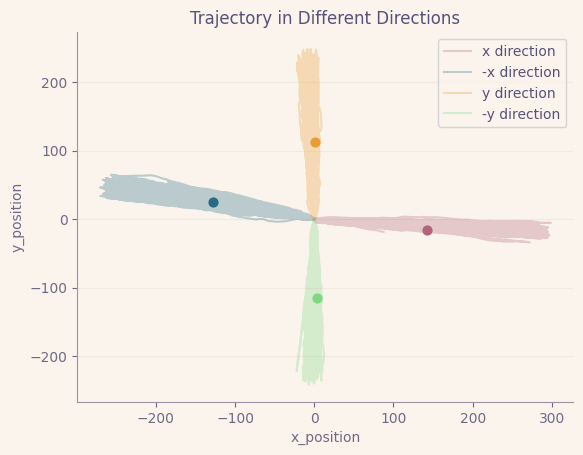

In [12]:
# Extract the segments
x_direction = infos[:100000]
minus_x_direction = infos[100000:200000]
y_direction = infos[200000:300000]
minus_y_direction = infos[300000:400000]

# Choose a specific index to highlight
index_to_highlight = 500  # This is an example, adjust as needed

# Extract x and y positions and plot for each segment
def extract_and_plot(segment, color, label):
    x = [entry[0]['x_position'] for entry in segment]
    y = [entry[0]['y_position'] for entry in segment]
    plt.plot(x, y, color, label=label, alpha=0.3)  # Reduced opacity for better visualization
    plt.scatter(x[index_to_highlight], y[index_to_highlight], color=color, s=40)  # Highlight the chosen point

# Plot each segment
extract_and_plot(x_direction, '#B4637A', 'x direction')
extract_and_plot(minus_x_direction, '#286983', '-x direction')
extract_and_plot(y_direction, '#EA9D34', 'y direction')
extract_and_plot(minus_y_direction, '#7ED782', '-y direction')

# Add legend and show the plot
plt.legend()
plt.xlabel('x_position')
plt.ylabel('y_position')
plt.title('Trajectory in Different Directions')
plt.savefig('assets/images/Trajectory.png', dpi=300)
plt.show()


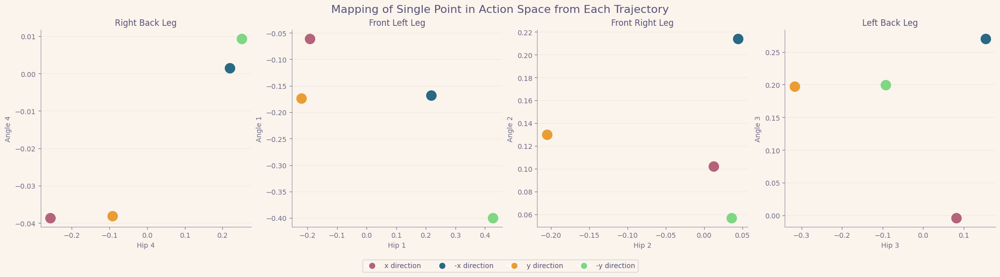

In [13]:
fig, ax = plt.subplots(1, 4, figsize=(20, 5), constrained_layout=True)

i = 500
colors = ["#B4637A", "#286983", "#EA9D34", "#7ED782"]
labels_dir = ["x direction", "-x direction", "y direction", "-y direction"]

# Creating custom legend handles
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', label=label, 
                             markersize=10, markerfacecolor=color) for color, label in zip(colors, labels_dir)]

for j, color in enumerate(colors):
    ax[0].scatter(actions[i][0], actions[i][1], c=color, s=200)
    ax[0].set_title('Right Back Leg')
    ax[0].set_xlabel('Hip 4')
    ax[0].set_ylabel('Angle 4')

    ax[1].scatter(actions[i][2], actions[i][3], c=color, s=200)
    ax[1].set_title('Front Left Leg')
    ax[1].set_xlabel('Hip 1')
    ax[1].set_ylabel('Angle 1')

    ax[2].scatter(actions[i][4], actions[i][5], c=color, s=200)
    ax[2].set_title('Front Right Leg')
    ax[2].set_xlabel('Hip 2')
    ax[2].set_ylabel('Angle 2')

    ax[3].scatter(actions[i][6], actions[i][7], c=color, s=200)  # Modified indexing
    ax[3].set_title('Left Back Leg')
    ax[3].set_xlabel('Hip 3')
    ax[3].set_ylabel('Angle 3')

    i += 100000

# Main title
plt.suptitle('Mapping of Single Point in Action Space from Each Trajectory', fontsize=16)

# Adding legend to the figure (change bbox_to_anchor as needed to adjust position)
fig.legend(handles=legend_handles, loc='lower center', ncol=4, bbox_to_anchor=(0.5, -0.1))
plt.savefig('assets/images/SinglePointMapping.png', dpi=300)

plt.show()


## Visualising Test Data

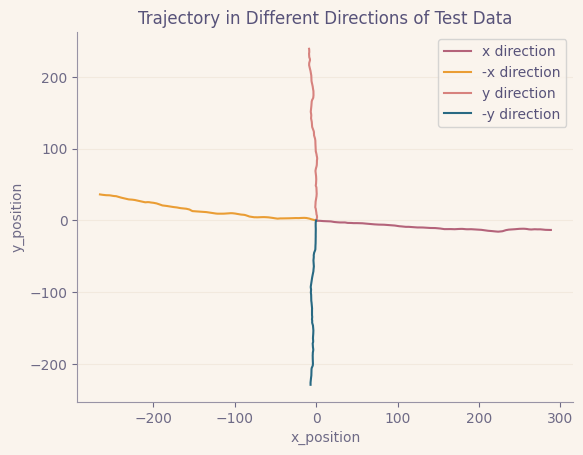

In [14]:

# Extract the segments
x_direction = infos_test[:1000]
minus_x_direction = infos_test[1000:2000]
y_direction = infos_test[2000:3000]
minus_y_direction = infos_test[3000:4000]

# Extract x and y positions and plot for each segment
def extract_and_plot(segment, color, label):
    x = [entry[0]['x_position'] for entry in segment]
    y = [entry[0]['y_position'] for entry in segment]
    plt.plot(x, y, label=label)

# Plot each segment
extract_and_plot(x_direction, 'r', 'x direction')
extract_and_plot(minus_x_direction, 'b', '-x direction')
extract_and_plot(y_direction, 'g', 'y direction')
extract_and_plot(minus_y_direction, 'm', '-y direction')

# Add legend and show the plot
plt.legend()
plt.xlabel('x_position')
plt.ylabel('y_position')
plt.title('Trajectory in Different Directions of Test Data')
plt.savefig('assets/images/TrajectoryTest.png', dpi=300)

plt.show()


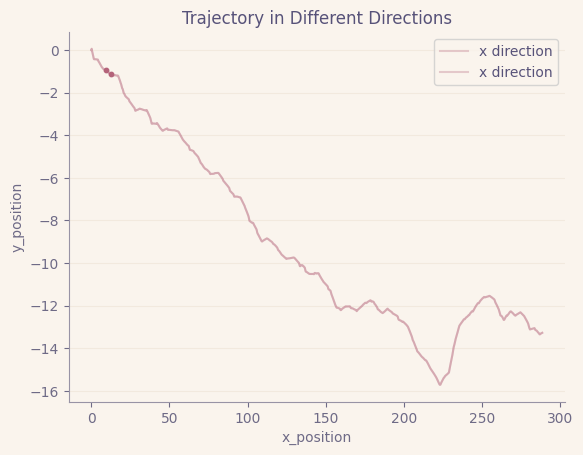

In [15]:
# Extract the segments
# Extract the segments
x_direction = infos_test[:1000]
minus_x_direction = infos_test[1000:2000]
y_direction = infos_test[2000:3000]
minus_y_direction = infos_test[3000:4000]

# Choose a specific index to highlight
index_to_highlight = 50  # This is an example, adjust as needed

# Extract x and y positions and plot for each segment
def extract_and_plot(segment, label):
    x = [entry[0]['x_position'] for entry in segment]
    y = [entry[0]['y_position'] for entry in segment]
    plt.plot(x, y, label=label)

# Extract x and y positions and plot for each segment
def extract_and_plot_c(segment, color, label, index_to_highlight):
    x = [entry[0]['x_position'] for entry in segment]
    y = [entry[0]['y_position'] for entry in segment]
    plt.plot(x, y, color, label=label, alpha=0.3)  # Reduced opacity for better visualization
    plt.scatter(x[index_to_highlight], y[index_to_highlight], color=color, s=10)  # Highlight the chosen point

# Plot each segment
extract_and_plot_c(x_direction, '#B4637A', 'x direction', 50)
extract_and_plot_c(x_direction, '#B4637A', 'x direction', 60)
# extract_and_plot(minus_x_direction, '-x direction')
# extract_and_plot(y_direction, 'y direction')
# extract_and_plot(minus_y_direction, '-y direction')

# Add legend and show the plot
plt.legend()
plt.xlabel('x_position')
plt.ylabel('y_position')
plt.title('Trajectory in Different Directions')
# plt.savefig('assets/images/Trajectory.png', dpi=300)
plt.show()


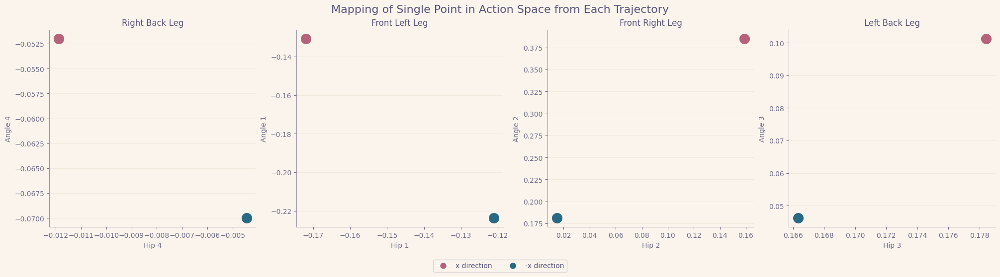

In [16]:
fig, ax = plt.subplots(1, 4, figsize=(20, 5), constrained_layout=True)

i = 50
colors = ["#B4637A", "#286983"]
labels_dir = ["x direction", "-x direction", "y direction", "-y direction"]

# Creating custom legend handles
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', label=label, 
                             markersize=10, markerfacecolor=color) for color, label in zip(colors, labels_dir)]

for j, color in enumerate(colors):
    ax[0].scatter(actionsT[i][0], actionsT[i][1], c=color, s=200)
    ax[0].set_title('Right Back Leg')
    ax[0].set_xlabel('Hip 4')
    ax[0].set_ylabel('Angle 4')

    ax[1].scatter(actionsT[i][2], actionsT[i][3], c=color, s=200)
    ax[1].set_title('Front Left Leg')
    ax[1].set_xlabel('Hip 1')
    ax[1].set_ylabel('Angle 1')

    ax[2].scatter(actionsT[i][4], actionsT[i][5], c=color, s=200)
    ax[2].set_title('Front Right Leg')
    ax[2].set_xlabel('Hip 2')
    ax[2].set_ylabel('Angle 2')

    ax[3].scatter(actionsT[i][6], actionsT[i][7], c=color, s=200)  # Modified indexing
    ax[3].set_title('Left Back Leg')
    ax[3].set_xlabel('Hip 3')
    ax[3].set_ylabel('Angle 3')

    i += 10

# Main title
plt.suptitle('Mapping of Single Point in Action Space from Each Trajectory', fontsize=16)

# Adding legend to the figure (change bbox_to_anchor as needed to adjust position)
fig.legend(handles=legend_handles, loc='lower center', ncol=4, bbox_to_anchor=(0.5, -0.1))
# plt.savefig('assets/images/SinglePointMapping.png', dpi=300)

plt.show()


## Visualizing raw action space

The action space is visualized across 4 subplots, with each showing a different joint configuration. The data is colored by label. The plot is customized and saved.

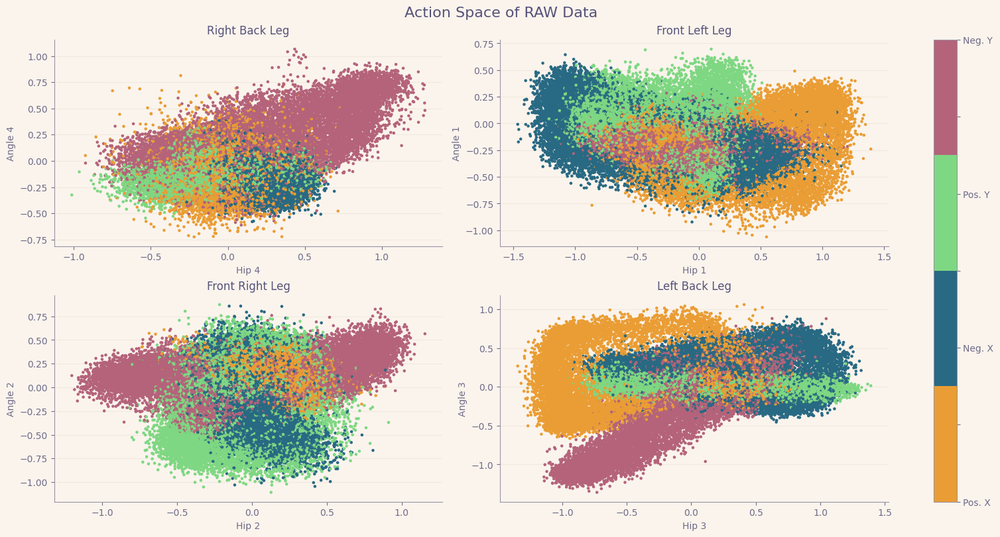

In [17]:
def action_sapce_raw():
    fig, ax = plt.subplots(2, 2, figsize=(15, 8), constrained_layout=True)

    for i, (x, y) in enumerate(dataloader):
        ax[0, 0].scatter(x[:, 0], x[:, 1], c=y, cmap=cmap, s=5)
        ax[0, 0].set_title('Right Back Leg')
        ax[0, 0].set_xlabel('Hip 4')
        ax[0, 0].set_ylabel('Angle 4')

        ax[0, 1].scatter(x[:, 2], x[:, 3], c=y, cmap=cmap, s=5)
        ax[0, 1].set_title('Front Left Leg')
        ax[0, 1].set_xlabel('Hip 1')
        ax[0, 1].set_ylabel('Angle 1')

        ax[1, 0].scatter(x[:, 4], x[:, 5], c=y, cmap=cmap, s=5)
        ax[1, 0].set_title('Front Right Leg')
        ax[1, 0].set_xlabel('Hip 2')
        ax[1, 0].set_ylabel('Angle 2')

        ax[1, 1].scatter(x[:, 6], x[:, 7], c=y, cmap=cmap, s=5)
        ax[1, 1].set_title('Left Back Leg')
        ax[1, 1].set_xlabel('Hip 3')
        ax[1, 1].set_ylabel('Angle 3')

        if i > 1000:
            break

    # Main title
    plt.suptitle('Action Space of RAW Data', fontsize=16)

    # Legend for the whole figure
    cbar = fig.colorbar(ax[0, 0].collections[0], ax=ax.ravel().tolist(), pad=0.05)
    
    # Custom formatter for the colorbar
    cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))
    
    plt.savefig('assets/images/ActionSpaceRawData.png', dpi=300)
    plt.show()

action_sapce_raw()


# First VAE Model Architecture with Action and Standardized Action Space

This code defines the key components of a variational autoencoder (VAE) model:

- `original_dim` and `latent_dim` are constants that define the input dimension and latent space dimension respectively.
- `sampling()` is a sampling function that samples points from the latent space by taking the mean and log variance from the encoder and sampling using the reparameterization trick.
- `build_encoder()` defines the encoder architecture using Dense layers to encode the input down to the mean and log variance vectors describing the latent distribution.
- `build_decoder()` defines the mirrored decoder architecture using Dense layers to decode points from the latent space back to the original input dimensions.
- `vae_reconstruction_loss()` defines a custom reconstruction loss using mean squared error.
- `vae_kl_loss()` defines the custom KL divergence loss for the VAE.
- The data is split into train and test.
- The encoder and decoder models are instantiated using the builder functions.

In summary, this code is defining all the key components of a VAE - the encoder, decoder, loss functions, and data pipeline. The encoder maps the data to a latent distribution, the decoder reconstructs back to the original data space, and the losses optimize the reconstruction and regularize the latent space. This provides the full specification of a VAE architecture before training.

In [18]:
# Constants
original_dim = 16
latent_dim = 2
learning_rate = 0.001  
kl_weight = 0.01 

def sampling(args):
    """Sampling function to sample from the latent space."""
    z_mean, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim), mean=0., stddev=0.1)
    return z_mean + K.exp(z_log_sigma) * epsilon

def build_encoder(input_shape, latent_dim):
    """Build the encoder network."""
    inputs = Input(shape=input_shape, name="encoder_input")
    
    x = Dropout(0.25, name="encoder_dropout")(inputs)
    
    # Encode the input data
    x = tf.keras.Sequential([
        Dense(7, name="dense_encode_1"),
        LeakyReLU(name="leaky_relu_encode_1"),
        Dense(5, name="dense_encode_2"),
        LeakyReLU(name="leaky_relu_encode_2"),
        Dense(5, name="dense_encode_3"),
        LeakyReLU(name="leaky_relu_encode_3"),
        Dense(5, name="dense_encode_4"),
        LeakyReLU(name="leaky_relu_encode_4"),
        Dense(5, name="dense_encode_5"),
        LeakyReLU(name="leaky_relu_encode_5"),
        Dense(3, name="dense_encode_6"),
        LeakyReLU(name="leaky_relu_encode_6"),
    ], name="encoder_sequential")(x)
    
    z_mean = Dense(latent_dim, name="z_mean")(x)
    z_log_sigma = Dense(latent_dim, name="z_log_sigma")(x)
    
    z = Lambda(sampling, name="encoder_sampling")([z_mean, z_log_sigma])
    
    return Model(inputs, [z_mean, z_log_sigma, z], name='encoder')

def build_decoder(latent_dim, output_shape):
    """Build the decoder network."""
    latent_inputs = Input(shape=(latent_dim,), name="decoder_input")
    
    x = tf.keras.Sequential([
        Dense(4, activation='linear', name="dense_decode_1"),
        Dense(4, activation='linear', name="dense_decode_2"),
        Dense(5, activation='linear', name="dense_decode_3"),
        Dense(5, activation='linear', name="dense_decode_4"),
        Dense(5, activation='linear', name="dense_decode_5"),
        Dense(7, activation='linear', name="dense_decode_6"),
    ], name="decoder_sequential")(latent_inputs)
    
    outputs = Dense(output_shape, activation='linear', name="decoder_output")(x)
    
    return Model(latent_inputs, outputs, name='decoder')


def vae_reconstruction_loss(y_true, y_pred):
    """Custom reconstruction loss."""
    return MSE(y_true, y_pred) * original_dim

def vae_kl_loss(z_mean, z_log_sigma):
    """Custom KL divergence loss."""
    kl_loss = 1 + z_log_sigma - K.square(z_mean) - K.exp(z_log_sigma)
    return -0.5 * kl_weight * K.sum(kl_loss, axis=-1)

# Split data
# x_train, x_test, y_train, y_test, index_train, index_test = train_test_split(actions_new, labels, index, test_size=0.10, random_state=42)

# Build Encoder and Decoder
encoder = build_encoder((original_dim,), latent_dim)
decoder = build_decoder(latent_dim, original_dim)

In [19]:
# Instantiate VAE model
inputs = Input(shape=(original_dim,))
outputs = decoder(encoder(inputs)[2])
vae = Model(inputs, outputs, name='vae_mlp')

reconstruction_loss = vae_reconstruction_loss(inputs, outputs)
kl_loss = vae_kl_loss(encoder(inputs)[0], encoder(inputs)[1])
vae_loss = K.mean(reconstruction_loss + kl_loss)

vae.add_loss(vae_loss)
vae.add_metric(reconstruction_loss, name='reconstruction_loss')
vae.add_metric(kl_loss, name='kl_loss')
vae.compile(optimizer=SGD(learning_rate))

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-10, verbose=1),
    EarlyStopping(monitor='val_loss', patience=50, verbose=1, restore_best_weights=True),
    ModelCheckpoint('assets/model1/model.h5', save_best_only=True, save_format='tf')
]

In [20]:
# tf.keras.utils.plot_model(
#     vae,
#     show_shapes=False,
#     show_dtype=False,
#     show_layer_names=True,
#     rankdir='TB',
#     expand_nested=True,
#     dpi=300,
#     layer_range=None,
#     show_layer_activations=True,
#     show_trainable=False
# )

### Training and saving the VAE model

In [21]:
# history = vae.fit(actions_new, actions_new, epochs=1000, batch_size=256, validation_data=(actions_newT, actions_newT), callbacks=callbacks)

In [22]:
# # Saving the models
# encoder.save("assets/model1/vae_encoder.h5")
# decoder.save("assets/model1/vae_decoder.h5")

# # Save history
# with open('assets/model1/train_history.pkl', 'wb') as file:
#     pickle.dump(history.history, file)

### Loading the saved VAE Model

In [23]:
# Loading the models
encoder = load_model("assets/model1/vae_encoder.h5")
decoder = load_model("assets/model1/vae_decoder.h5")

# Load history
with open('assets/model1/train_history.pkl', 'rb') as file:
    loaded_history = pickle.load(file)

# Recreate the VAE model
inputs_reconstructed = Input(shape=(original_dim,))
outputs_reconstructed = decoder(encoder(inputs_reconstructed)[2])
vae_reconstructed = Model(inputs_reconstructed, outputs_reconstructed, name='reconstructed_vae_mlp')

reconstruction_loss_reconstructed = vae_reconstruction_loss(inputs_reconstructed, outputs_reconstructed)
kl_loss_reconstructed = vae_kl_loss(encoder(inputs_reconstructed)[0], encoder(inputs_reconstructed)[1])
vae_loss_reconstructed = K.mean(reconstruction_loss_reconstructed + kl_loss_reconstructed)

vae_reconstructed.add_loss(vae_loss_reconstructed)
vae_reconstructed.add_metric(reconstruction_loss_reconstructed, name='reconstruction_loss')
vae_reconstructed.add_metric(kl_loss_reconstructed, name='kl_loss')
vae_reconstructed.compile(optimizer=SGD(learning_rate))

### Plotting Total, Recostruction and KL Divergence Loss

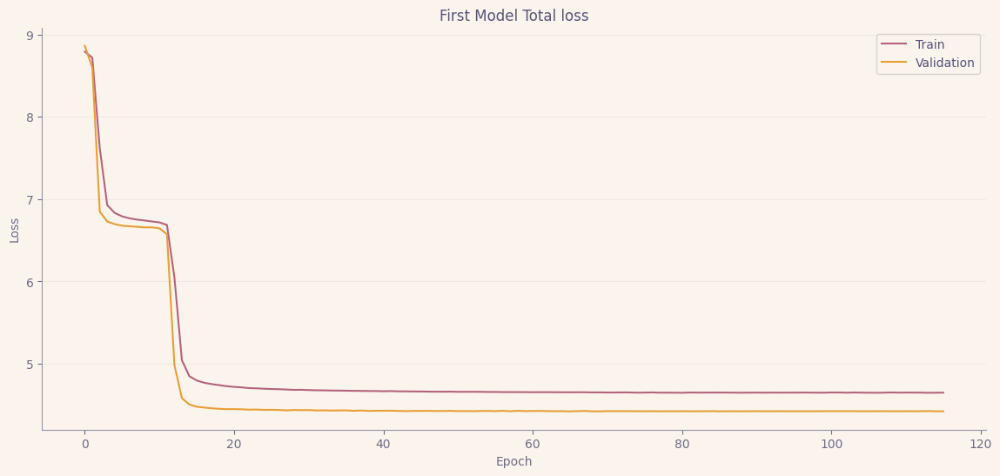

In [24]:
# Plot training & validation loss values
plt.figure(figsize=(14, 6))
plt.plot(loaded_history['loss'])
plt.plot(loaded_history['val_loss'])
plt.title('First Model Total loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

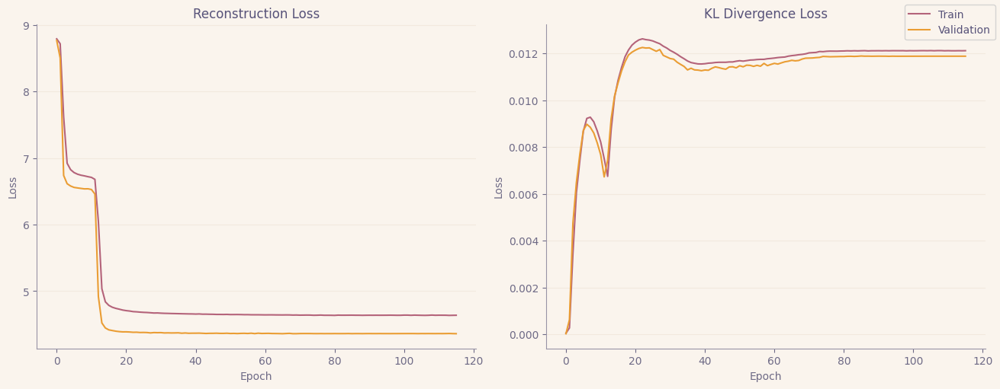

In [25]:
fig, ax = plt.subplots(1, 2, figsize=(13, 5), constrained_layout=True)

ax[0].plot(loaded_history['reconstruction_loss'])
ax[0].plot(loaded_history['val_reconstruction_loss'])
ax[0].set_title('Reconstruction Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')

ax[1].plot(loaded_history['kl_loss'])
ax[1].plot(loaded_history['val_kl_loss'])
ax[1].set_title('KL Divergence Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')

fig.legend(['Train', 'Validation'], loc='upper right')

### Evaluation of First Model

In the following cells, preprocessing of the test dataset, latent space, timeseries of data will take place. 

In [26]:
y_test = np.zeros(4000)
y_test[1000:2000] = 1
y_test[2000:3000] = 2
y_test[3000:] = 3
index_test = np.arange(4000)

In [27]:
df_x_test = pd.DataFrame(actions_newT)

model2_df = pd.concat([
    df_x_test,
    pd.DataFrame({
        'y_test': y_test,
        'index_test': index_test
    }, index=df_x_test.index)
], axis=1)

# model2_df

model2_df_sorted = model2_df.sort_values(by='index_test')
# model2_df_sorted

x_test_sorted = model2_df_sorted.iloc[:, 0:16].values
# x_test_sorted


In [28]:
x_test_encoded = encoder.predict(x_test_sorted, batch_size=100)

df_x_test_enc = pd.DataFrame(x_test_encoded[2])

df_encoded = pd.concat([
    df_x_test_enc,
    pd.DataFrame({
        'y_test': model2_df_sorted['y_test'].values,
        'index_test': model2_df_sorted['index_test'].values
    }, index=df_x_test_enc.index)
], axis=1)

df_encoded

40/40 [==============================] - 0s 443us/step


,0,1,y_test,index_test
0,-0.584204,-0.381341,0.0,0
1,0.012778,-0.492099,0.0,1
2,0.952391,0.782025,0.0,2
3,0.911068,0.280405,0.0,3
4,0.274455,0.343470,0.0,4
...,...,...,...,...
3995,-0.581757,0.300936,3.0,3995
3996,0.300729,-0.227289,3.0,3996
3997,0.418665,-0.150690,3.0,3997
3998,0.164581,-0.137728,3.0,3998


### Latent Space of First VAE Model

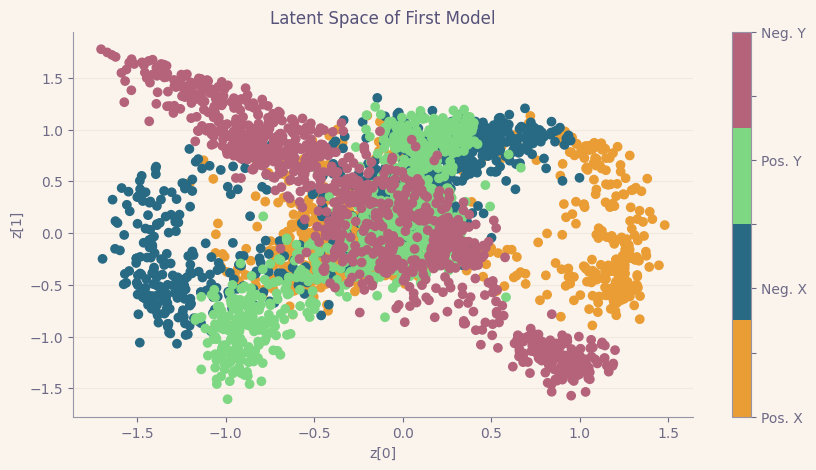

In [29]:
plt.figure(figsize=(10, 5))
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap)
cbar = plt.colorbar()
cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.title('Latent Space of First Model')
plt.savefig('assets/images/FirstModelLatent.png', dpi=300)
plt.show()

In [30]:
# Forward pass your test data through the encoder to get mean and log variance
z_mean, z_log_sigma, _ = encoder.predict(x_test_sorted, batch_size=100)

# Convert log variance to standard deviation
sigma = np.exp(0.5 * z_log_sigma)  # Convert log variance to standard deviation

sigma_x = sigma[:, 0]
sigma_y = sigma[:, 1]


40/40 [==============================] - 0s 648us/step


### Timeseries of test dataset on Latent Space

The plot shows how sequences of data move through the 2D latent space over timesteps. Points are colored by label. The plot visualizes the latent space mapping learned by the VAE model.

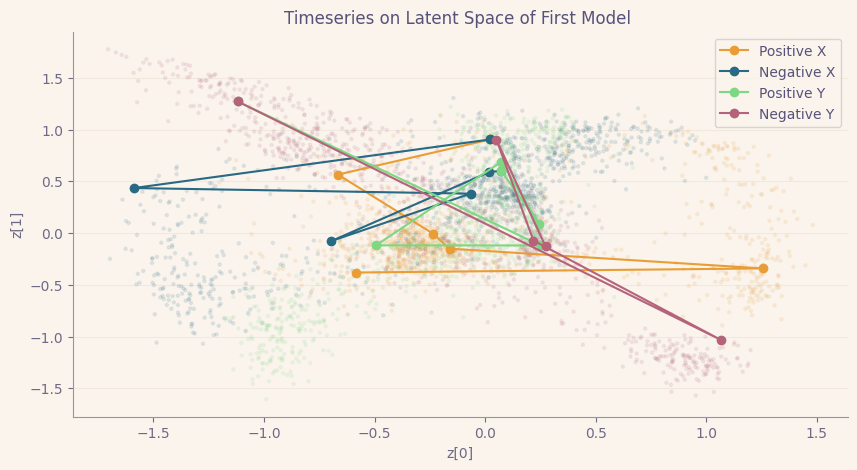

In [31]:
plt.figure(figsize=(10, 5))
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap, s=5, alpha=0.1)
colors = ['#EA9D34', '#286983', '#7ED782', '#B4637A']
lab = ["Positive X", "Negative X", "Positive Y", "Negative Y"]

skip = 200
for i in range(4):
    selected_rows = df_encoded[(df_encoded['index_test'] >= i*1000) & (df_encoded['index_test'] <= (i+1)*1000)]
    selected_rows = selected_rows[::skip]
    plt.plot(selected_rows[0].values, selected_rows[1].values, '-o', color=colors[i], alpha=1, label=lab[i])
    
# cbar = plt.colorbar()
# cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.legend()
plt.title('Timeseries on Latent Space of First Model ')
plt.savefig('assets/images/FirstModelTimeseries.png', dpi=300)
plt.show()

### Visualizing Action Space after VAE training

The reconstructed action space is visualized to see how well the VAE model learned the underlying structure.

 1/40 [..............................] - ETA: 1s

40/40 [==============================] - 0s 444us/step


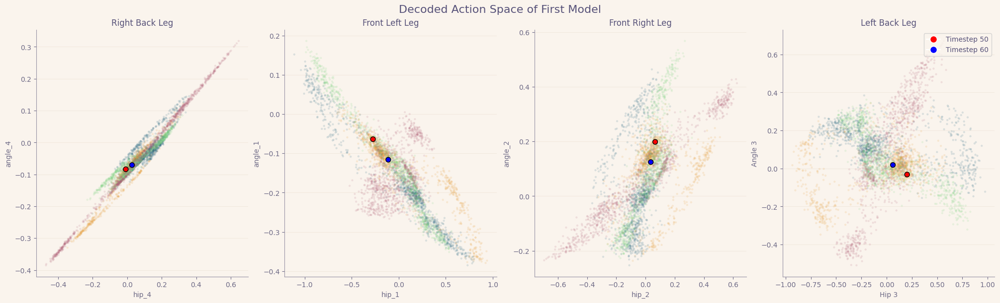

In [32]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def action_sapce_after(x_test_decoded, y):
    """
    Plot the latent space.
    """
    fig, ax = plt.subplots(1, 4, figsize=(20, 6), constrained_layout=True)  # Changed to one row and 4 columns
    x = x_test_decoded
    points_50_60 = x_test_decoded[[50, 60]]
    
    colors = ['red', 'blue']  # Red for 50th and blue for 60th timestep
    highlight_size = 50

    # Reduced opacity of main scatter plots and removed zorder to ensure highlighted points are on top
    alpha_val = 0.1

    ax[0].scatter(x[:, 0], x[:, 1], c=y, cmap=cmap, s=5, alpha=alpha_val)
    ax[0].scatter(points_50_60[:, 0], points_50_60[:, 1], c=colors, s=highlight_size, edgecolors='black')
    
    ax[1].scatter(x[:, 2], x[:, 3], c=y, cmap=cmap, s=5, alpha=alpha_val)
    ax[1].scatter(points_50_60[:, 2], points_50_60[:, 3], c=colors, s=highlight_size, edgecolors='black')

    ax[2].scatter(x[:, 4], x[:, 5], c=y, cmap=cmap, s=5, alpha=alpha_val)
    ax[2].scatter(points_50_60[:, 4], points_50_60[:, 5], c=colors, s=highlight_size, edgecolors='black')
    
    ax[3].scatter(x[:, 6], x[:, 7], c=y, cmap=cmap, s=5, alpha=alpha_val)
    ax[3].scatter(points_50_60[:, 6], points_50_60[:, 7], c=colors, s=highlight_size, edgecolors='black')
    
    ax[0].set_title('Right Back Leg')
    ax[0].set_xlabel('hip_4')
    ax[0].set_ylabel('angle_4')

    ax[1].set_title('Front Left Leg')
    ax[1].set_xlabel('hip_1')
    ax[1].set_ylabel('angle_1')

    ax[2].set_title('Front Right Leg')
    ax[2].set_xlabel('hip_2')
    ax[2].set_ylabel('angle_2')

    ax[3].set_title('Left Back Leg')
    ax[3].set_xlabel('Hip 3')
    ax[3].set_ylabel('Angle 3')
    
    # Add main title
    plt.suptitle('Decoded Action Space of First Model', fontsize=16)

    # Legend
    from matplotlib.lines import Line2D
    legend_elements = [Line2D([0], [0], marker='o', color='w', label='Timestep 50', markersize=10, markerfacecolor='red'),
                       Line2D([0], [0], marker='o', color='w', label='Timestep 60', markersize=10, markerfacecolor='blue')]
    ax[3].legend(handles=legend_elements, loc='upper right')
    
    plt.show()

# You can now call the function with your data as before
x_test_decoded = decoder.predict(x_test_encoded[2], batch_size=100)
action_sapce_after(x_test_decoded, model2_df_sorted['y_test'].values)


40/40 [==============================] - 0s 366us/step


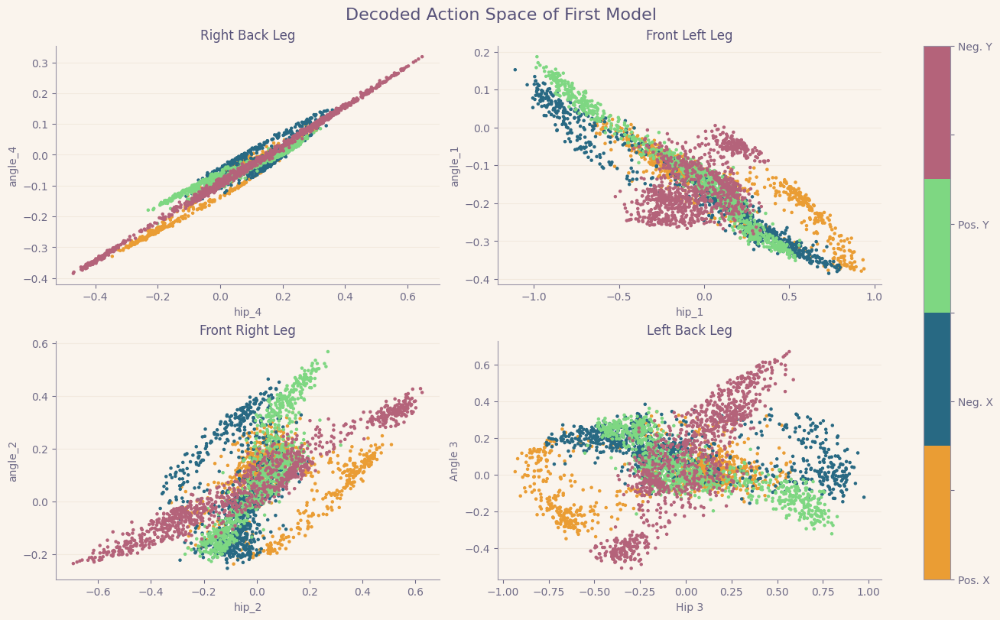

In [33]:
def action_sapce_after(x_test_decoded, y):
    """
    Plot the latent space.
    """
    fig, ax = plt.subplots(2, 2, figsize=(13, 8), constrained_layout=True)
    x = x_test_decoded
    ax[0, 0].scatter(x[:, 0], x[:, 1], c=y, cmap=cmap, s=5)
    ax[0, 0].set_title('Right Back Leg')
    ax[0, 0].set_xlabel('hip_4')
    ax[0, 0].set_ylabel('angle_4')

    ax[0, 1].scatter(x[:, 2], x[:, 3], c=y, cmap=cmap, s=5)
    ax[0, 1].set_title('Front Left Leg')
    ax[0, 1].set_xlabel('hip_1')
    ax[0, 1].set_ylabel('angle_1')

    ax[1, 0].scatter(x[:, 4], x[:, 5], c=y, cmap=cmap, s=5)
    ax[1, 0].set_title('Front Right Leg')
    ax[1, 0].set_xlabel('hip_2')
    ax[1, 0].set_ylabel('angle_2')

    ax[1, 1].scatter(x[:, 6], x[:, 7], c=y, cmap=cmap, s=5)
    ax[1, 1].set_title('Left Back Leg')
    ax[1, 1].set_xlabel('Hip 3')
    ax[1, 1].set_ylabel('Angle 3')
    
    # Add main title
    plt.suptitle('Decoded Action Space of First Model', fontsize=16)

    # Legend for the whole figure
    cbar = fig.colorbar(ax[0, 0].collections[0], ax=ax.ravel().tolist(), pad=0.05)
    
    # Custom formatter for the colorbar
    cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))
    
    plt.savefig('assets/images/Model1ActionSpace.png', dpi=300)

    plt.show()

x_test_decoded = decoder.predict(x_test_encoded[2], batch_size=100)

action_sapce_after(x_test_decoded, model2_df_sorted['y_test'].values)

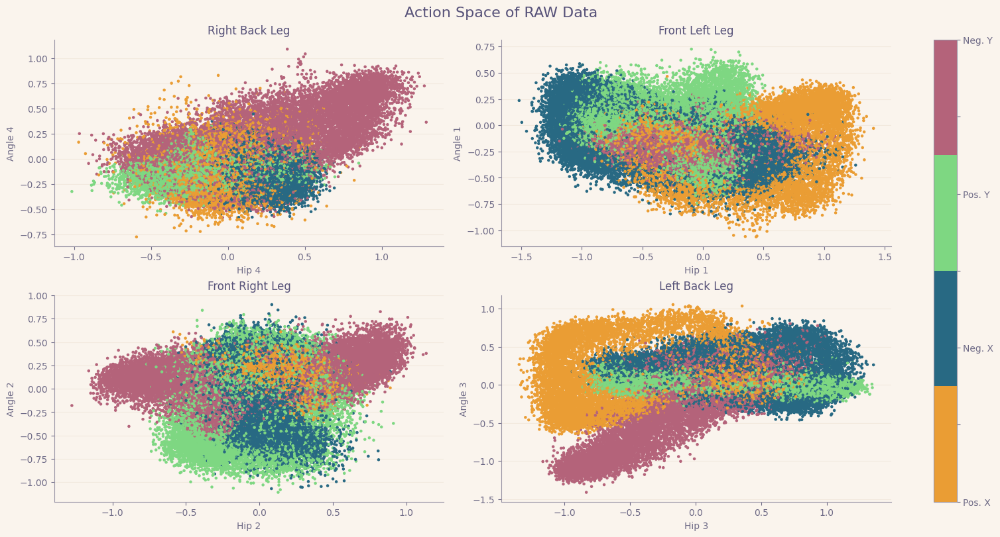

In [34]:
action_sapce_raw()

## Plotting original vs reconstructed actions

In [35]:
actions_encoded = encoder.predict(actions_newT, batch_size=100)
actions_decoded = decoder.predict(actions_encoded[2], batch_size=100)

ActionsVsActionsDecodedDF = pd.DataFrame({'a0': actions_newT[:][:, 0], 'ad0': actions_decoded[:][:, 0],
                                        'a1': actions_newT[:][:, 1], 'ad1': actions_decoded[:][:, 1],
                                        'a2': actions_newT[:][:, 2], 'ad2': actions_decoded[:][:, 2],
                                        'a3': actions_newT[:][:, 3], 'ad3': actions_decoded[:][:, 3],
                                        'a4': actions_newT[:][:, 4], 'ad4': actions_decoded[:][:, 4],
                                        'a5': actions_newT[:][:, 5], 'ad5': actions_decoded[:][:, 5],
                                        'a6': actions_newT[:][:, 6], 'ad6': actions_decoded[:][:, 6],
                                        'a7': actions_newT[:][:, 7], 'ad7': actions_decoded[:][:, 7]})

40/40 [==============================] - 0s 471us/step


40/40 [==============================] - 0s 917us/step


Each action is plotted against its reconstructed version. The MSE between original and reconstructed actions is displayed. This evaluates how well the VAE learned to represent the action space.

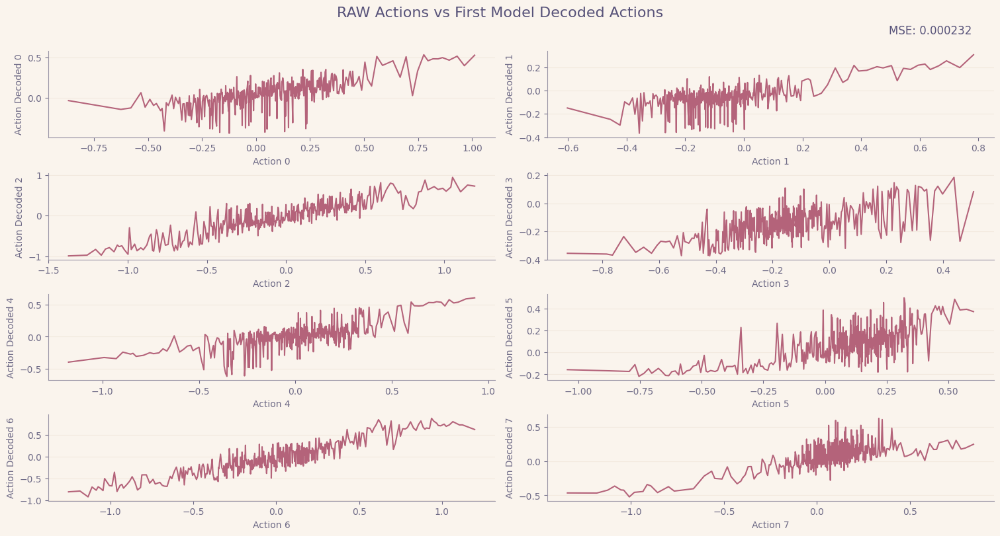

In [36]:
def inputs_outputs_plot(x, mse):
    """
    Plot the latent space.
    """

    skip = 10
    fig, ax = plt.subplots(4, 2, figsize=(15, 8), constrained_layout=True)
    x = x.sort_values(by='a0')
    ax[0, 0].plot(x[::skip]['a0'].values, x[::skip]['ad0'].values)
    ax[0, 0].set_xlabel('Action 0')
    ax[0, 0].set_ylabel('Action Decoded 0')

    x = x.sort_values(by='a1')
    ax[0, 1].plot(x[::skip]['a1'].values, x[::skip]['ad1'].values)
    ax[0, 1].set_xlabel('Action 1')
    ax[0, 1].set_ylabel('Action Decoded 1')

    x = x.sort_values(by='a2')
    ax[1, 0].plot(x[::skip]['a2'].values, x[::skip]['ad2'].values)
    ax[1, 0].set_xlabel('Action 2')
    ax[1, 0].set_ylabel('Action Decoded 2')

    x = x.sort_values(by='a3')
    ax[1, 1].plot(x[::skip]['a3'].values, x[::skip]['ad3'].values)
    ax[1, 1].set_xlabel('Action 3')
    ax[1, 1].set_ylabel('Action Decoded 3')

    x = x.sort_values(by='a4')
    ax[2, 0].plot(x[::skip]['a4'].values, x[::skip]['ad4'].values)
    ax[2, 0].set_xlabel('Action 4')
    ax[2, 0].set_ylabel('Action Decoded 4')

    x = x.sort_values(by='a5')
    ax[2, 1].plot(x[::skip]['a5'].values, x[::skip]['ad5'].values)
    ax[2, 1].set_xlabel('Action 5')
    ax[2, 1].set_ylabel('Action Decoded 5')

    x = x.sort_values(by='a6')
    ax[3, 0].plot(x[::skip]['a6'].values, x[::skip]['ad6'].values)
    ax[3, 0].set_xlabel('Action 6')
    ax[3, 0].set_ylabel('Action Decoded 6')

    x = x.sort_values(by='a7')
    ax[3, 1].plot(x[::skip]['a7'].values, x[::skip]['ad7'].values)
    ax[3, 1].set_xlabel('Action 7')
    ax[3, 1].set_ylabel('Action Decoded 7')

    plt.suptitle('RAW Actions vs First Model Decoded Actions', fontsize=16)
    ax[0, 1].text(0.95, 1.3, f'MSE: {mse}', fontsize=12, verticalalignment='top', horizontalalignment='right', transform=ax[0, 1].transAxes)

    plt.savefig('assets/images/Model1ActionVsDecoded.png', dpi=300)
    plt.show()

mse_model1 = np.sum((np.square(actions_new[:8] - actions_decoded[:8])) / len(actions_new))

inputs_outputs_plot(ActionsVsActionsDecodedDF, "{:.6f}".format(mse_model1))

### Storing data in global variable for final evaluation of all models

In [37]:
histories.append(loaded_history)
encoded_data_list.append([df_encoded[0].values, df_encoded[1].values])
labels_list.append(df_encoded['y_test'].values)
mse_values.append(mse_model1)

### Visualising decoded action taking input from latent space

In [38]:
x = np.cos(np.linspace(np.pi, -np.pi, 10000)) + 1
y = np.sin(np.linspace(np.pi, -np.pi, 10000)) + 0

encoded_x_y = np.column_stack((x, y))

decoded_x_y = decoder.predict(encoded_x_y, batch_size=100)

100/100 [==============================] - 0s 341us/step


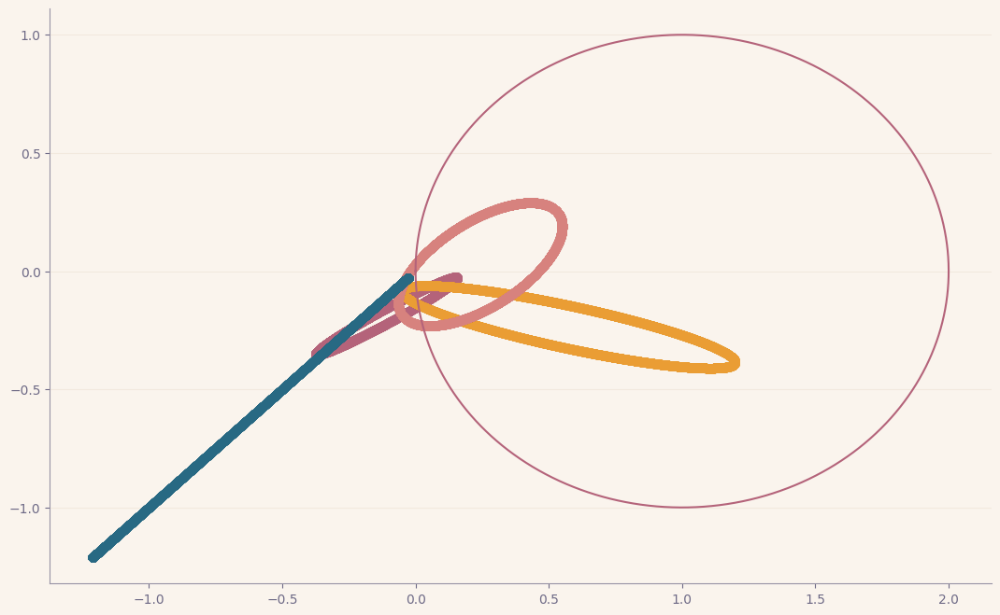

In [39]:
plt.figure(figsize=(13, 8))
plt.plot(x, y)
plt.scatter(decoded_x_y[:, 0], decoded_x_y[:, 1])
plt.scatter(decoded_x_y[:, 2], decoded_x_y[:, 3])
plt.scatter(decoded_x_y[:, 4], decoded_x_y[:, 5])
plt.scatter(decoded_x_y[:, 6], decoded_x_y[:, 6])

## Comparing RAW Ant and Decoded Coordinates 

In [40]:
x_raw_1 = []
y_raw_1 = []
rewards_1 = []

x_raw_dec_1 = []
y_raw_dec_1 = []
rewards_dec_1 = []

In [41]:
# Extract the segments
x_direction = infos_test[:1000]

# Extract x and y positions and plot for each segment
def extract_and_plot(segment, color, label):
    x = [entry[0]['x_position'] for entry in segment]
    y = [entry[0]['y_position'] for entry in segment]
    x_raw_1.append(x)
    y_raw_1.append(y)
    
# Plot each segment
extract_and_plot(x_direction, 'r', 'x direction')



In [42]:
env = gym.make("Ant-v4")
observation, info = env.reset()

for i in range(len(x_test_decoded)):
    action = x_test_decoded[i][0:8]
    _, reward, terminated, truncated, info = env.step(action)
    x_raw_dec_1.append(info['x_position'])
    y_raw_dec_1.append(info['y_position'])
    rewards_dec_1.append(reward)
    if i == 1000:
        break

env.close()

Text(0.5, 1.0, 'First Model RAW vs Decoded Coordinates')

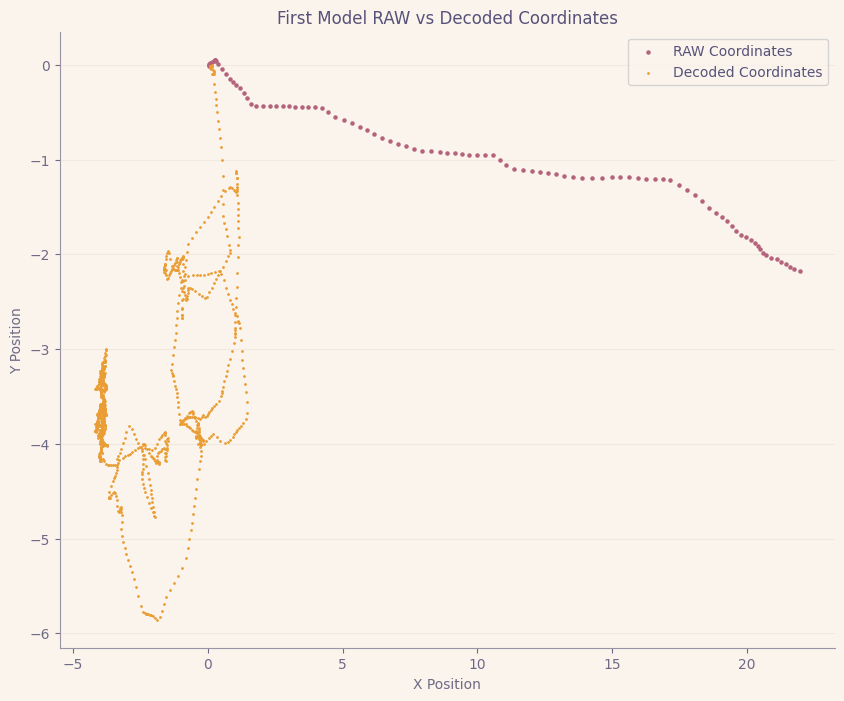

In [43]:
plt.figure(figsize=(10, 8))
plt.scatter(x_raw_1[0][:100], y_raw_1[0][:100],s=5, label='RAW Coordinates')
plt.scatter(x_raw_dec_1, y_raw_dec_1, s=1,label='Decoded Coordinates')

plt.legend()
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('First Model RAW vs Decoded Coordinates')

Text(0.5, 1.0, 'First Model RAW vs Decoded Action Rewards')

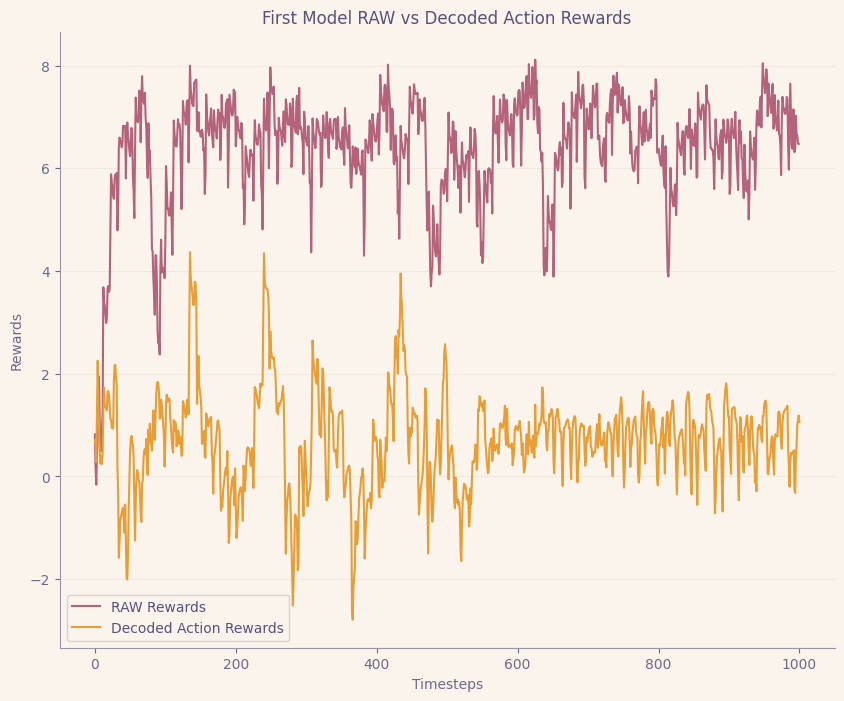

In [44]:
plt.figure(figsize=(10, 8))
plt.plot(rewards_test[:1000], label='RAW Rewards')
plt.plot(rewards_dec_1, label='Decoded Action Rewards')

plt.legend()
plt.xlabel('Timesteps')
plt.ylabel('Rewards')
plt.title('First Model RAW vs Decoded Action Rewards')

## Evaluating VAE model on Mujoco Ant environment

### First Method - Controling Ant with decoded actions sequence

This code takes a sequence of decoded actions and uses them to control the simulated Ant environment.

In the following cell, range is starting from 3000 index which means it should move in the negative y direction

In [45]:
# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# for i in range(1000):
#     action = x_test_decoded[30000+i][0:8]
#     _, reward, terminated, truncated, info = env.step(action)

#     if terminated or truncated:
#         observation, info = env.reset()

# env.close()

### Second Method

This code loads the Mujoco Ant environment and evaluates the trained VAE model by using the reconstructed actions to control the simulated ant. 

At each timestep, the closest reconstructed action is found by L2 norm and executed in the environment. This evaluates how well the VAE model learned to represent valid actions.
The episode is reset when the simulation terminates. The reconstructed actions are used to control the simulated ant and visualize the learned action space.

In [46]:
# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# for i in range(1000):
#     # if i == 1:
#     # action = env.action_space.sample()

#     # Calculate the L2 norm 
#     differences = [np.linalg.norm(action - decoded_action[0:8]) for decoded_action in actions_decoded]

#     closest_index = np.argmin(differences)

#     max_possible_difference = np.linalg.norm(action - np.zeros_like(action))
#     similarity_percentage = (1 - (differences[closest_index] / max_possible_difference)) * 100

#     action = actions_decoded[closest_index][0:8]
#     # print(f"The closest array to 'action' is at index {closest_index} in 'actions_decoded'")
#     # print(actions_decoded[closest_index][0:8])
#     # print(f"Similarity: {similarity_percentage:.2f}%")

#     # action = actions_decoded[i][0:8]
#     _, reward, terminated, truncated, info = env.step(action)
#     # observation

#     if terminated or truncated:
#         observation, info = env.reset()

# env.close()

### Third Method - Interactive latent space visualization with PyGame

This code creates an interactive visualization of the VAE latent space using PyGame where mouse clicks take actions in the Ant environment.

Clicking in the latent space decodes points to actions which are executed in the Ant environment. The last action is displayed as feedback. This provides an interactive visualization for exploring the learned latent space. User can also draw paths which will be decoded and implemented in the MuJoCo environment.

In [47]:
# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# # Initialize pygame
# pygame.init()

# # Define screen dimensions
# WIDTH, HEIGHT = 800, 600

# # Create a screen and a clock
# screen = pygame.display.set_mode((WIDTH, HEIGHT))
# pygame.display.set_caption("VAE 2D Latent Space")
# clock = pygame.time.Clock()

# font = pygame.font.SysFont(None, 25)  # Font for displaying text

# def decode_from_latent_space(latent_x, latent_y):
#     action = decoder.predict(np.column_stack((latent_x, latent_y)))
#     return action[0][0:8]

# def get_color_from_latent_position(x, y):
#     return (int(x * 255), int(y * 255), 200)  # Example RGB value

# # Main loop
# running = True
# drawing_path = False
# path_points = []
# action = []
# while running:
#     screen.fill((255, 255, 255))

#     for x in range(WIDTH):
#         for y in range(HEIGHT):
#             color = get_color_from_latent_position(x/WIDTH, y/HEIGHT)
#             screen.set_at((x, y), color)
    
#     for event in pygame.event.get():
#         if event.type == pygame.QUIT:
#             running = False

#         if event.type == pygame.KEYDOWN:
#             if event.key == pygame.K_q:
#                 running = False

#         if event.type == pygame.MOUSEBUTTONDOWN:
#             drawing_path = True
#             path_points = [(event.pos)]
        
#         if event.type == pygame.MOUSEMOTION and drawing_path:
#             path_points.append(event.pos)
        
#         if event.type == pygame.MOUSEBUTTONUP:
#             drawing_path = False
#             for x, y in path_points:
#                 latent_x = (x / WIDTH) * 2  - 1
#                 latent_y = (y / HEIGHT) * 2 - 1
                
#                 # print(f'{latent_x}, {latent_y}')
#                 action = decode_from_latent_space(latent_x, latent_y)
#                 _, reward, terminated, truncated, info = env.step(action)

#                 if terminated or truncated:
#                     observation, info = env.reset()

#             path_points = []

#     # Display feedback about the action 
#     feedback_text = font.render(f"Last Action: {action}", True, (0, 0, 0))
#     screen.blit(feedback_text, (10, 10))
    
#     pygame.display.flip()
#     clock.tick(60)


# pygame.quit()
# env.close()


### Fourth Method - Decoding latent space paths to action sequences with PyGame

This code takes a path drawn on the latent space visualization and decodes it into a sequence of actions.

- The `find_or_approximate` function finds the closest encoded point. 
- `decode_from_points` uses this to extract a sequence of points along the path which are decoded into a sequence of actions.

This allows interacting with the latent space visualization to extract semantically meaningful action sequences.

In [48]:
def find_or_approximate(df, col, value1, value2, third_col_value):
    value1 = (value1 / WIDTH) * 2 - 1
    value2 = (value2 / WIDTH) * 2 - 1

    # Filter based on third column's value
    if third_col_value is not None:
        df = df[df['y_test'] == third_col_value]

    # Calculate the absolute difference for both values in the filtered rows
    df['diff'] = (df[col[0]] - value1).abs() + (df[col[1]] - value2).abs()
    
    # Get the row with the minimum sum of absolute differences
    min_diff_row = df.loc[df['diff'].idxmin()]
    
    return min_diff_row.drop('diff')

def decode_from_points(path_points):
    a = find_or_approximate(df_encoded, [0, 1], path_points[0][0], path_points[0][1], None)
    # b = find_or_approximate(df_encoded, [0, 1], path_points[1][0], path_points[1][1], a['y_test'])
    b = find_or_approximate(df_encoded, [0, 1], path_points[1][0], path_points[1][1], None)

    # Extract all rows between a and b with the same y_test value
    start_idx, end_idx = sorted([a.name, b.name])  
    in_between_rows = df_encoded.loc[start_idx:end_idx]
    in_between_rows = in_between_rows[in_between_rows['y_test'] == a['y_test']]

    x_y = np.column_stack((in_between_rows[0], in_between_rows[1]))
    decoded_values = decoder.predict(x_y, batch_size=100)

    return decoded_values[::20]

This code allows drawing a path in the latent space visualization and executing the decoded action sequence in the environment.

Clicking two points draws a path, decodes it to actions, and executes the sequence in the environment.

This allows interactively exploring and exploiting the latent space to generate semantically meaningful sequences.

In [49]:
# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# # Initialize pygame
# pygame.init()

# # Define screen dimensions
# WIDTH, HEIGHT = 800, 600

# # Create a screen and a clock
# screen = pygame.display.set_mode((WIDTH, HEIGHT))
# pygame.display.set_caption("VAE 2D Latent Space")
# clock = pygame.time.Clock()

# font = pygame.font.SysFont(None, 25)  # Font for displaying text

# def decode_from_latent_space(latent_x, latent_y):
#     action = decoder.predict(np.column_stack((latent_x, latent_y)))
#     return action[0][0:8]

# def get_color_from_latent_position(x, y):
#     return (int(x * 255), int(y * 255), 200)  # Example RGB value

# # Main loop
# running = True
# drawing_path = False
# path_points = []
# action = []


# first_point = None
# last_point = None

# while running:
#     screen.fill((255, 255, 255))

#     for x in range(WIDTH):
#         for y in range(HEIGHT):
#             color = get_color_from_latent_position(x/WIDTH, y/HEIGHT)
#             screen.set_at((x, y), color)
    
#     for event in pygame.event.get():
#         if event.type == pygame.QUIT:
#             running = False

#         if event.type == pygame.KEYDOWN:
#             if event.key == pygame.K_q:
#                 running = False

#         if event.type == pygame.MOUSEBUTTONDOWN:
#             if first_point is None:
#                 first_point = event.pos
#             elif last_point is None:
#                 last_point = event.pos
#                 # Process the points from first_point to last_point
#                 path_points = [first_point, last_point]
#                 # print(path_points)
#                 decoded_values = decode_from_points(path_points)
#                 print(len(decoded_values))
#                 for i in range(len(decoded_values)):
#                     action = decoded_values[i][0:8]
#                     _, reward, terminated, truncated, info = env.step(action)

#                     # if terminated or truncated:
#                     #     observation, info = env.reset()
#                     # if i > 1000:
#                     #     break

#                 first_point = last_point
#                 last_point = None
#             else:
#                 pass
        
#     # Display feedback about the action 
#     feedback_text = font.render(f"Last Action: {action}", True, (0, 0, 0))
#     screen.blit(feedback_text, (10, 10))
    
#     pygame.display.flip()
#     clock.tick(60)



# pygame.quit()
# env.close()


# Second VAE Model Architecture with Action, Standardized Action, and Observation Space

This code defines the key components of a variational autoencoder (VAE) model:

- `original_dim` and `latent_dim` are constants that define the input dimension and latent space dimension respectively.
- `sampling()` is a sampling function that samples points from the latent space by taking the mean and log variance from the encoder and sampling using the reparameterization trick.
- `build_encoder()` defines the encoder architecture using Dense layers to encode the input down to the mean and log variance vectors describing the latent distribution.
- `build_decoder()` defines the mirrored decoder architecture using Dense layers to decode points from the latent space back to the original input dimensions.
- `vae_reconstruction_loss()` defines a custom reconstruction loss using mean squared error.
- `vae_kl_loss()` defines the custom KL divergence loss for the VAE.
- The data is split into train and test.
- The encoder and decoder models are instantiated using the builder functions.

In summary, this code is defining all the key components of a VAE - the encoder, decoder, loss functions, and data pipeline. The encoder maps the data to a latent distribution, the decoder reconstructs back to the original data space, and the losses optimize the reconstruction and regularize the latent space. This provides the full specification of a VAE architecture before training.

In [50]:
# Constants
original_dim = 70
latent_dim = 2
learning_rate = 0.001  
kl_weight = 0.01 

def sampling(args):
    """Sampling function to sample from the latent space."""
    z_mean, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim), mean=0., stddev=0.1)
    return z_mean + K.exp(z_log_sigma) * epsilon

def build_encoder(input_shape, latent_dim):
    """Build the encoder network."""
    inputs = Input(shape=input_shape)
    x = Dropout(0.25)(inputs)
    
    # Encode the input data
    for units in [60, 50, 50, 40, 30, 20]:
        x = Dense(units)(x)
        x = LeakyReLU()(x)
    
    z_mean = Dense(latent_dim)(x)
    z_log_sigma = Dense(latent_dim)(x)
    
    z = Lambda(sampling)([z_mean, z_log_sigma])
    
    return Model(inputs, [z_mean, z_log_sigma, z], name='encoder')

def build_decoder(latent_dim, output_shape):
    """Build the decoder network."""
    latent_inputs = Input(shape=(latent_dim,))
    x = latent_inputs
    
    # Decode the latent data
    for units in [20, 30, 40, 50, 50, 60]:
        x = Dense(units, activation='linear')(x)
    
    outputs = Dense(output_shape, activation='linear')(x)
    
    return Model(latent_inputs, outputs, name='decoder')

def vae_reconstruction_loss(y_true, y_pred):
    """Custom reconstruction loss."""
    return MSE(y_true, y_pred) * original_dim

def vae_kl_loss(z_mean, z_log_sigma):
    """Custom KL divergence loss."""
    kl_loss = 1 + z_log_sigma - K.square(z_mean) - K.exp(z_log_sigma)
    return -0.5 * kl_weight * K.sum(kl_loss, axis=-1)

# Split data
# x_train, x_test, y_train, y_test, index_train, index_test = train_test_split(actions_observations, labels, index, test_size=0.10, random_state=42)
x_train = actions_observations
x_test = actions_observationsT

# Build Encoder and Decoder
encoder = build_encoder((original_dim,), latent_dim)
decoder = build_decoder(latent_dim, original_dim)

In [51]:
# Instantiate VAE model
inputs = Input(shape=(original_dim,))
outputs = decoder(encoder(inputs)[2])
vae = Model(inputs, outputs, name='vae_mlp')

reconstruction_loss = vae_reconstruction_loss(inputs, outputs)
kl_loss = vae_kl_loss(encoder(inputs)[0], encoder(inputs)[1])
vae_loss = K.mean(reconstruction_loss + kl_loss)

vae.add_loss(vae_loss)
vae.add_metric(reconstruction_loss, name='reconstruction_loss')
vae.add_metric(kl_loss, name='kl_loss')
vae.compile(optimizer=SGD(learning_rate))

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-10, verbose=1),
    EarlyStopping(monitor='val_loss', patience=50, verbose=1, restore_best_weights=True),
    ModelCheckpoint('assets/model2/model.h5', save_best_only=True, save_format='tf')
]

### Training and saving the VAE model

In [52]:
# history = vae.fit(x_train, x_train, epochs=1000, batch_size=256, validation_data=(x_test, x_test), callbacks=callbacks)

In [53]:
# # Saving the models
# encoder.save("assets/model2/vae_encoder.h5")
# decoder.save("assets/model2/vae_decoder.h5")

# # Save history
# with open('assets/model2/train_history.pkl', 'wb') as file:
#     pickle.dump(history.history, file)

### Loading the saved VAE Model

In [54]:
# Loading the models
encoder = load_model("assets/model2/vae_encoder.h5")
decoder = load_model("assets/model2/vae_decoder.h5")

# Load history
with open('assets/model2/train_history.pkl', 'rb') as file:
    loaded_history = pickle.load(file)

# Recreate the VAE model
inputs_reconstructed = Input(shape=(original_dim,))
outputs_reconstructed = decoder(encoder(inputs_reconstructed)[2])
vae_reconstructed = Model(inputs_reconstructed, outputs_reconstructed, name='reconstructed_vae_mlp')

reconstruction_loss_reconstructed = vae_reconstruction_loss(inputs_reconstructed, outputs_reconstructed)
kl_loss_reconstructed = vae_kl_loss(encoder(inputs_reconstructed)[0], encoder(inputs_reconstructed)[1])
vae_loss_reconstructed = K.mean(reconstruction_loss_reconstructed + kl_loss_reconstructed)

vae_reconstructed.add_loss(vae_loss_reconstructed)
vae_reconstructed.add_metric(reconstruction_loss_reconstructed, name='reconstruction_loss')
vae_reconstructed.add_metric(kl_loss_reconstructed, name='kl_loss')
vae_reconstructed.compile(optimizer=SGD(learning_rate))

### Plotting Total, Recostruction and KL Divergence Loss

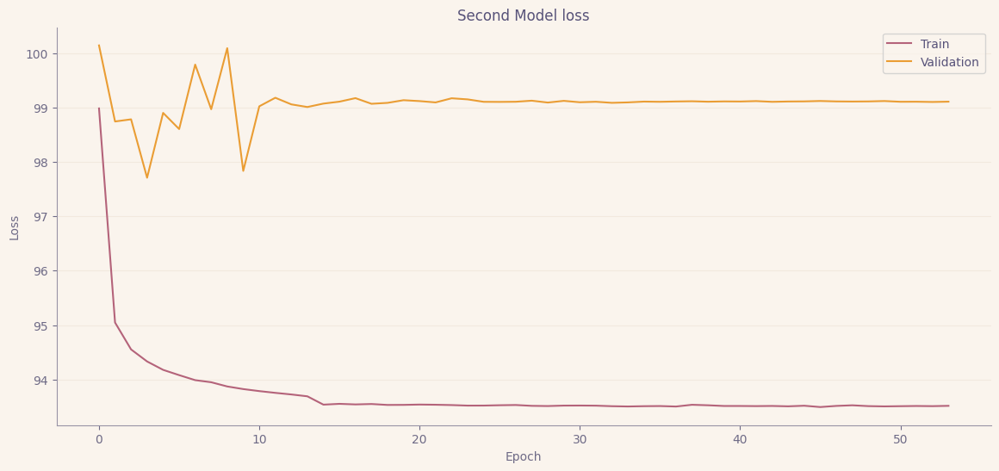

In [55]:
# Plot training & validation loss values
plt.figure(figsize=(14, 6))
plt.plot(loaded_history['loss'])
plt.plot(loaded_history['val_loss'])
plt.title('Second Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

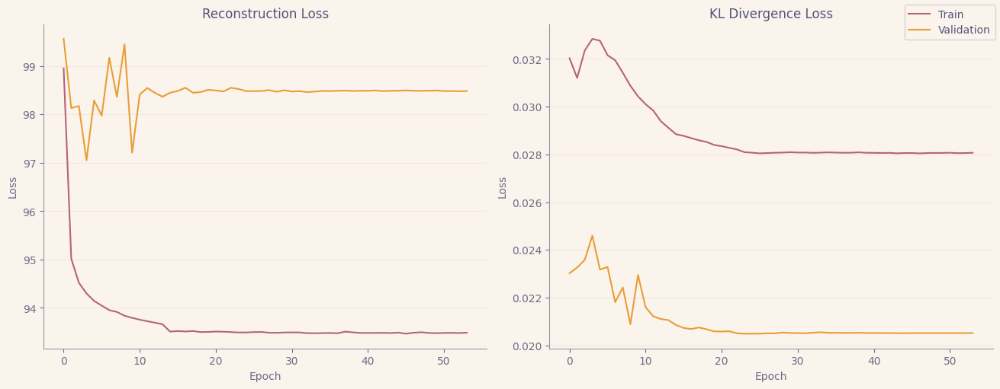

In [56]:
fig, ax = plt.subplots(1, 2, figsize=(13, 5), constrained_layout=True)

ax[0].plot(loaded_history['reconstruction_loss'])
ax[0].plot(loaded_history['val_reconstruction_loss'])
ax[0].set_title('Reconstruction Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')

ax[1].plot(loaded_history['kl_loss'])
ax[1].plot(loaded_history['val_kl_loss'])
ax[1].set_title('KL Divergence Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')

fig.legend(['Train', 'Validation'], loc='upper right')

### Evaluation of Second Model

In the following cells, preprocessing of the test dataset, latent space, timeseries of data will take place. 

In [57]:
df_x_test = pd.DataFrame(x_test)

model2_df = pd.concat([
    df_x_test,
    pd.DataFrame({
        'y_test': y_test,
        'index_test': index_test
    }, index=df_x_test.index)
], axis=1)

# model2_df

model2_df_sorted = model2_df.sort_values(by='index_test')
model2_df_sorted

x_test_sorted = model2_df_sorted.iloc[:, 0:70].values
# x_test_sorted


In [58]:
x_test_encoded = encoder.predict(x_test_sorted, batch_size=100)

df_x_test_enc = pd.DataFrame(x_test_encoded[2])

df_encoded = pd.concat([
    df_x_test_enc,
    pd.DataFrame({
        'y_test': model2_df_sorted['y_test'].values,
        'index_test': model2_df_sorted['index_test'].values
    }, index=df_x_test_enc.index)
], axis=1)

df_encoded

40/40 [==============================] - 0s 566us/step


,0,1,y_test,index_test
0,-0.208102,0.260154,0.0,0
1,-0.438110,-0.556514,0.0,1
2,0.002041,-1.473096,0.0,2
3,0.444667,-1.143818,0.0,3
4,1.678712,-0.118730,0.0,4
...,...,...,...,...
3995,2.562292,-3.362488,3.0,3995
3996,-0.507425,0.410727,3.0,3996
3997,-0.326166,0.415566,3.0,3997
3998,0.173551,0.408620,3.0,3998


### Latent Space of Second VAE Model

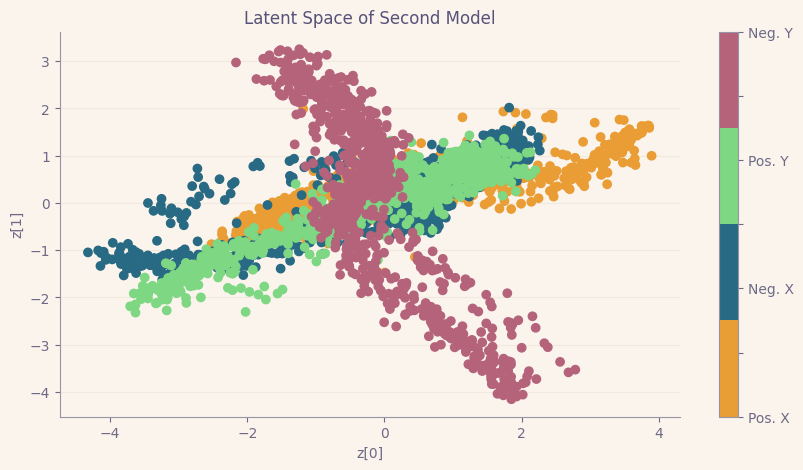

In [59]:
plt.figure(figsize=(10, 5))
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap)
cbar = plt.colorbar()
cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.title('Latent Space of Second Model')
plt.savefig('assets/images/SecondModelLatent.png', dpi=300)
plt.show()

### Timeseries of test dataset on Latent Space

The plot shows how sequences of data move through the 2D latent space over timesteps. Points are colored by label. The plot visualizes the latent space mapping learned by the VAE model.

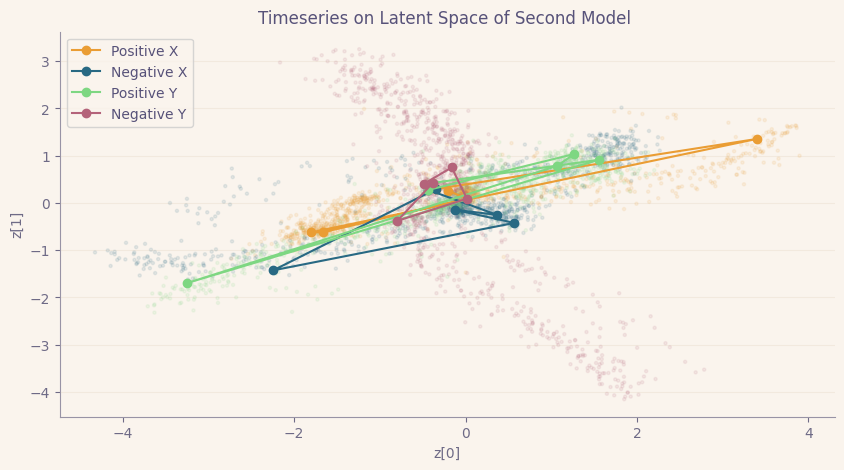

In [60]:
plt.figure(figsize=(10, 5))
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap, s=5, alpha=0.1)
colors = ['#EA9D34', '#286983', '#7ED782', '#B4637A']
lab = ["Positive X", "Negative X", "Positive Y", "Negative Y"]

skip = 200
for i in range(4):
    selected_rows = df_encoded[(df_encoded['index_test'] >= i*1000) & (df_encoded['index_test'] <= (i+1)*1000)]
    selected_rows = selected_rows[::skip]
    plt.plot(selected_rows[0].values, selected_rows[1].values, '-o', color=colors[i], alpha=1, label=lab[i])
    

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.legend()
plt.title('Timeseries on Latent Space of Second Model ')
plt.savefig('assets/images/SecondModelTimeseries.png', dpi=300)
plt.show()

### Visualizing Action Space after VAE training

The reconstructed action space is visualized to see how well the VAE model learned the underlying structure.

 1/40 [..............................] - ETA: 1s

40/40 [==============================] - 0s 663us/step


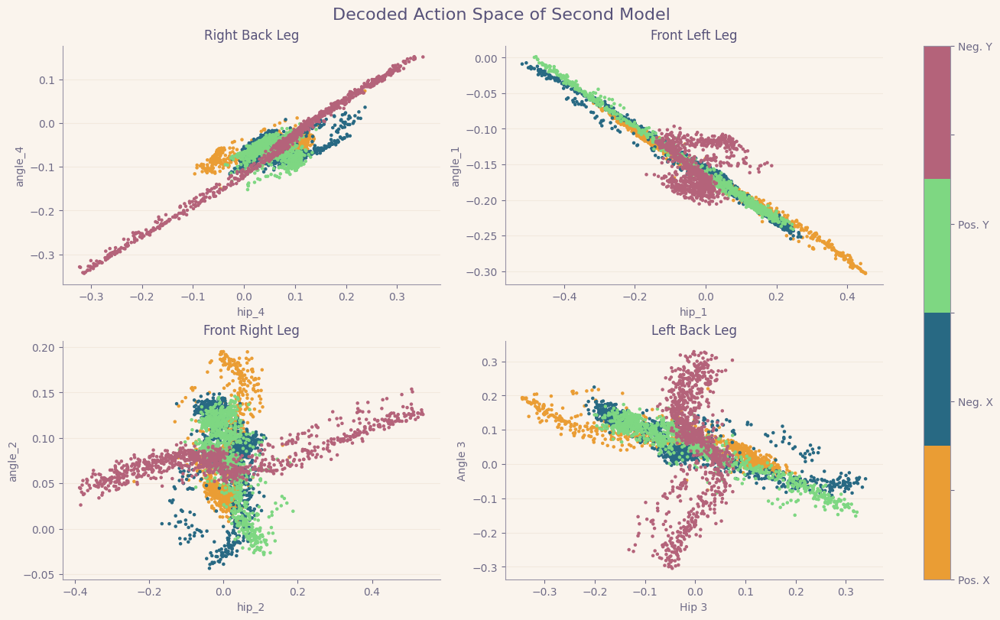

In [61]:
def action_sapce_after(x_test_decoded, y):
    """
    Plot the latent space.
    """
    fig, ax = plt.subplots(2, 2, figsize=(13, 8), constrained_layout=True)
    x = x_test_decoded
    ax[0, 0].scatter(x[:, 0], x[:, 1], c=y, cmap=cmap, s=5)
    ax[0, 0].set_title('Right Back Leg')
    ax[0, 0].set_xlabel('hip_4')
    ax[0, 0].set_ylabel('angle_4')

    ax[0, 1].scatter(x[:, 2], x[:, 3], c=y, cmap=cmap, s=5)
    ax[0, 1].set_title('Front Left Leg')
    ax[0, 1].set_xlabel('hip_1')
    ax[0, 1].set_ylabel('angle_1')

    ax[1, 0].scatter(x[:, 4], x[:, 5], c=y, cmap=cmap, s=5)
    ax[1, 0].set_title('Front Right Leg')
    ax[1, 0].set_xlabel('hip_2')
    ax[1, 0].set_ylabel('angle_2')

    ax[1, 1].scatter(x[:, 6], x[:, 7], c=y, cmap=cmap, s=5)
    ax[1, 1].set_title('Left Back Leg')
    ax[1, 1].set_xlabel('Hip 3')
    ax[1, 1].set_ylabel('Angle 3')
    
    # Add main title
    plt.suptitle('Decoded Action Space of Second Model', fontsize=16)

    # Legend for the whole figure
    cbar = fig.colorbar(ax[0, 0].collections[0], ax=ax.ravel().tolist(), pad=0.05)
    
    # Custom formatter for the colorbar
    cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))
    
    plt.savefig('assets/images/Model2ActionSpace.png', dpi=300)

    plt.show()

x_test_decoded = decoder.predict(x_test_encoded[2], batch_size=100)

action_sapce_after(x_test_decoded, model2_df_sorted['y_test'].values)

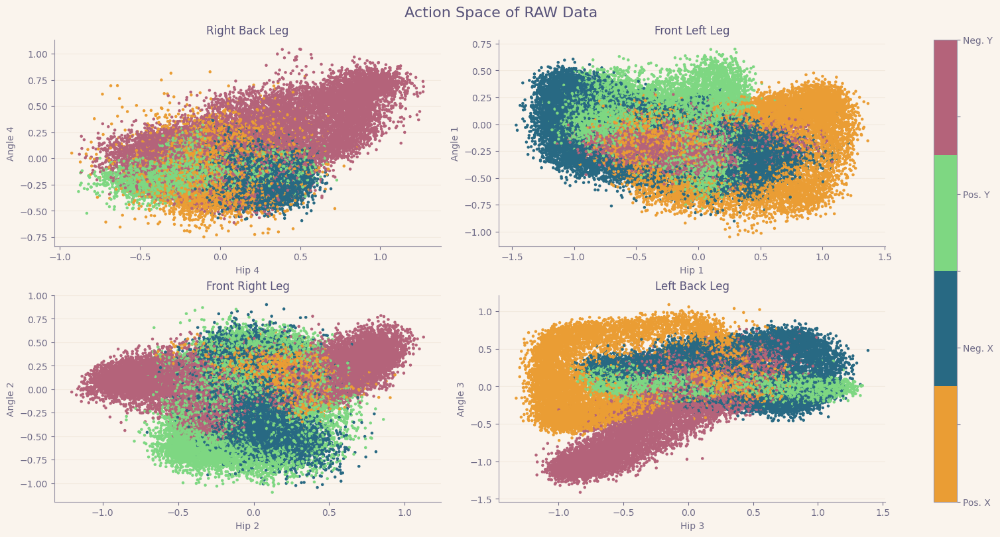

In [62]:
action_sapce_raw()

## Plotting original vs reconstructed actions

In [63]:
actions_obs_encoded = encoder.predict(actions_observationsT, batch_size=100)
actions_obs_decoded = decoder.predict(actions_obs_encoded[2], batch_size=100)

ActionsVsActionsDecodedDF_obs = pd.DataFrame({'a0': actions_observationsT[:][:, 0], 'ad0': actions_obs_decoded[:][:, 0],
                                        'a1': actions_observationsT[:][:, 1], 'ad1': actions_obs_decoded[:][:, 1],
                                        'a2': actions_observationsT[:][:, 2], 'ad2': actions_obs_decoded[:][:, 2],
                                        'a3': actions_observationsT[:][:, 3], 'ad3': actions_obs_decoded[:][:, 3],
                                        'a4': actions_observationsT[:][:, 4], 'ad4': actions_obs_decoded[:][:, 4],
                                        'a5': actions_observationsT[:][:, 5], 'ad5': actions_obs_decoded[:][:, 5],
                                        'a6': actions_observationsT[:][:, 6], 'ad6': actions_obs_decoded[:][:, 6],
                                        'a7': actions_observationsT[:][:, 7], 'ad7': actions_obs_decoded[:][:, 7]})

40/40 [==============================] - 0s 500us/step


40/40 [==============================] - 0s 888us/step


Each action is plotted against its reconstructed version. The MSE between original and reconstructed actions is displayed. This evaluates how well the VAE learned to represent the action space.

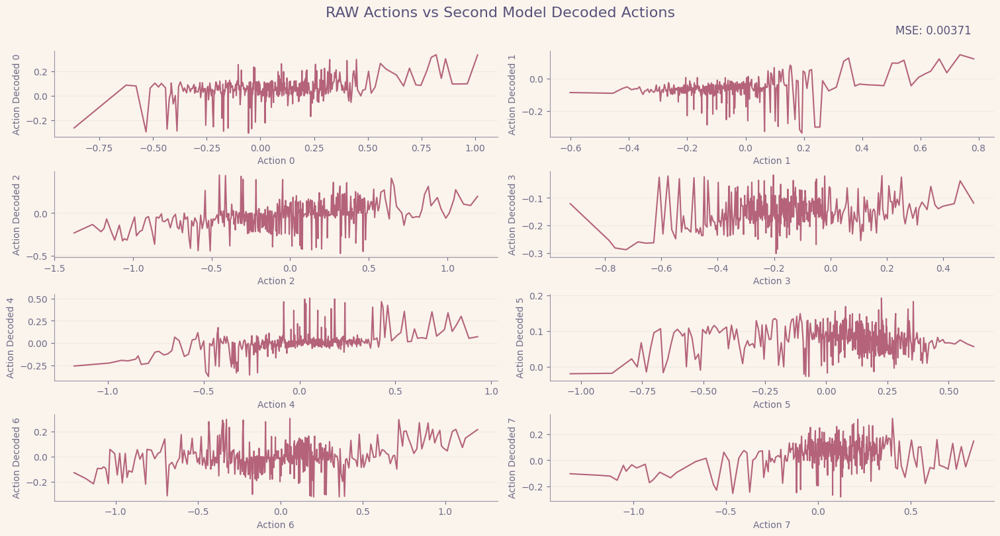

In [64]:
def inputs_outputs_plot(x, mse):
    """
    Plot the latent space.
    """
    # Set the default color cycle

    skip = 10
    fig, ax = plt.subplots(4, 2, figsize=(15, 8), constrained_layout=True)
    x = x.sort_values(by='a0')
    ax[0, 0].plot(x[::skip]['a0'].values, x[::skip]['ad0'].values)
    ax[0, 0].set_xlabel('Action 0')
    ax[0, 0].set_ylabel('Action Decoded 0')

    x = x.sort_values(by='a1')
    ax[0, 1].plot(x[::skip]['a1'].values, x[::skip]['ad1'].values)
    ax[0, 1].set_xlabel('Action 1')
    ax[0, 1].set_ylabel('Action Decoded 1')

    x = x.sort_values(by='a2')
    ax[1, 0].plot(x[::skip]['a2'].values, x[::skip]['ad2'].values)
    ax[1, 0].set_xlabel('Action 2')
    ax[1, 0].set_ylabel('Action Decoded 2')

    x = x.sort_values(by='a3')
    ax[1, 1].plot(x[::skip]['a3'].values, x[::skip]['ad3'].values)
    ax[1, 1].set_xlabel('Action 3')
    ax[1, 1].set_ylabel('Action Decoded 3')

    x = x.sort_values(by='a4')
    ax[2, 0].plot(x[::skip]['a4'].values, x[::skip]['ad4'].values)
    ax[2, 0].set_xlabel('Action 4')
    ax[2, 0].set_ylabel('Action Decoded 4')

    x = x.sort_values(by='a5')
    ax[2, 1].plot(x[::skip]['a5'].values, x[::skip]['ad5'].values)
    ax[2, 1].set_xlabel('Action 5')
    ax[2, 1].set_ylabel('Action Decoded 5')

    x = x.sort_values(by='a6')
    ax[3, 0].plot(x[::skip]['a6'].values, x[::skip]['ad6'].values)
    ax[3, 0].set_xlabel('Action 6')
    ax[3, 0].set_ylabel('Action Decoded 6')

    x = x.sort_values(by='a7')
    ax[3, 1].plot(x[::skip]['a7'].values, x[::skip]['ad7'].values)
    ax[3, 1].set_xlabel('Action 7')
    ax[3, 1].set_ylabel('Action Decoded 7')

    # Add main title
    plt.suptitle('RAW Actions vs Second Model Decoded Actions', fontsize=16)
    ax[0, 1].text(0.95, 1.3, f'MSE: {mse}', fontsize=12, verticalalignment='top', horizontalalignment='right', transform=ax[0, 1].transAxes)

    plt.savefig('assets/images/Model2ActionVsDecoded.png', dpi=300)
    plt.show()

mse_model2 = np.sum((np.square(actions_observations[:8] - actions_obs_decoded[:8])) / len(actions_new))

inputs_outputs_plot(ActionsVsActionsDecodedDF_obs, "{:.5f}".format(mse_model2))

### Storing data in global variable for final evaluation of all models

In [65]:
histories.append(loaded_history)
encoded_data_list.append([df_encoded[0].values, df_encoded[1].values])
labels_list.append(df_encoded['y_test'].values)
mse_values.append(mse_model1)

## Comparing RAW Ant and Decoded Coordinates 

Plotting the x and y position of the RAW data vs x and y position of the decoded action values to compare the outcome of the model.

In [66]:
x_raw_dec_2 = []
y_raw_dec_2 = []
rewards_dec_2 = []

In [67]:
env = gym.make("Ant-v4")
observation, info = env.reset()

for i in range(len(x_test_decoded)):
    action = x_test_decoded[i][0:8]
    _, reward, terminated, truncated, info = env.step(action)
    x_raw_dec_2.append(info['x_position'])
    y_raw_dec_2.append(info['y_position'])
    rewards_dec_2.append(reward)
    if i == 1000:
        break

env.close()

Text(0.5, 1.0, 'Second Model RAW vs Decoded Coordinates')

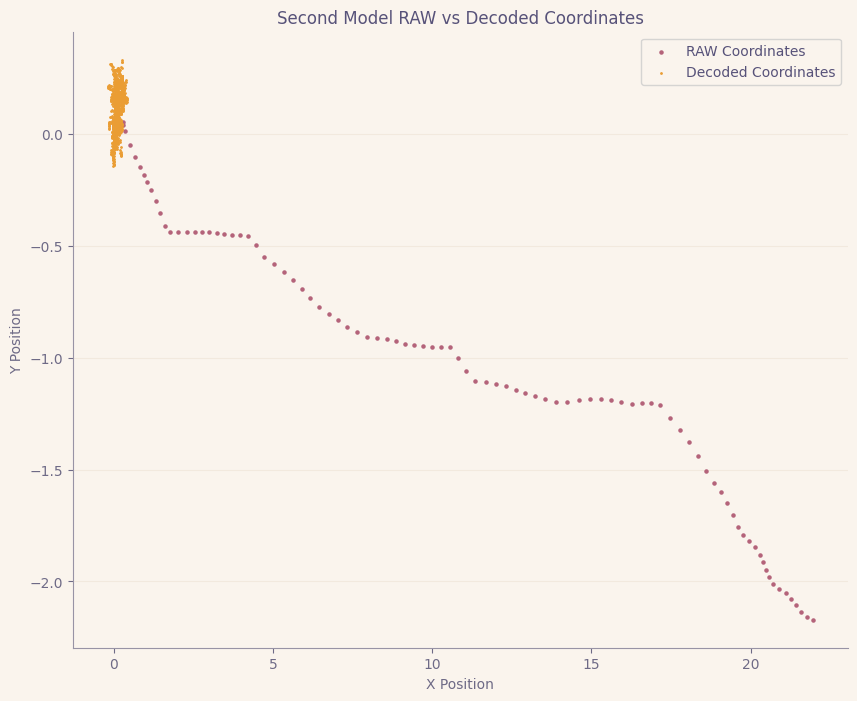

In [68]:
plt.figure(figsize=(10, 8))
plt.scatter(x_raw_1[0][:100], y_raw_1[0][:100],s=5, label='RAW Coordinates')
plt.scatter(x_raw_dec_2, y_raw_dec_2, s=1,label='Decoded Coordinates')

plt.legend()
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Second Model RAW vs Decoded Coordinates')

Text(0.5, 1.0, 'Second Model RAW vs Decoded Action Rewards')

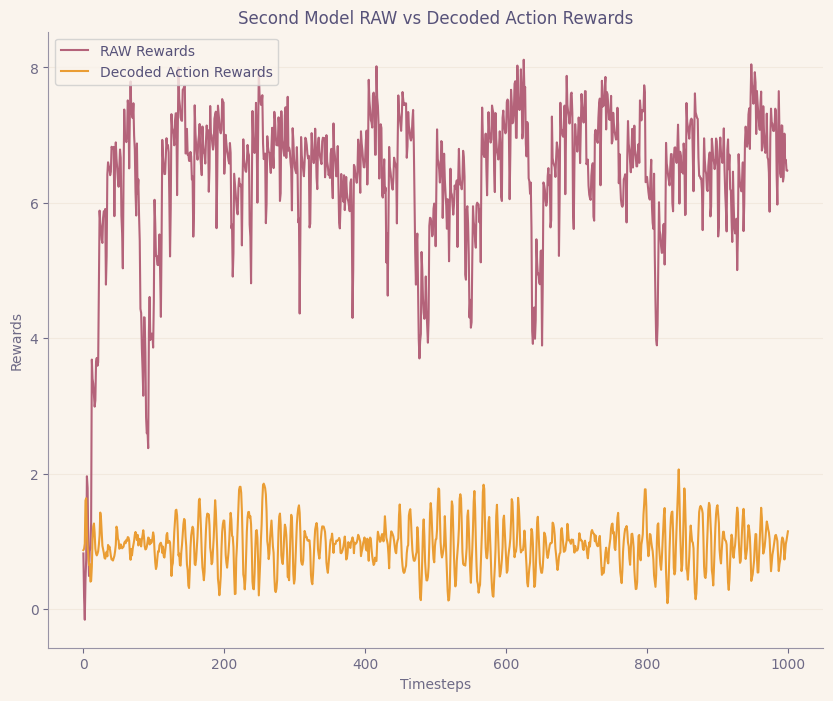

In [69]:
plt.figure(figsize=(10, 8))
plt.plot(rewards_test[:1000], label='RAW Rewards')
plt.plot(rewards_dec_2, label='Decoded Action Rewards')

plt.legend()
plt.xlabel('Timesteps')
plt.ylabel('Rewards')
plt.title('Second Model RAW vs Decoded Action Rewards')

## Evaluating VAE model on Mujoco Ant environment

### First Method - Controling Ant with decoded actions sequence

This code takes a sequence of decoded actions and uses them to control the simulated Ant environment.

In the following cell, range is starting from 3000 index which means it should move in the negative y direction

In [70]:
# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# for i in range(1000):
#     action = x_test_decoded[30000+i][0:8]
#     _, reward, terminated, truncated, info = env.step(action)

#     if terminated or truncated:
#         observation, info = env.reset()

# env.close()

### Second Method - Decoding latent space paths to action sequences with PyGame

This code takes a path drawn on the latent space visualization and decodes it into a sequence of actions.

- The `find_or_approximate` function finds the closest encoded point. 
- `decode_from_points` uses this to extract a sequence of points along the path which are decoded into a sequence of actions.

This allows interacting with the latent space visualization to extract semantically meaningful action sequences.

In [71]:
def find_or_approximate(df, col, value1, value2, third_col_value):
    value1 = (value1 / WIDTH) * 2 - 2
    value2 = (value2 / WIDTH) * 2 - 2

    # Filter based on third column's value
    if third_col_value is not None:
        df = df[df['y_test'] == third_col_value]

    # Calculate the absolute difference for both values in the filtered rows
    df['diff'] = (df[col[0]] - value1).abs() + (df[col[1]] - value2).abs()
    
    # Get the row with the minimum sum of absolute differences
    min_diff_row = df.loc[df['diff'].idxmin()]
    
    return min_diff_row.drop('diff')

def decode_from_points(path_points):
    a = find_or_approximate(df_encoded, [0, 1], path_points[0][0], path_points[0][1], None)
    b = find_or_approximate(df_encoded, [0, 1], path_points[1][0], path_points[1][1], a['y_test'])

    # Extract all rows between a and b with the same y_test value
    start_idx, end_idx = sorted([a.name, b.name])  
    in_between_rows = df_encoded.loc[start_idx:end_idx]
    in_between_rows = in_between_rows[in_between_rows['y_test'] == a['y_test']]

    x_y = np.column_stack((in_between_rows[0], in_between_rows[1]))
    decoded_values = decoder.predict(x_y, batch_size=100)

    return decoded_values[::20]

This code allows drawing a path in the latent space visualization and executing the decoded action sequence in the environment.

Clicking two points draws a path, decodes it to actions, and executes the sequence in the environment.

This allows interactively exploring and exploiting the latent space to generate semantically meaningful sequences.

In [72]:
# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# # Initialize pygame
# pygame.init()

# # Define screen dimensions
# WIDTH, HEIGHT = 800, 600

# # Create a screen and a clock
# screen = pygame.display.set_mode((WIDTH, HEIGHT))
# pygame.display.set_caption("VAE 2D Latent Space")
# clock = pygame.time.Clock()

# font = pygame.font.SysFont(None, 25)  # Font for displaying text

# def decode_from_latent_space(latent_x, latent_y):
#     action = decoder.predict(np.column_stack((latent_x, latent_y)))
#     return action[0][0:8]

# def get_color_from_latent_position(x, y):
#     return (int(x * 255), int(y * 255), 200)  # Example RGB value

# # Main loop
# running = True
# drawing_path = False
# path_points = []
# action = []


# first_point = None
# last_point = None

# while running:
#     screen.fill((255, 255, 255))

#     for x in range(WIDTH):
#         for y in range(HEIGHT):
#             color = get_color_from_latent_position(x/WIDTH, y/HEIGHT)
#             screen.set_at((x, y), color)
    
#     for event in pygame.event.get():
#         if event.type == pygame.QUIT:
#             running = False

#         if event.type == pygame.KEYDOWN:
#             if event.key == pygame.K_q:
#                 running = False

#         if event.type == pygame.MOUSEBUTTONDOWN:
#             if first_point is None:
#                 first_point = event.pos
#             elif last_point is None:
#                 last_point = event.pos
#                 # Process the points from first_point to last_point
#                 path_points = [first_point, last_point]
#                 # print(path_points)
#                 decoded_values = decode_from_points(path_points)
#                 print(len(decoded_values))
#                 for i in range(len(decoded_values)):
#                     action = decoded_values[i][0:8]
#                     _, reward, terminated, truncated, info = env.step(action)

#                     # if terminated or truncated:
#                     #     observation, info = env.reset()
#                     if i > 1000:
#                         break

#                 first_point = last_point
#                 last_point = None
#             else:
#                 pass
        
#     # Display feedback about the action 
#     feedback_text = font.render(f"Last Action: {action}", True, (0, 0, 0))
#     screen.blit(feedback_text, (10, 10))
    
#     pygame.display.flip()
#     clock.tick(60)



# pygame.quit()
# env.close()


# Third VAE Model Architecture with Action, Standardized Action, Observations and Difference Actions Space

This code defines the key components of a variational autoencoder (VAE) model:

- `original_dim` and `latent_dim` are constants that define the input dimension and latent space dimension respectively.
- `sampling()` is a sampling function that samples points from the latent space by taking the mean and log variance from the encoder and sampling using the reparameterization trick.
- `build_encoder()` defines the encoder architecture using Dense layers to encode the input down to the mean and log variance vectors describing the latent distribution.
- `build_decoder()` defines the mirrored decoder architecture using Dense layers to decode points from the latent space back to the original input dimensions.
- `vae_reconstruction_loss()` defines a custom reconstruction loss using mean squared error.
- `vae_kl_loss()` defines the custom KL divergence loss for the VAE.
- The data is split into train and test.
- The encoder and decoder models are instantiated using the builder functions.

In summary, this code is defining all the key components of a VAE - the encoder, decoder, loss functions, and data pipeline. The encoder maps the data to a latent distribution, the decoder reconstructs back to the original data space, and the losses optimize the reconstruction and regularize the latent space. This provides the full specification of a VAE architecture before training.

In [73]:
# Constants
original_dim = 78
latent_dim = 2
learning_rate = 0.001  
kl_weight = 0.01 

def sampling(args):
    """Sampling function to sample from the latent space."""
    z_mean, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim), mean=0., stddev=0.1)
    return z_mean + K.exp(z_log_sigma) * epsilon

def build_encoder(input_shape, latent_dim):
    """Build the encoder network."""
    inputs = Input(shape=input_shape)
    x = Dropout(0.25)(inputs)
    
    # Encode the input data
    for units in [60, 50, 50, 40, 30, 20]:
        x = Dense(units)(x)
        x = LeakyReLU()(x)
    
    z_mean = Dense(latent_dim)(x)
    z_log_sigma = Dense(latent_dim)(x)
    
    z = Lambda(sampling)([z_mean, z_log_sigma])
    
    return Model(inputs, [z_mean, z_log_sigma, z], name='encoder')

def build_decoder(latent_dim, output_shape):
    """Build the decoder network."""
    latent_inputs = Input(shape=(latent_dim,))
    x = latent_inputs
    
    # Decode the latent data
    for units in [20, 30, 40, 50, 50, 60]:
        x = Dense(units, activation='linear')(x)
    
    outputs = Dense(output_shape, activation='linear')(x)
    
    return Model(latent_inputs, outputs, name='decoder')

def vae_reconstruction_loss(y_true, y_pred):
    """Custom reconstruction loss."""
    return MSE(y_true, y_pred) * original_dim

def vae_kl_loss(z_mean, z_log_sigma):
    """Custom KL divergence loss."""
    kl_loss = 1 + z_log_sigma - K.square(z_mean) - K.exp(z_log_sigma)
    return -0.5 * kl_weight * K.sum(kl_loss, axis=-1)

# Split data
# x_train, x_test, y_train, y_test, index_train, index_test = train_test_split(actions_obs_diff_act, labels, index, test_size=0.10, random_state=42)
x_train = actions_obs_diff_act
x_test = actions_obs_diff_actT

# Build Encoder and Decoder
encoder = build_encoder((original_dim,), latent_dim)
decoder = build_decoder(latent_dim, original_dim)

In [74]:
# Instantiate VAE model
inputs = Input(shape=(original_dim,))
outputs = decoder(encoder(inputs)[2])
vae = Model(inputs, outputs, name='vae_mlp')

reconstruction_loss = vae_reconstruction_loss(inputs, outputs)
kl_loss = vae_kl_loss(encoder(inputs)[0], encoder(inputs)[1])
vae_loss = K.mean(reconstruction_loss + kl_loss)

vae.add_loss(vae_loss)
vae.add_metric(reconstruction_loss, name='reconstruction_loss')
vae.add_metric(kl_loss, name='kl_loss')
vae.compile(optimizer=SGD(learning_rate))

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-10, verbose=1),
    EarlyStopping(monitor='val_loss', patience=50, verbose=1, restore_best_weights=True),
    ModelCheckpoint('assets/model3/model.h5', save_best_only=True, save_format='tf')
]

### Training and saving the VAE model

In [75]:
# history = vae.fit(x_train, x_train, epochs=1000, batch_size=256, validation_data=(x_test, x_test), callbacks=callbacks)

In [76]:
# # Saving the models
# encoder.save("assets/model3/vae_encoder.h5")
# decoder.save("assets/model3/vae_decoder.h5")

# # Save history
# with open('assets/model3/train_history.pkl', 'wb') as file:
#     pickle.dump(history.history, file)

### Loading the saved VAE Model

In [77]:
# Loading the models
encoder = load_model("assets/model3/vae_encoder.h5")
decoder = load_model("assets/model3/vae_decoder.h5")

# Load history
with open('assets/model3/train_history.pkl', 'rb') as file:
    loaded_history = pickle.load(file)

# Recreate the VAE model
inputs_reconstructed = Input(shape=(original_dim,))
outputs_reconstructed = decoder(encoder(inputs_reconstructed)[2])
vae_reconstructed = Model(inputs_reconstructed, outputs_reconstructed, name='reconstructed_vae_mlp')

reconstruction_loss_reconstructed = vae_reconstruction_loss(inputs_reconstructed, outputs_reconstructed)
kl_loss_reconstructed = vae_kl_loss(encoder(inputs_reconstructed)[0], encoder(inputs_reconstructed)[1])
vae_loss_reconstructed = K.mean(reconstruction_loss_reconstructed + kl_loss_reconstructed)

vae_reconstructed.add_loss(vae_loss_reconstructed)
vae_reconstructed.add_metric(reconstruction_loss_reconstructed, name='reconstruction_loss')
vae_reconstructed.add_metric(kl_loss_reconstructed, name='kl_loss')
vae_reconstructed.compile(optimizer=SGD(learning_rate))

### Plotting Total, Recostruction and KL Divergence Loss

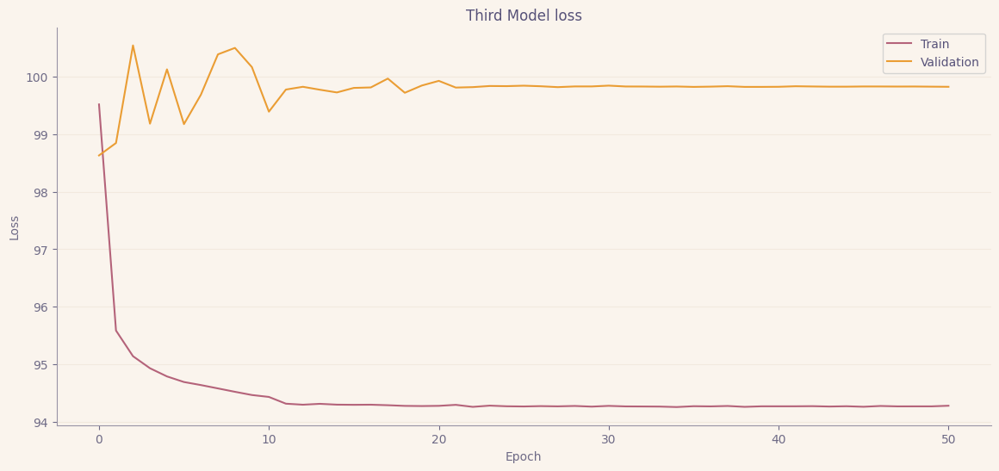

In [78]:
# Plot training & validation loss values
plt.figure(figsize=(14, 6))
plt.plot(loaded_history['loss'])
plt.plot(loaded_history['val_loss'])
plt.title('Third Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

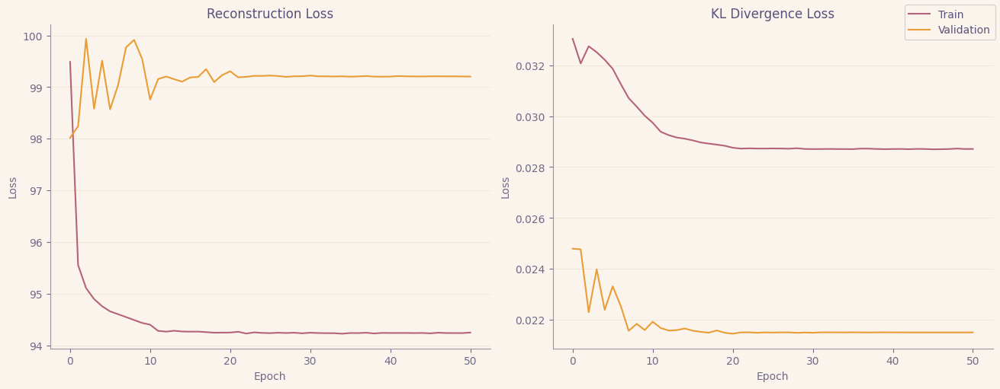

In [79]:
fig, ax = plt.subplots(1, 2, figsize=(13, 5), constrained_layout=True)

ax[0].plot(loaded_history['reconstruction_loss'])
ax[0].plot(loaded_history['val_reconstruction_loss'])
ax[0].set_title('Reconstruction Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')

ax[1].plot(loaded_history['kl_loss'])
ax[1].plot(loaded_history['val_kl_loss'])
ax[1].set_title('KL Divergence Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')

fig.legend(['Train', 'Validation'], loc='upper right')

### Evaluation of Third Model

In the following cells, preprocessing of the test dataset, latent space, timeseries of data will take place. 

In [80]:
df_x_test = pd.DataFrame(x_test)

model2_df = pd.concat([
    df_x_test,
    pd.DataFrame({
        'y_test': y_test,
        'index_test': index_test
    }, index=df_x_test.index)
], axis=1)

# model2_df

model2_df_sorted = model2_df.sort_values(by='index_test')
model2_df_sorted

x_test_sorted = model2_df_sorted.iloc[:, 0:78].values
# x_test_sorted

In [81]:
x_test_encoded = encoder.predict(x_test_sorted, batch_size=100)

df_x_test_enc = pd.DataFrame(x_test_encoded[2])

df_encoded = pd.concat([
    df_x_test_enc,
    pd.DataFrame({
        'y_test': model2_df_sorted['y_test'].values,
        'index_test': model2_df_sorted['index_test'].values
    }, index=df_x_test_enc.index)
], axis=1)

df_encoded

40/40 [==============================] - 0s 490us/step


,0,1,y_test,index_test
0,0.147911,-0.085519,0.0,0
1,-0.903200,0.839604,0.0,1
2,-1.616640,1.062292,0.0,2
3,-1.920056,-0.257049,0.0,3
4,-1.178111,-1.549643,0.0,4
...,...,...,...,...
3995,-6.270722,-1.095199,3.0,3995
3996,0.773217,0.168008,3.0,3996
3997,0.372885,0.007193,3.0,3997
3998,0.326156,-0.442454,3.0,3998


### Latent Space of Third VAE Model

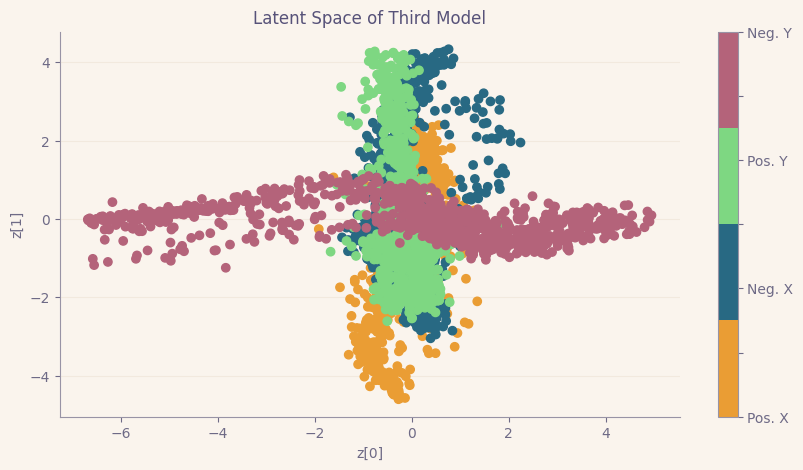

In [82]:
plt.figure(figsize=(10, 5))
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap)
cbar = plt.colorbar()
cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.title('Latent Space of Third Model')
plt.savefig('assets/images/ThirdModelLatent.png', dpi=300)
plt.show()

### Timeseries of test dataset on Latent Space

The plot shows how sequences of data move through the 2D latent space over timesteps. Points are colored by label. The plot visualizes the latent space mapping learned by the VAE model.

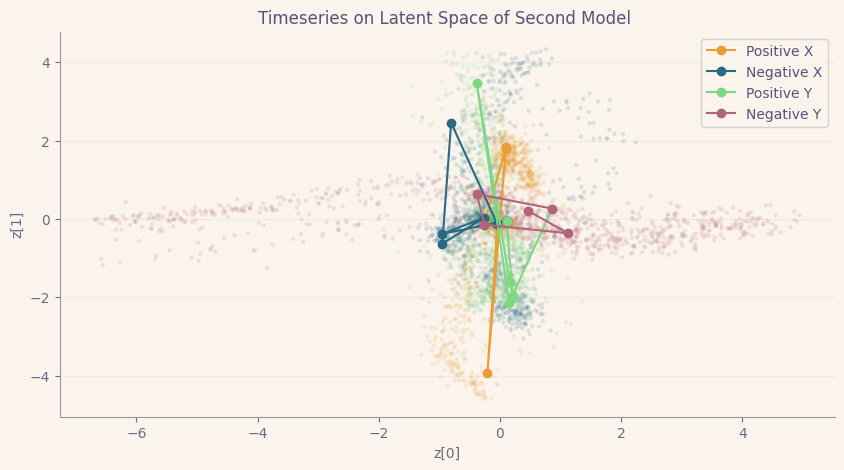

In [83]:
plt.figure(figsize=(10, 5))
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap, s=5, alpha=0.1)
colors = ['#EA9D34', '#286983', '#7ED782', '#B4637A']
lab = ["Positive X", "Negative X", "Positive Y", "Negative Y"]

skip = 200
for i in range(4):
    selected_rows = df_encoded[(df_encoded['index_test'] >= i*1000) & (df_encoded['index_test'] <= (i+1)*1000)]
    selected_rows = selected_rows[::skip]
    plt.plot(selected_rows[0].values, selected_rows[1].values, '-o', color=colors[i], alpha=1, label=lab[i])
    

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.legend()
plt.title('Timeseries on Latent Space of Second Model ')
plt.savefig('assets/images/ThirdModelTimeseries.png', dpi=300)
plt.show()

### Visualizing Action Space after VAE training

The reconstructed action space is visualized to see how well the VAE model learned the underlying structure.

 1/40 [..............................] - ETA: 1s

40/40 [==============================] - 0s 565us/step


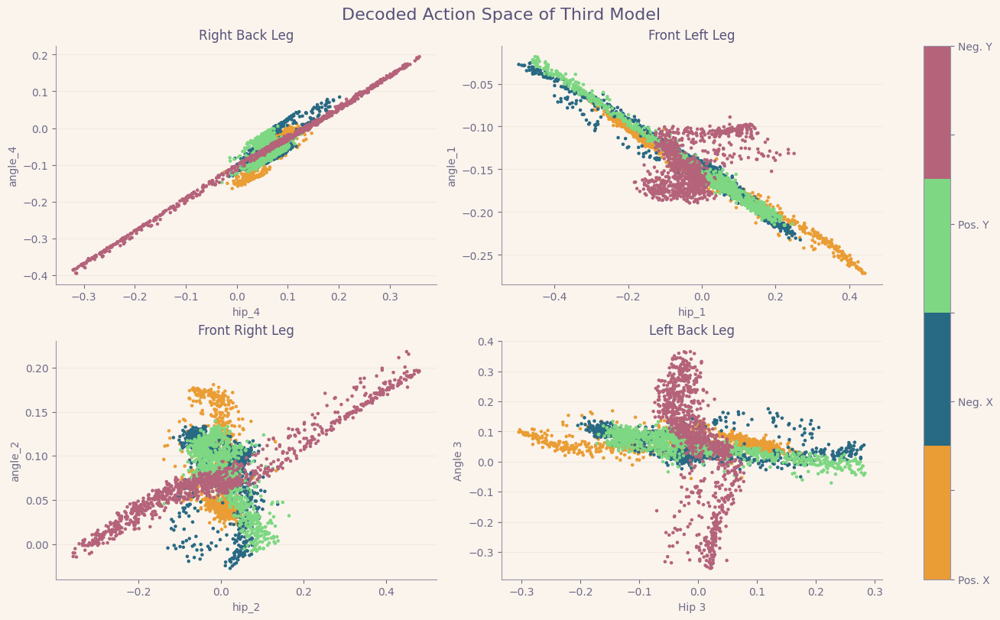

In [84]:
def action_sapce_after(x_test_decoded, y):
    """
    Plot the latent space.
    """
    fig, ax = plt.subplots(2, 2, figsize=(13, 8), constrained_layout=True)
    x = x_test_decoded
    ax[0, 0].scatter(x[:, 0], x[:, 1], c=y, cmap=cmap, s=5)
    ax[0, 0].set_title('Right Back Leg')
    ax[0, 0].set_xlabel('hip_4')
    ax[0, 0].set_ylabel('angle_4')

    ax[0, 1].scatter(x[:, 2], x[:, 3], c=y, cmap=cmap, s=5)
    ax[0, 1].set_title('Front Left Leg')
    ax[0, 1].set_xlabel('hip_1')
    ax[0, 1].set_ylabel('angle_1')

    ax[1, 0].scatter(x[:, 4], x[:, 5], c=y, cmap=cmap, s=5)
    ax[1, 0].set_title('Front Right Leg')
    ax[1, 0].set_xlabel('hip_2')
    ax[1, 0].set_ylabel('angle_2')

    ax[1, 1].scatter(x[:, 6], x[:, 7], c=y, cmap=cmap, s=5)
    ax[1, 1].set_title('Left Back Leg')
    ax[1, 1].set_xlabel('Hip 3')
    ax[1, 1].set_ylabel('Angle 3')
    
    # Add main title
    plt.suptitle('Decoded Action Space of Third Model', fontsize=16)

    # Legend for the whole figure
    cbar = fig.colorbar(ax[0, 0].collections[0], ax=ax.ravel().tolist(), pad=0.05)
    
    # Custom formatter for the colorbar
    cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))
    
    plt.savefig('assets/images/Model3ActionSpace.png', dpi=300)

    plt.show()

x_test_decoded = decoder.predict(x_test_encoded[2], batch_size=100)

action_sapce_after(x_test_decoded, model2_df_sorted['y_test'].values)

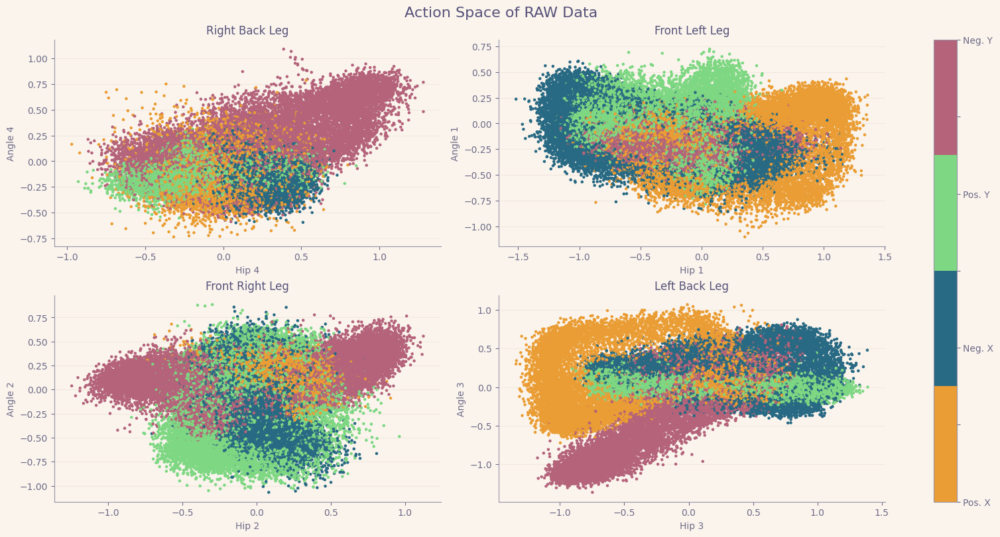

In [85]:
action_sapce_raw()

## Plotting original vs reconstructed actions

In [86]:
actions_encoded = encoder.predict(actions_obs_diff_actT, batch_size=100)
actions_decoded = decoder.predict(actions_encoded[2], batch_size=100)

ActionsVsActionsDecodedDF = pd.DataFrame({'a0': actions_obs_diff_actT[:][:, 0], 'ad0': actions_decoded[:][:, 0],
                                        'a1': actions_obs_diff_actT[:][:, 1], 'ad1': actions_decoded[:][:, 1],
                                        'a2': actions_obs_diff_actT[:][:, 2], 'ad2': actions_decoded[:][:, 2],
                                        'a3': actions_obs_diff_actT[:][:, 3], 'ad3': actions_decoded[:][:, 3],
                                        'a4': actions_obs_diff_actT[:][:, 4], 'ad4': actions_decoded[:][:, 4],
                                        'a5': actions_obs_diff_actT[:][:, 5], 'ad5': actions_decoded[:][:, 5],
                                        'a6': actions_obs_diff_actT[:][:, 6], 'ad6': actions_decoded[:][:, 6],
                                        'a7': actions_obs_diff_actT[:][:, 7], 'ad7': actions_decoded[:][:, 7]})

40/40 [==============================] - 0s 567us/step


40/40 [==============================] - 0s 419us/step


Each action is plotted against its reconstructed version. The MSE between original and reconstructed actions is displayed. This evaluates how well the VAE learned to represent the action space.

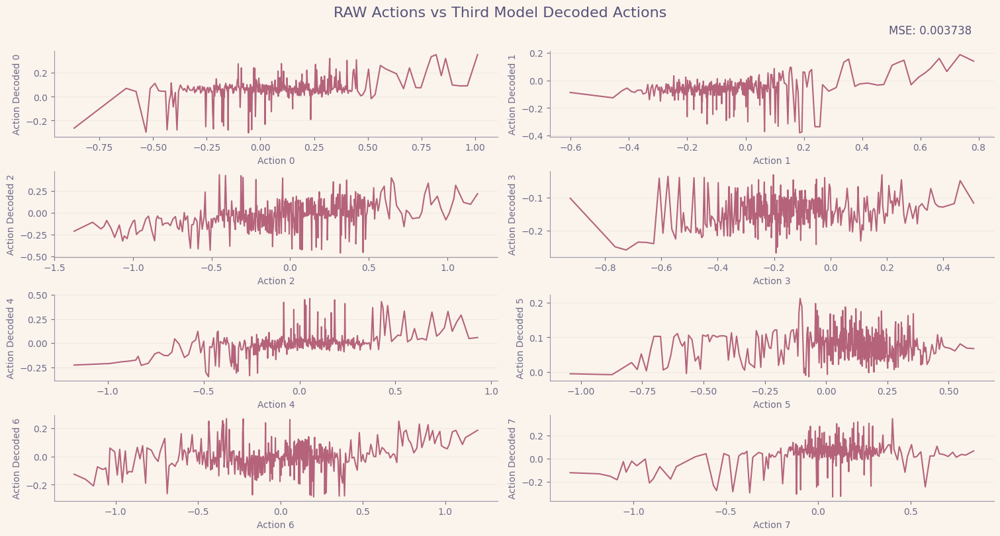

In [87]:
def inputs_outputs_plot(x, mse):
    """
    Plot the latent space.
    """
    # Set the default color cycle

    skip = 10
    fig, ax = plt.subplots(4, 2, figsize=(15, 8), constrained_layout=True)
    x = x.sort_values(by='a0')
    ax[0, 0].plot(x[::skip]['a0'].values, x[::skip]['ad0'].values)
    ax[0, 0].set_xlabel('Action 0')
    ax[0, 0].set_ylabel('Action Decoded 0')

    x = x.sort_values(by='a1')
    ax[0, 1].plot(x[::skip]['a1'].values, x[::skip]['ad1'].values)
    ax[0, 1].set_xlabel('Action 1')
    ax[0, 1].set_ylabel('Action Decoded 1')

    x = x.sort_values(by='a2')
    ax[1, 0].plot(x[::skip]['a2'].values, x[::skip]['ad2'].values)
    ax[1, 0].set_xlabel('Action 2')
    ax[1, 0].set_ylabel('Action Decoded 2')

    x = x.sort_values(by='a3')
    ax[1, 1].plot(x[::skip]['a3'].values, x[::skip]['ad3'].values)
    ax[1, 1].set_xlabel('Action 3')
    ax[1, 1].set_ylabel('Action Decoded 3')

    x = x.sort_values(by='a4')
    ax[2, 0].plot(x[::skip]['a4'].values, x[::skip]['ad4'].values)
    ax[2, 0].set_xlabel('Action 4')
    ax[2, 0].set_ylabel('Action Decoded 4')

    x = x.sort_values(by='a5')
    ax[2, 1].plot(x[::skip]['a5'].values, x[::skip]['ad5'].values)
    ax[2, 1].set_xlabel('Action 5')
    ax[2, 1].set_ylabel('Action Decoded 5')

    x = x.sort_values(by='a6')
    ax[3, 0].plot(x[::skip]['a6'].values, x[::skip]['ad6'].values)
    ax[3, 0].set_xlabel('Action 6')
    ax[3, 0].set_ylabel('Action Decoded 6')

    x = x.sort_values(by='a7')
    ax[3, 1].plot(x[::skip]['a7'].values, x[::skip]['ad7'].values)
    ax[3, 1].set_xlabel('Action 7')
    ax[3, 1].set_ylabel('Action Decoded 7')

    # Add main title
    plt.suptitle('RAW Actions vs Third Model Decoded Actions', fontsize=16)
    ax[0, 1].text(0.95, 1.3, f'MSE: {mse}', fontsize=12, verticalalignment='top', horizontalalignment='right', transform=ax[0, 1].transAxes)

    plt.savefig('assets/images/Model3ActionVsDecoded.png', dpi=300)
    plt.show()

mse_model1 = np.sum((np.square(actions_obs_diff_act[:8] - actions_decoded[:8])) / len(actions_obs_diff_act))

inputs_outputs_plot(ActionsVsActionsDecodedDF, "{:.6f}".format(mse_model1))

### Storing data in global variable for final evaluation of all models

In [88]:
histories.append(loaded_history)
encoded_data_list.append([df_encoded[0].values, df_encoded[1].values])
labels_list.append(df_encoded['y_test'].values)
mse_values.append(mse_model1)

## Comparing RAW Ant and Decoded Coordinates 

Plotting the x and y position of the RAW data vs x and y position of the decoded action values to compare the outcome of the model.

In [89]:
x_raw_dec_3 = []
y_raw_dec_3 = []
rewards_dec_3 = []

In [90]:
env = gym.make("Ant-v4")
observation, info = env.reset()

for i in range(len(x_test_decoded)):
    action = x_test_decoded[i][0:8]
    _, reward, terminated, truncated, info = env.step(action)
    x_raw_dec_3.append(info['x_position'])
    y_raw_dec_3.append(info['y_position'])
    rewards_dec_3.append(reward)
    if i == 1000:
        break

env.close()

Text(0.5, 1.0, 'Third Model RAW vs Decoded Coordinates')

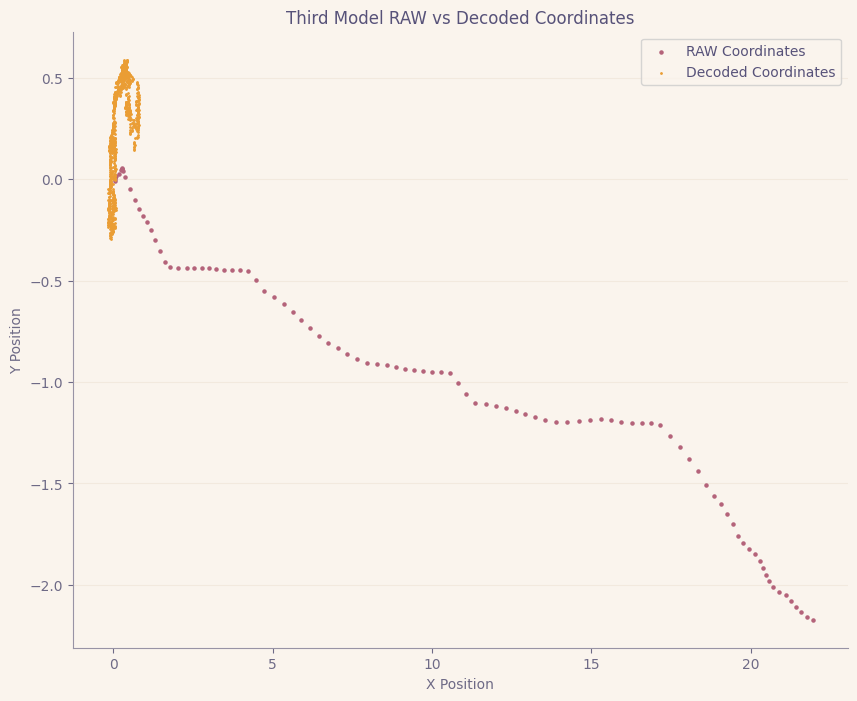

In [91]:
plt.figure(figsize=(10, 8))
plt.scatter(x_raw_1[0][:100], y_raw_1[0][:100],s=5, label='RAW Coordinates')
plt.scatter(x_raw_dec_3, y_raw_dec_3, s=1,label='Decoded Coordinates')

plt.legend()
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Third Model RAW vs Decoded Coordinates')

Text(0.5, 1.0, 'Third Model RAW vs Decoded Action Rewards')

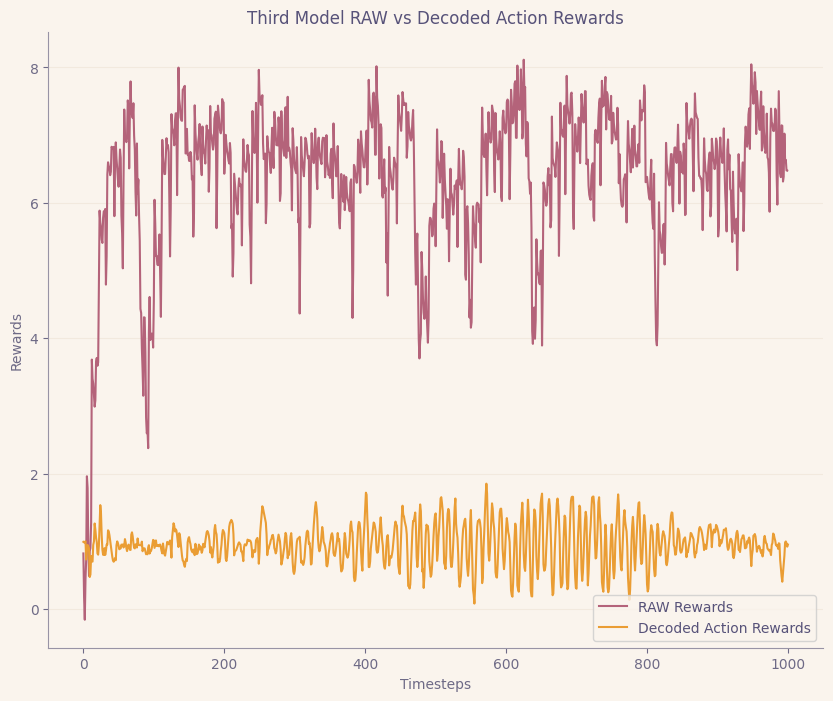

In [92]:
plt.figure(figsize=(10, 8))
plt.plot(rewards_test[:1000], label='RAW Rewards')
plt.plot(rewards_dec_3, label='Decoded Action Rewards')

plt.legend()
plt.xlabel('Timesteps')
plt.ylabel('Rewards')
plt.title('Third Model RAW vs Decoded Action Rewards')

## Evaluating VAE model on Mujoco Ant environment

### First Method - Controling Ant with decoded actions sequence

This code takes a sequence of decoded actions and uses them to control the simulated Ant environment.

In the following cell, range is starting from 3000 index which means it should move in the negative y direction

In [93]:
# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# for i in range(1000):
#     action = x_test_decoded[30000+i][0:8]
#     _, reward, terminated, truncated, info = env.step(action)

#     if terminated or truncated:
#         observation, info = env.reset()

# env.close()

# Fourth VAE Model Architecture with Action and Standardized Action, and Difference Action Space

This code defines the key components of a variational autoencoder (VAE) model:

- `original_dim` and `latent_dim` are constants that define the input dimension and latent space dimension respectively.
- `sampling()` is a sampling function that samples points from the latent space by taking the mean and log variance from the encoder and sampling using the reparameterization trick.
- `build_encoder()` defines the encoder architecture using Dense layers to encode the input down to the mean and log variance vectors describing the latent distribution.
- `build_decoder()` defines the mirrored decoder architecture using Dense layers to decode points from the latent space back to the original input dimensions.
- `vae_reconstruction_loss()` defines a custom reconstruction loss using mean squared error.
- `vae_kl_loss()` defines the custom KL divergence loss for the VAE.
- The data is split into train and test.
- The encoder and decoder models are instantiated using the builder functions.

In summary, this code is defining all the key components of a VAE - the encoder, decoder, loss functions, and data pipeline. The encoder maps the data to a latent distribution, the decoder reconstructs back to the original data space, and the losses optimize the reconstruction and regularize the latent space. This provides the full specification of a VAE architecture before training.

In [94]:
# Constants
original_dim = 24
latent_dim = 2
learning_rate = 0.001  
kl_weight = 0.01 

def sampling(args):
    """Sampling function to sample from the latent space."""
    z_mean, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim), mean=0., stddev=0.1)
    return z_mean + K.exp(z_log_sigma) * epsilon

def build_encoder(input_shape, latent_dim):
    """Build the encoder network."""
    inputs = Input(shape=input_shape)
    x = Dropout(0.25)(inputs)
    
    # Encode the input data
    for units in [21, 17, 15, 13, 9, 5]:
        x = Dense(units)(x)
        x = LeakyReLU()(x)
    
    z_mean = Dense(latent_dim)(x)
    z_log_sigma = Dense(latent_dim)(x) 
    
    z = Lambda(sampling)([z_mean, z_log_sigma])
    
    return Model(inputs, [z_mean, z_log_sigma, z], name='encoder')

def build_decoder(latent_dim, output_shape):
    """Build the decoder network."""
    latent_inputs = Input(shape=(latent_dim,))
    x = latent_inputs
    
    # Decode the latent data
    for units in [5, 9, 13, 17, 21]:
        x = Dense(units, activation='linear')(x)
    
    outputs = Dense(output_shape, activation='linear')(x)
    
    return Model(latent_inputs, outputs, name='decoder')

def vae_reconstruction_loss(y_true, y_pred):
    """Custom reconstruction loss."""
    return MSE(y_true, y_pred) * original_dim

def vae_kl_loss(z_mean, z_log_sigma):
    """Custom KL divergence loss."""
    kl_loss = 1 + z_log_sigma - K.square(z_mean) - K.exp(z_log_sigma)
    return -0.5 * kl_weight * K.sum(kl_loss, axis=-1)

# Split data
# x_train, x_test, y_train, y_test, index_train, index_test = train_test_split(actions_diff_act, labels, index, test_size=0.10, random_state=42)
x_train = actions_diff_act
x_test = actions_diff_actT

# Build Encoder and Decoder
encoder = build_encoder((original_dim,), latent_dim)
decoder = build_decoder(latent_dim, original_dim)

In [95]:
# Instantiate VAE model
inputs = Input(shape=(original_dim,))
outputs = decoder(encoder(inputs)[2])
vae = Model(inputs, outputs, name='vae_mlp')

reconstruction_loss = vae_reconstruction_loss(inputs, outputs)
kl_loss = vae_kl_loss(encoder(inputs)[0], encoder(inputs)[1])
vae_loss = K.mean(reconstruction_loss + kl_loss)

vae.add_loss(vae_loss)
vae.add_metric(reconstruction_loss, name='reconstruction_loss')
vae.add_metric(kl_loss, name='kl_loss')
vae.compile(optimizer=SGD(learning_rate))

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-10, verbose=1),
    EarlyStopping(monitor='val_loss', patience=50, verbose=1, restore_best_weights=True),
    ModelCheckpoint('assets/model4/model.h5', save_best_only=True, save_format='tf')
]

### Training and saving the VAE model

In [96]:
# history = vae.fit(x_train, x_train, epochs=1000, batch_size=256, validation_data=(x_test, x_test), callbacks=callbacks)

In [97]:
# # Saving the models
# encoder.save("assets/model4/vae_encoder.h5")
# decoder.save("assets/model4/vae_decoder.h5")

# # Save history
# with open('assets/model4/train_history.pkl', 'wb') as file:
#     pickle.dump(history.history, file)

### Loading the saved VAE Model

In [98]:
# Loading the models
encoder = load_model("assets/model4/vae_encoder.h5")
decoder = load_model("assets/model4/vae_decoder.h5")

# Load history
with open('assets/model4/train_history.pkl', 'rb') as file:
    loaded_history = pickle.load(file)

# Recreate the VAE model
inputs_reconstructed = Input(shape=(original_dim,))
outputs_reconstructed = decoder(encoder(inputs_reconstructed)[2])
vae_reconstructed = Model(inputs_reconstructed, outputs_reconstructed, name='reconstructed_vae_mlp')

reconstruction_loss_reconstructed = vae_reconstruction_loss(inputs_reconstructed, outputs_reconstructed)
kl_loss_reconstructed = vae_kl_loss(encoder(inputs_reconstructed)[0], encoder(inputs_reconstructed)[1])
vae_loss_reconstructed = K.mean(reconstruction_loss_reconstructed + kl_loss_reconstructed)

vae_reconstructed.add_loss(vae_loss_reconstructed)
vae_reconstructed.add_metric(reconstruction_loss_reconstructed, name='reconstruction_loss')
vae_reconstructed.add_metric(kl_loss_reconstructed, name='kl_loss')
vae_reconstructed.compile(optimizer=SGD(learning_rate))

### Plotting Total, Recostruction and KL Divergence Loss

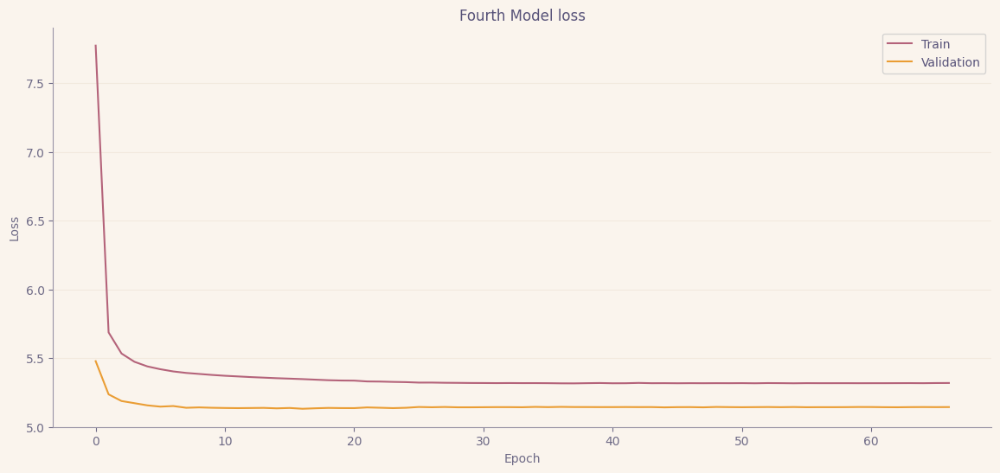

In [99]:
# Plot training & validation loss values
plt.figure(figsize=(14, 6))
plt.plot(loaded_history['loss'])
plt.plot(loaded_history['val_loss'])
plt.title('Fourth Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

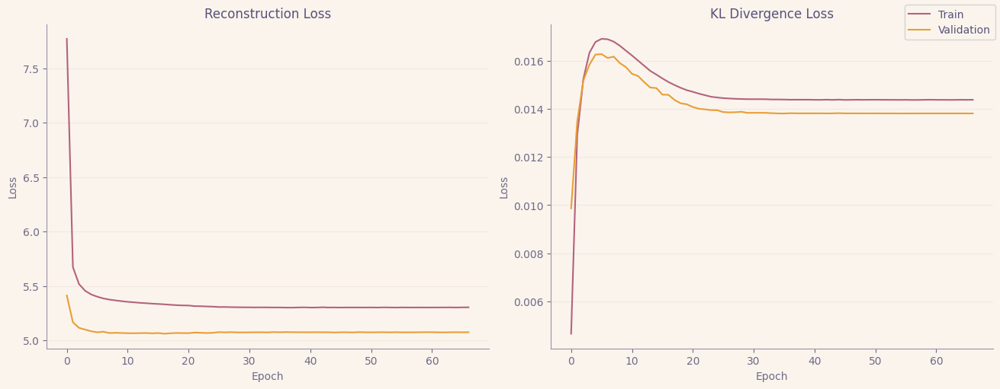

In [100]:
fig, ax = plt.subplots(1, 2, figsize=(13, 5), constrained_layout=True)

ax[0].plot(loaded_history['reconstruction_loss'])
ax[0].plot(loaded_history['val_reconstruction_loss'])
ax[0].set_title('Reconstruction Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')

ax[1].plot(loaded_history['kl_loss'])
ax[1].plot(loaded_history['val_kl_loss'])
ax[1].set_title('KL Divergence Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')

fig.legend(['Train', 'Validation'], loc='upper right')

### Evaluation of Fourth Model

In the following cells, preprocessing of the test dataset, latent space, timeseries of data will take place. 

In [101]:
df_x_test = pd.DataFrame(x_test)

model2_df = pd.concat([
    df_x_test,
    pd.DataFrame({
        'y_test': y_test,
        'index_test': index_test
    }, index=df_x_test.index)
], axis=1)

# model2_df

model2_df_sorted = model2_df.sort_values(by='index_test')
# model2_df_sorted

x_test_sorted = model2_df_sorted.iloc[:, 0:24].values
# x_test_sorted


In [102]:
x_test_encoded = encoder.predict(x_test_sorted, batch_size=100)

df_x_test_enc = pd.DataFrame(x_test_encoded[2])

df_encoded = pd.concat([
    df_x_test_enc,
    pd.DataFrame({
        'y_test': model2_df_sorted['y_test'].values,
        'index_test': model2_df_sorted['index_test'].values
    }, index=df_x_test_enc.index)
], axis=1)

df_encoded

40/40 [==============================] - 0s 1ms/step


,0,1,y_test,index_test
0,0.329236,-0.461043,0.0,0
1,-0.192088,-0.157104,0.0,1
2,-1.736845,-0.752605,0.0,2
3,-1.320984,-0.453899,0.0,3
4,-0.903928,-0.702713,0.0,4
...,...,...,...,...
3995,0.283479,-1.166812,3.0,3995
3996,-0.654928,-0.181723,3.0,3996
3997,-0.741056,-0.154269,3.0,3997
3998,-0.389022,-0.403088,3.0,3998


### Latent Space of Fourth VAE Model

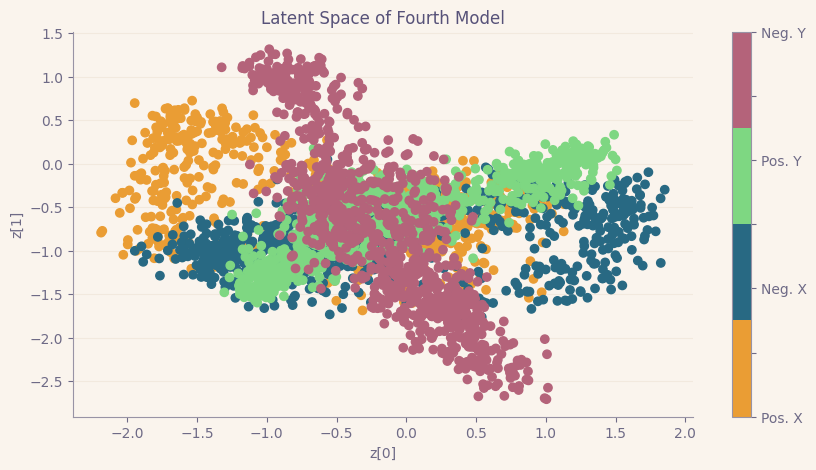

In [103]:
plt.figure(figsize=(10, 5))
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap)
cbar = plt.colorbar()
cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.title('Latent Space of Fourth Model')
plt.savefig('assets/images/FourthModelLatent.png', dpi=300)
plt.show()

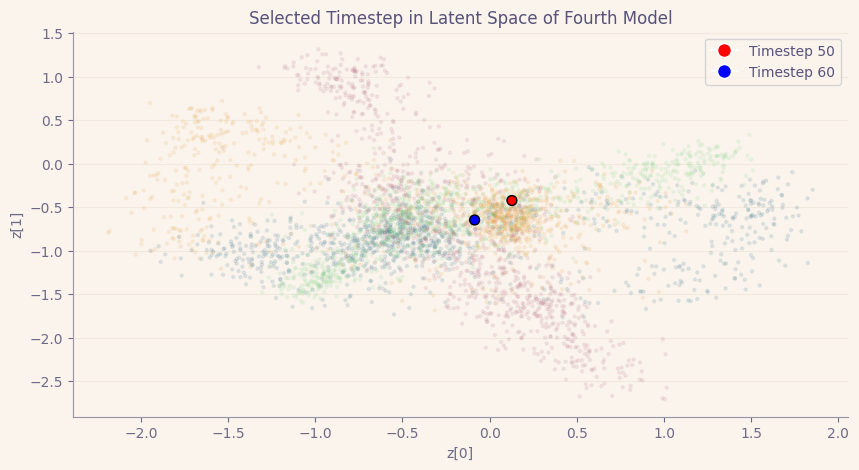

In [104]:
points_50_60 = df_encoded.iloc[[50, 60], [0, 1]].values
colors = ['red', 'blue']  # Red for 50th and blue for 60th timestep
highlight_size = 50

plt.figure(figsize=(10, 5))

# Reduced opacity of main scatter plot
alpha_val = 0.1
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap, s=5, alpha=alpha_val)

# Highlight points at indices 50 and 60
plt.scatter(points_50_60[:, 0], points_50_60[:, 1], c=colors, s=highlight_size, edgecolors='black')

# Legend
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], marker='o', color='w', label='Timestep 50', markersize=10, markerfacecolor='red'),
                   Line2D([0], [0], marker='o', color='w', label='Timestep 60', markersize=10, markerfacecolor='blue')]
plt.legend(handles=legend_elements, loc='upper right')

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.title('Selected Timestep in Latent Space of Fourth Model')
plt.savefig('assets/images/TimestampsLatentSpacFourth.png', dpi=300)
plt.show()

### Timeseries of test dataset on Latent Space

The plot shows how sequences of data move through the 2D latent space over timesteps. Points are colored by label. The plot visualizes the latent space mapping learned by the VAE model.

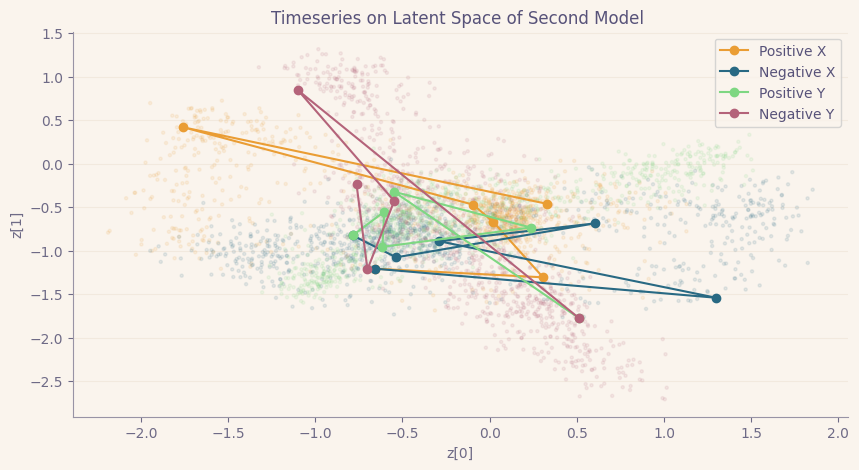

In [105]:
plt.figure(figsize=(10, 5))
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap, s=5, alpha=0.1)
colors = ['#EA9D34', '#286983', '#7ED782', '#B4637A']

skip = 200
for i in range(4):
    selected_rows = df_encoded[(df_encoded['index_test'] >= i*1000) & (df_encoded['index_test'] <= (i+1)*1000)]
    selected_rows = selected_rows[::skip]
    plt.plot(selected_rows[0].values, selected_rows[1].values, '-o', color=colors[i], alpha=1, label=lab[i])
    
# cbar = plt.colorbar()
# cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.legend()
plt.title('Timeseries on Latent Space of Second Model ')
plt.savefig('assets/images/FourthModelTimeseries.png', dpi=300)
plt.show()

### Visualizing Action Space after VAE training

The reconstructed action space is visualized to see how well the VAE model learned the underlying structure.

 1/40 [..............................] - ETA: 1s

40/40 [==============================] - 0s 439us/step


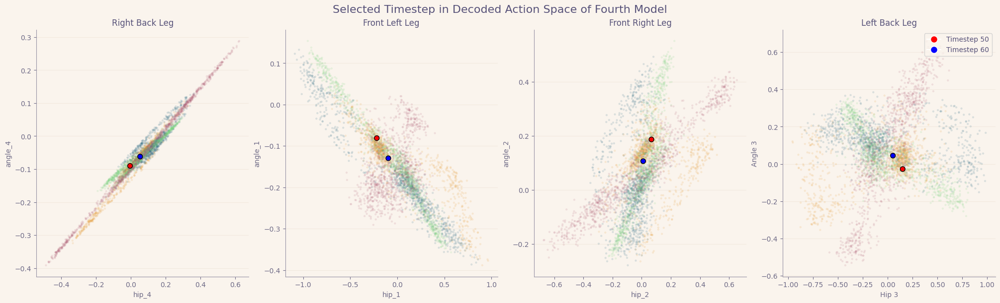

In [106]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def action_sapce_after(x_test_decoded, y):
    """
    Plot the latent space.
    """
    fig, ax = plt.subplots(1, 4, figsize=(20, 6), constrained_layout=True)  # Changed to one row and 4 columns
    x = x_test_decoded
    points_50_60 = x_test_decoded[[50, 60]]
    
    colors = ['red', 'blue']  # Red for 50th and blue for 60th timestep
    highlight_size = 50

    # Reduced opacity of main scatter plots and removed zorder to ensure highlighted points are on top
    alpha_val = 0.1

    ax[0].scatter(x[:, 0], x[:, 1], c=y, cmap=cmap, s=5, alpha=alpha_val)
    ax[0].scatter(points_50_60[:, 0], points_50_60[:, 1], c=colors, s=highlight_size, edgecolors='black')
    
    ax[1].scatter(x[:, 2], x[:, 3], c=y, cmap=cmap, s=5, alpha=alpha_val)
    ax[1].scatter(points_50_60[:, 2], points_50_60[:, 3], c=colors, s=highlight_size, edgecolors='black')

    ax[2].scatter(x[:, 4], x[:, 5], c=y, cmap=cmap, s=5, alpha=alpha_val)
    ax[2].scatter(points_50_60[:, 4], points_50_60[:, 5], c=colors, s=highlight_size, edgecolors='black')
    
    ax[3].scatter(x[:, 6], x[:, 7], c=y, cmap=cmap, s=5, alpha=alpha_val)
    ax[3].scatter(points_50_60[:, 6], points_50_60[:, 7], c=colors, s=highlight_size, edgecolors='black')
    
    ax[0].set_title('Right Back Leg')
    ax[0].set_xlabel('hip_4')
    ax[0].set_ylabel('angle_4')

    ax[1].set_title('Front Left Leg')
    ax[1].set_xlabel('hip_1')
    ax[1].set_ylabel('angle_1')

    ax[2].set_title('Front Right Leg')
    ax[2].set_xlabel('hip_2')
    ax[2].set_ylabel('angle_2')

    ax[3].set_title('Left Back Leg')
    ax[3].set_xlabel('Hip 3')
    ax[3].set_ylabel('Angle 3')
    
    # Add main title
    plt.suptitle('Selected Timestep in Decoded Action Space of Fourth Model', fontsize=16)

    # Legend
    from matplotlib.lines import Line2D
    legend_elements = [Line2D([0], [0], marker='o', color='w', label='Timestep 50', markersize=10, markerfacecolor='red'),
                       Line2D([0], [0], marker='o', color='w', label='Timestep 60', markersize=10, markerfacecolor='blue')]
    ax[3].legend(handles=legend_elements, loc='upper right')
    plt.savefig('assets/images/TimestepActionSpace.png', dpi=300)
    plt.show()

# You can now call the function with your data as before
x_test_decoded = decoder.predict(x_test_encoded[2], batch_size=100)
action_sapce_after(x_test_decoded, model2_df_sorted['y_test'].values)


40/40 [==============================] - 0s 404us/step


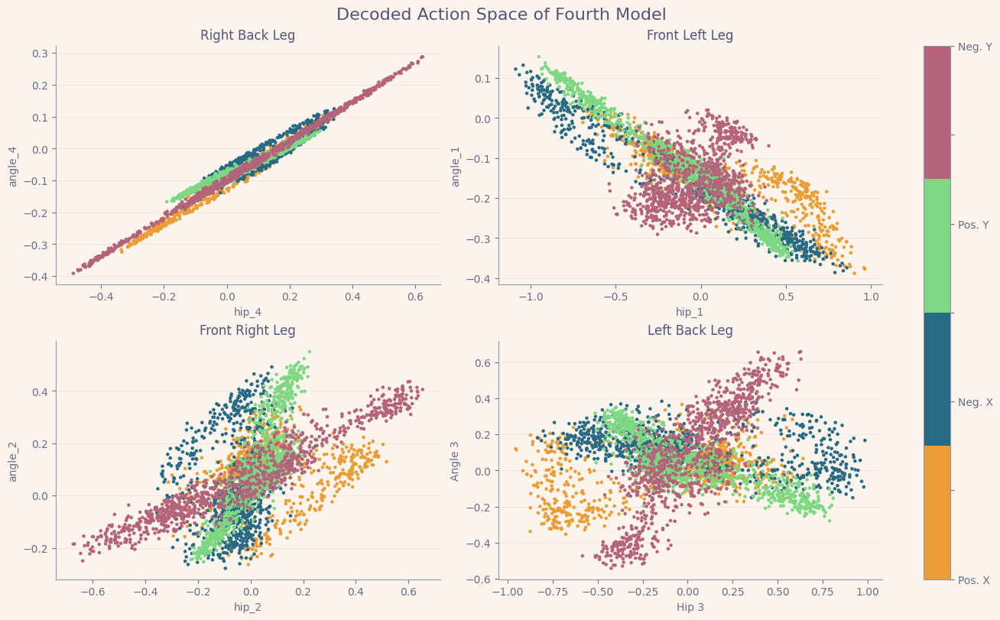

In [107]:
def action_sapce_after(x_test_decoded, y):
    """
    Plot the latent space.
    """
    fig, ax = plt.subplots(2, 2, figsize=(13, 8), constrained_layout=True)
    x = x_test_decoded
    ax[0, 0].scatter(x[:, 0], x[:, 1], c=y, cmap=cmap, s=5)
    ax[0, 0].set_title('Right Back Leg')
    ax[0, 0].set_xlabel('hip_4')
    ax[0, 0].set_ylabel('angle_4')

    ax[0, 1].scatter(x[:, 2], x[:, 3], c=y, cmap=cmap, s=5)
    ax[0, 1].set_title('Front Left Leg')
    ax[0, 1].set_xlabel('hip_1')
    ax[0, 1].set_ylabel('angle_1')

    ax[1, 0].scatter(x[:, 4], x[:, 5], c=y, cmap=cmap, s=5)
    ax[1, 0].set_title('Front Right Leg')
    ax[1, 0].set_xlabel('hip_2')
    ax[1, 0].set_ylabel('angle_2')

    ax[1, 1].scatter(x[:, 6], x[:, 7], c=y, cmap=cmap, s=5)
    ax[1, 1].set_title('Left Back Leg')
    ax[1, 1].set_xlabel('Hip 3')
    ax[1, 1].set_ylabel('Angle 3')
    
    # Add main title
    plt.suptitle('Decoded Action Space of Fourth Model', fontsize=16)

    # Legend for the whole figure
    cbar = fig.colorbar(ax[0, 0].collections[0], ax=ax.ravel().tolist(), pad=0.05)
    
    # Custom formatter for the colorbar
    cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))
    
    plt.savefig('assets/images/Model4ActionSpace.png', dpi=300)

    plt.show()

x_test_decoded = decoder.predict(x_test_encoded[2], batch_size=100)

action_sapce_after(x_test_decoded, model2_df_sorted['y_test'].values)

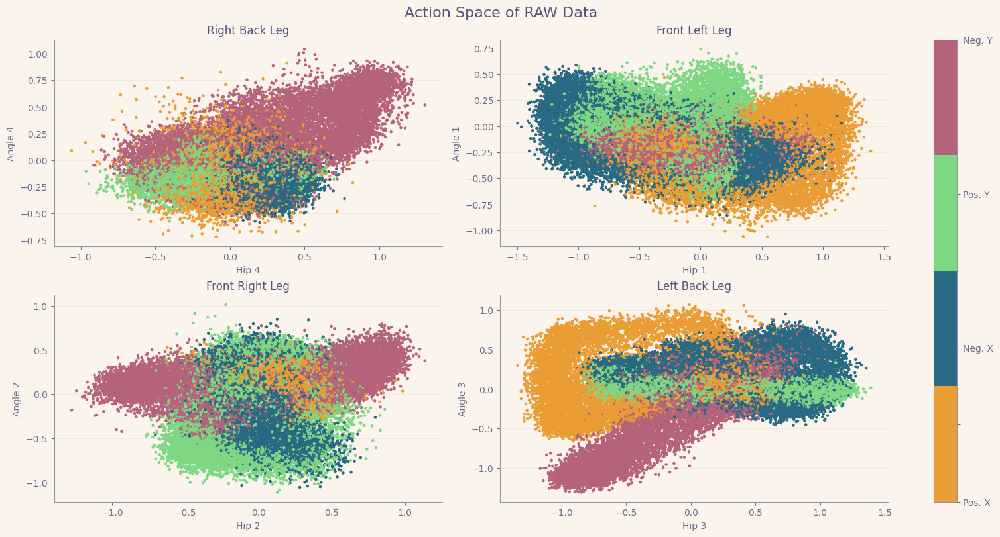

In [108]:
action_sapce_raw()

## Plotting original vs reconstructed actions

In [109]:
actions_encoded = encoder.predict(actions_diff_actT, batch_size=100)
actions_decoded = decoder.predict(actions_encoded[2], batch_size=100)

ActionsVsActionsDecodedDF = pd.DataFrame({'a0': actions_diff_actT[:][:, 0], 'ad0': actions_decoded[:][:, 0],
                                        'a1': actions_diff_actT[:][:, 1], 'ad1': actions_decoded[:][:, 1],
                                        'a2': actions_diff_actT[:][:, 2], 'ad2': actions_decoded[:][:, 2],
                                        'a3': actions_diff_actT[:][:, 3], 'ad3': actions_decoded[:][:, 3],
                                        'a4': actions_diff_actT[:][:, 4], 'ad4': actions_decoded[:][:, 4],
                                        'a5': actions_diff_actT[:][:, 5], 'ad5': actions_decoded[:][:, 5],
                                        'a6': actions_diff_actT[:][:, 6], 'ad6': actions_decoded[:][:, 6],
                                        'a7': actions_diff_actT[:][:, 7], 'ad7': actions_decoded[:][:, 7]})

40/40 [==============================] - 0s 368us/step


Each action is plotted against its reconstructed version. The MSE between original and reconstructed actions is displayed. This evaluates how well the VAE learned to represent the action space.

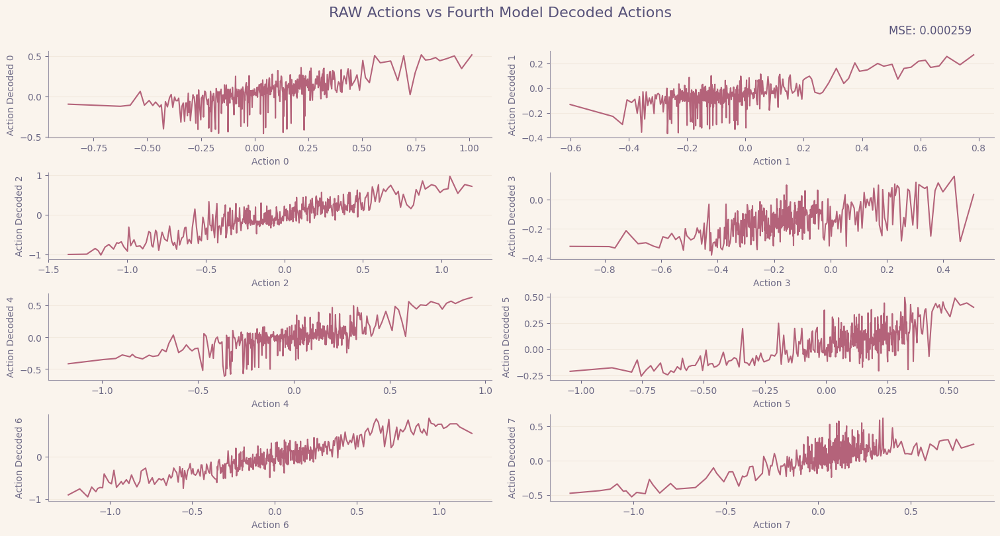

In [110]:
def inputs_outputs_plot(x, mse):
    """
    Plot the latent space.
    """
    # Set the default color cycle

    skip = 10
    fig, ax = plt.subplots(4, 2, figsize=(15, 8), constrained_layout=True)
    x = x.sort_values(by='a0')
    ax[0, 0].plot(x[::skip]['a0'].values, x[::skip]['ad0'].values)
    ax[0, 0].set_xlabel('Action 0')
    ax[0, 0].set_ylabel('Action Decoded 0')

    x = x.sort_values(by='a1')
    ax[0, 1].plot(x[::skip]['a1'].values, x[::skip]['ad1'].values)
    ax[0, 1].set_xlabel('Action 1')
    ax[0, 1].set_ylabel('Action Decoded 1')

    x = x.sort_values(by='a2')
    ax[1, 0].plot(x[::skip]['a2'].values, x[::skip]['ad2'].values)
    ax[1, 0].set_xlabel('Action 2')
    ax[1, 0].set_ylabel('Action Decoded 2')

    x = x.sort_values(by='a3')
    ax[1, 1].plot(x[::skip]['a3'].values, x[::skip]['ad3'].values)
    ax[1, 1].set_xlabel('Action 3')
    ax[1, 1].set_ylabel('Action Decoded 3')

    x = x.sort_values(by='a4')
    ax[2, 0].plot(x[::skip]['a4'].values, x[::skip]['ad4'].values)
    ax[2, 0].set_xlabel('Action 4')
    ax[2, 0].set_ylabel('Action Decoded 4')

    x = x.sort_values(by='a5')
    ax[2, 1].plot(x[::skip]['a5'].values, x[::skip]['ad5'].values)
    ax[2, 1].set_xlabel('Action 5')
    ax[2, 1].set_ylabel('Action Decoded 5')

    x = x.sort_values(by='a6')
    ax[3, 0].plot(x[::skip]['a6'].values, x[::skip]['ad6'].values)
    ax[3, 0].set_xlabel('Action 6')
    ax[3, 0].set_ylabel('Action Decoded 6')

    x = x.sort_values(by='a7')
    ax[3, 1].plot(x[::skip]['a7'].values, x[::skip]['ad7'].values)
    ax[3, 1].set_xlabel('Action 7')
    ax[3, 1].set_ylabel('Action Decoded 7')

    # Add main title
    plt.suptitle('RAW Actions vs Fourth Model Decoded Actions', fontsize=16)
    ax[0, 1].text(0.95, 1.3, f'MSE: {mse}', fontsize=12, verticalalignment='top', horizontalalignment='right', transform=ax[0, 1].transAxes)

    plt.savefig('assets/images/Model4ActionVsDecoded.png', dpi=300)
    plt.show()

mse_model1 = np.sum((np.square(actions_diff_act[:8] - actions_decoded[:8])) / len(actions_diff_act))

inputs_outputs_plot(ActionsVsActionsDecodedDF, "{:.6f}".format(mse_model1))

### Storing data in global variable for final evaluation of all models

In [111]:
histories.append(loaded_history)
encoded_data_list.append([df_encoded[0].values, df_encoded[1].values])
labels_list.append(df_encoded['y_test'].values)
mse_values.append(mse_model1)

## Comparing RAW Ant and Decoded Coordinates 

Plotting the x and y position of the RAW data vs x and y position of the decoded action values to compare the outcome of the model.

In [112]:
x_raw_dec_4 = []
y_raw_dec_4 = []
rewards_dec_4 = []

In [113]:
env = gym.make("Ant-v4")
observation, info = env.reset()

for i in range(len(x_test_decoded)):
    action = x_test_decoded[i][0:8]
    _, reward, terminated, truncated, info = env.step(action)
    x_raw_dec_4.append(info['x_position'])
    y_raw_dec_4.append(info['y_position'])
    rewards_dec_4.append(reward)
    if i == 1000:
        break

env.close()

In [114]:
# from PIL import Image
# env = gym.make("Ant-v4", render_mode='rgb_array')
# observation, info = env.reset()

# x_raw_dec_4 = []
# y_raw_dec_4 = []
# rewards_dec_4 = []

# for i in range(len(x_test_decoded)):
#     action = x_test_decoded[i][0:8]
#     _, reward, terminated, truncated, info = env.step(action)
    
#     if i in [50, 60]:
#         frame = env.render()
#         im = Image.fromarray(frame)
#         im.save(f"screenshot_step_{i}.png")

#     if i == 1000:
#         break

# env.close()


Text(0.5, 1.0, 'Fourth Model RAW vs Decoded Coordinates')

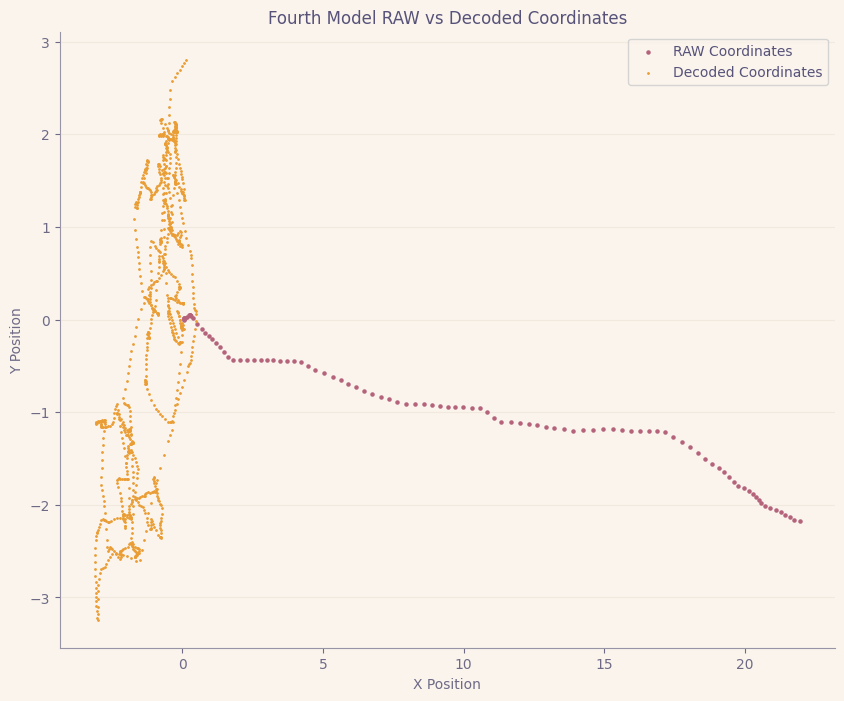

In [115]:
plt.figure(figsize=(10, 8))
plt.scatter(x_raw_1[0][:100], y_raw_1[0][:100],s=5, label='RAW Coordinates')
plt.scatter(x_raw_dec_4, y_raw_dec_4, s=1,label='Decoded Coordinates')

plt.legend()
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Fourth Model RAW vs Decoded Coordinates')

Text(0.5, 1.0, 'First Model RAW vs Decoded Action Rewards')

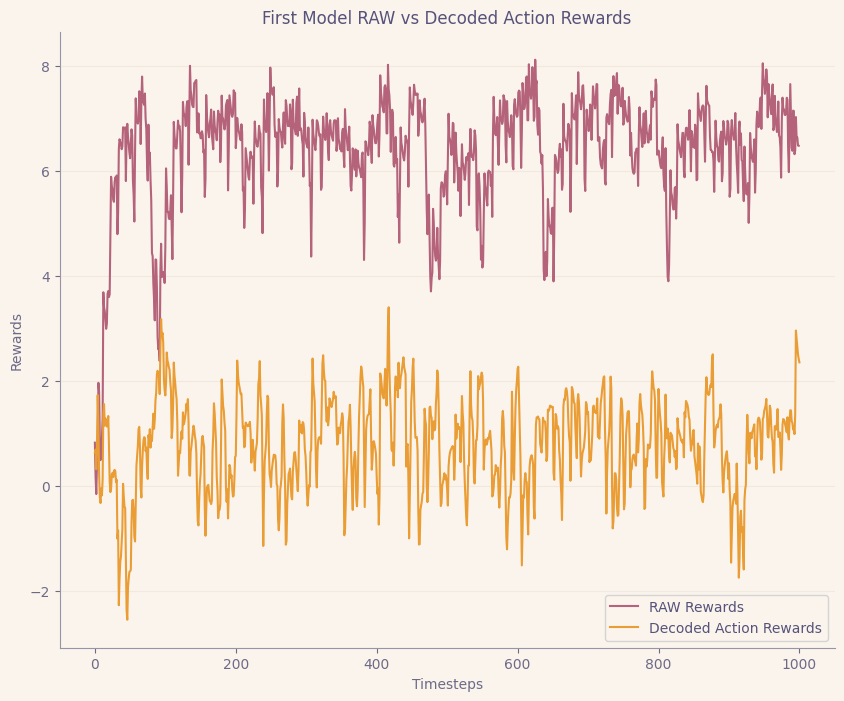

In [116]:
plt.figure(figsize=(10, 8))
plt.plot(rewards_test[:1000], label='RAW Rewards')
plt.plot(rewards_dec_4, label='Decoded Action Rewards')

plt.legend()
plt.xlabel('Timesteps')
plt.ylabel('Rewards')
plt.title('First Model RAW vs Decoded Action Rewards')

## Evaluating VAE model on Mujoco Ant environment

### First Method - Controling Ant with decoded actions sequence

This code takes a sequence of decoded actions and uses them to control the simulated Ant environment.

In the following cell, range is starting from 3000 index which means it should move in the negative y direction

In [117]:
# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# for i in range(1000):
#     action = x_test_decoded[30000+i][0:8]
#     _, reward, terminated, truncated, info = env.step(action)

#     if terminated or truncated:
#         observation, info = env.reset()

# env.close()

### Second Method - Decoding latent space paths to action sequences with PyGame

This code takes a path drawn on the latent space visualization and decodes it into a sequence of actions.

- The `find_or_approximate` function finds the closest encoded point. 
- `decode_from_points` uses this to extract a sequence of points along the path which are decoded into a sequence of actions.

This allows interacting with the latent space visualization to extract semantically meaningful action sequences.

This code allows drawing a path in the latent space visualization and executing the decoded action sequence in the environment.

Clicking two points draws a path, decodes it to actions, and executes the sequence in the environment.

This allows interactively exploring and exploiting the latent space to generate semantically meaningful sequences.

In [118]:
# def find_or_approximate(df, col, value1, value2, third_col_value):
#     value1 = (value1 / WIDTH) * 2 - 1
#     value2 = (value2 / WIDTH) * 2 - 1

#     # Filter based on third column's value
#     if third_col_value is not None:
#         df = df[df['y_test'] == third_col_value]

#     # Calculate the absolute difference for both values in the filtered rows
#     df['diff'] = (df[col[0]] - value1).abs() + (df[col[1]] - value2).abs()
    
#     # Get the row with the minimum sum of absolute differences
#     min_diff_row = df.loc[df['diff'].idxmin()]
    
#     return min_diff_row.drop('diff')

# def decode_from_points(path_points):
#     a = find_or_approximate(df_encoded, [0, 1], path_points[0][0], path_points[0][1], None)
#     b = find_or_approximate(df_encoded, [0, 1], path_points[1][0], path_points[1][1], a['y_test'])

#     # Extract all rows between a and b with the same y_test value
#     start_idx, end_idx = sorted([a.name, b.name])  
#     in_between_rows = df_encoded.loc[start_idx:end_idx]
#     in_between_rows = in_between_rows[in_between_rows['y_test'] == a['y_test']]

#     x_y = np.column_stack((in_between_rows[0], in_between_rows[1]))
#     decoded_values = decoder.predict(x_y, batch_size=100)

#     return decoded_values[::20]


# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# # Initialize pygame
# pygame.init()

# # Define screen dimensions
# WIDTH, HEIGHT = 800, 600

# # Create a screen and a clock
# screen = pygame.display.set_mode((WIDTH, HEIGHT))
# pygame.display.set_caption("VAE 2D Latent Space")
# clock = pygame.time.Clock()

# font = pygame.font.SysFont(None, 25)  # Font for displaying text

# def decode_from_latent_space(latent_x, latent_y):
#     action = decoder.predict(np.column_stack((latent_x, latent_y)))
#     return action[0][0:8]

# def get_color_from_latent_position(x, y):
#     return (int(x * 255), int(y * 255), 200)  # Example RGB value

# # Main loop
# running = True
# drawing_path = False
# path_points = []
# action = []


# first_point = None
# last_point = None

# while running:
#     screen.fill((255, 255, 255))

#     for x in range(WIDTH):
#         for y in range(HEIGHT):
#             color = get_color_from_latent_position(x/WIDTH, y/HEIGHT)
#             screen.set_at((x, y), color)
    
#     for event in pygame.event.get():
#         if event.type == pygame.QUIT:
#             running = False

#         if event.type == pygame.KEYDOWN:
#             if event.key == pygame.K_q:
#                 running = False

#         if event.type == pygame.MOUSEBUTTONDOWN:
#             if first_point is None:
#                 first_point = event.pos
#             elif last_point is None:
#                 last_point = event.pos
#                 # Process the points from first_point to last_point
#                 path_points = [first_point, last_point]
#                 # print(path_points)
#                 decoded_values = decode_from_points(path_points)
#                 print(len(decoded_values))
#                 for i in range(len(decoded_values)):
#                     action = decoded_values[i][0:8]
#                     _, reward, terminated, truncated, info = env.step(action)

#                     # if terminated or truncated:
#                     #     observation, info = env.reset()
#                     # if i > 1000:
#                     #     break

#                 first_point = last_point
#                 last_point = None
#             else:
#                 pass
        
#     # Display feedback about the action 
#     feedback_text = font.render(f"Last Action: {action}", True, (0, 0, 0))
#     screen.blit(feedback_text, (10, 10))
    
#     pygame.display.flip()
#     clock.tick(60)



# pygame.quit()
# env.close()


# Fifth VAE Model Architecture with Action, Standardized Action, Custom Observations and Difference Actions


This code defines the key components of a variational autoencoder (VAE) model:

- `original_dim` and `latent_dim` are constants that define the input dimension and latent space dimension respectively.
- `sampling()` is a sampling function that samples points from the latent space by taking the mean and log variance from the encoder and sampling using the reparameterization trick.
- `build_encoder()` defines the encoder architecture using Dense layers to encode the input down to the mean and log variance vectors describing the latent distribution.
- `build_decoder()` defines the mirrored decoder architecture using Dense layers to decode points from the latent space back to the original input dimensions.
- `vae_reconstruction_loss()` defines a custom reconstruction loss using mean squared error.
- `vae_kl_loss()` defines the custom KL divergence loss for the VAE.
- The data is split into train and test.
- The encoder and decoder models are instantiated using the builder functions.

In summary, this code is defining all the key components of a VAE - the encoder, decoder, loss functions, and data pipeline. The encoder maps the data to a latent distribution, the decoder reconstructs back to the original data space, and the losses optimize the reconstruction and regularize the latent space. This provides the full specification of a VAE architecture before training.

In [119]:
# Constants
original_dim = 40
latent_dim = 2
learning_rate = 0.001  
kl_weight = 0.01 

def sampling(args):
    """Sampling function to sample from the latent space."""
    z_mean, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim), mean=0., stddev=0.1)
    return z_mean + K.exp(z_log_sigma) * epsilon

def build_encoder(input_shape, latent_dim):
    """Build the encoder network."""
    inputs = Input(shape=input_shape)
    x = Dropout(0.25)(inputs)
    
    # Encode the input data
    for units in [30, 25, 20, 15, 10, 8, 5]:
        x = Dense(units)(x)
        x = LeakyReLU()(x)
    
    z_mean = Dense(latent_dim)(x)
    z_log_sigma = Dense(latent_dim)(x)
    
    z = Lambda(sampling)([z_mean, z_log_sigma])
    
    return Model(inputs, [z_mean, z_log_sigma, z], name='encoder')

def build_decoder(latent_dim, output_shape):
    """Build the decoder network."""
    latent_inputs = Input(shape=(latent_dim,))
    x = latent_inputs
    
    # Decode the latent data
    for units in [5, 8, 10, 15, 20, 25, 30]:
        x = Dense(units, activation='linear')(x)
    
    outputs = Dense(output_shape, activation='linear')(x)
    
    return Model(latent_inputs, outputs, name='decoder')

def vae_reconstruction_loss(y_true, y_pred):
    """Custom reconstruction loss."""
    return MSE(y_true, y_pred) * original_dim

def vae_kl_loss(z_mean, z_log_sigma):
    """Custom KL divergence loss."""
    kl_loss = 1 + z_log_sigma - K.square(z_mean) - K.exp(z_log_sigma)
    return -0.5 * kl_weight * K.sum(kl_loss, axis=-1)

# Split data
# x_train, x_test, y_train, y_test, index_train, index_test = train_test_split(actions_obs_cust_diff_act, labels, index, test_size=0.10, random_state=42)
x_train = actions_obs_cust_diff_act
x_test = actions_obs_cust_diff_actT

# Build Encoder and Decoder
encoder = build_encoder((original_dim,), latent_dim)
decoder = build_decoder(latent_dim, original_dim)

In [120]:
# Instantiate VAE model
inputs = Input(shape=(original_dim,))
outputs = decoder(encoder(inputs)[2])
vae = Model(inputs, outputs, name='vae_mlp')

reconstruction_loss = vae_reconstruction_loss(inputs, outputs)
kl_loss = vae_kl_loss(encoder(inputs)[0], encoder(inputs)[1])
vae_loss = K.mean(reconstruction_loss + kl_loss)

vae.add_loss(vae_loss)
vae.add_metric(reconstruction_loss, name='reconstruction_loss')
vae.add_metric(kl_loss, name='kl_loss')
vae.compile(optimizer=SGD(learning_rate))

# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=1e-10, verbose=1),
    EarlyStopping(monitor='val_loss', patience=50, verbose=1, restore_best_weights=True),
    ModelCheckpoint('assets/model5/model.h5', save_best_only=True, save_format='tf')
]

### Training and saving the VAE model

In [121]:
# history = vae.fit(x_train, x_train, epochs=1000, batch_size=256, validation_data=(x_test, x_test), callbacks=callbacks)

In [122]:
# # Saving the models
# encoder.save("assets/model5/vae_encoder.h5")
# decoder.save("assets/model5/vae_decoder.h5")

# # Save history
# with open('assets/model5/train_history.pkl', 'wb') as file:
#     pickle.dump(history.history, file)

### Loading the saved VAE Model

In [123]:
# Loading the models
encoder = load_model("assets/model5/vae_encoder.h5")
decoder = load_model("assets/model5/vae_decoder.h5")

# Load history
with open('assets/model5/train_history.pkl', 'rb') as file:
    loaded_history = pickle.load(file)

# Recreate the VAE model
inputs_reconstructed = Input(shape=(original_dim,))
outputs_reconstructed = decoder(encoder(inputs_reconstructed)[2])
vae_reconstructed = Model(inputs_reconstructed, outputs_reconstructed, name='reconstructed_vae_mlp')

reconstruction_loss_reconstructed = vae_reconstruction_loss(inputs_reconstructed, outputs_reconstructed)
kl_loss_reconstructed = vae_kl_loss(encoder(inputs_reconstructed)[0], encoder(inputs_reconstructed)[1])
vae_loss_reconstructed = K.mean(reconstruction_loss_reconstructed + kl_loss_reconstructed)

vae_reconstructed.add_loss(vae_loss_reconstructed)
vae_reconstructed.add_metric(reconstruction_loss_reconstructed, name='reconstruction_loss')
vae_reconstructed.add_metric(kl_loss_reconstructed, name='kl_loss')
vae_reconstructed.compile(optimizer=SGD(learning_rate))

### Plotting Total, Recostruction and KL Divergence Loss

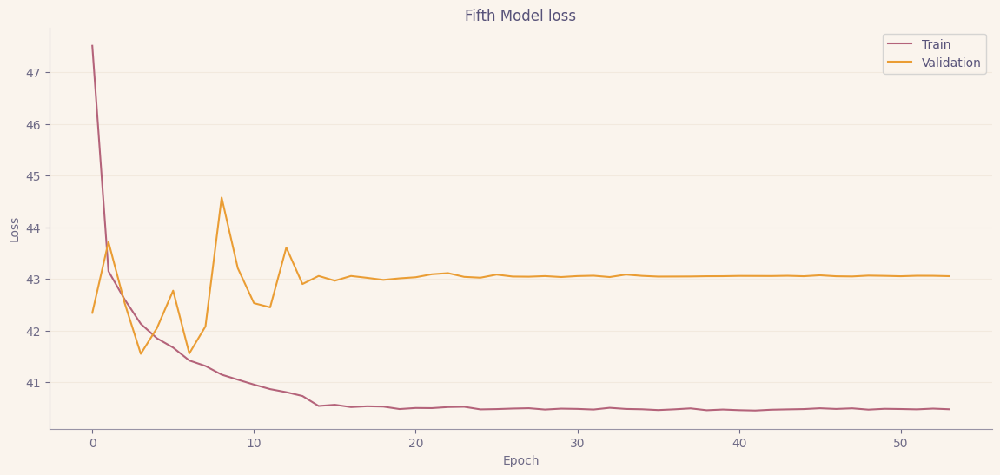

In [124]:
# Plot training & validation loss values
plt.figure(figsize=(14, 6))
plt.plot(loaded_history['loss'])
plt.plot(loaded_history['val_loss'])
plt.title('Fifth Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

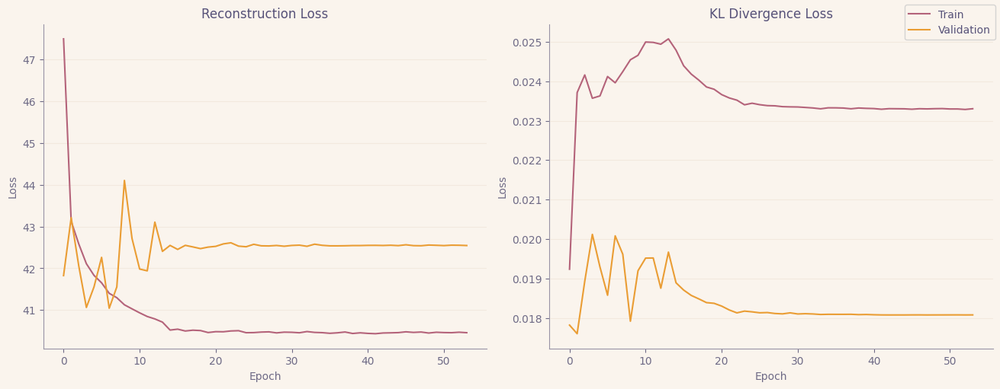

In [125]:
fig, ax = plt.subplots(1, 2, figsize=(13, 5), constrained_layout=True)

ax[0].plot(loaded_history['reconstruction_loss'])
ax[0].plot(loaded_history['val_reconstruction_loss'])
ax[0].set_title('Reconstruction Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')

ax[1].plot(loaded_history['kl_loss'])
ax[1].plot(loaded_history['val_kl_loss'])
ax[1].set_title('KL Divergence Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')

fig.legend(['Train', 'Validation'], loc='upper right')

### Evaluation of Fifth Model

In the following cells, preprocessing of the test dataset, latent space, timeseries of data will take place. 

In [126]:
df_x_test = pd.DataFrame(x_test)

model2_df = pd.concat([
    df_x_test,
    pd.DataFrame({
        'y_test': y_test,
        'index_test': index_test
    }, index=df_x_test.index)
], axis=1)

# model2_df

model2_df_sorted = model2_df.sort_values(by='index_test')
model2_df_sorted

x_test_sorted = model2_df_sorted.iloc[:, 0:40].values
# x_test_sorted

In [127]:
x_test_encoded = encoder.predict(x_test_sorted, batch_size=100)

df_x_test_enc = pd.DataFrame(x_test_encoded[2])

df_encoded = pd.concat([
    df_x_test_enc,
    pd.DataFrame({
        'y_test': model2_df_sorted['y_test'].values,
        'index_test': model2_df_sorted['index_test'].values
    }, index=df_x_test_enc.index)
], axis=1)

df_encoded

40/40 [==============================] - 0s 476us/step


,0,1,y_test,index_test
0,-0.699175,-0.322314,0.0,0
1,-1.955273,-0.901650,0.0,1
2,-1.715774,-1.712323,0.0,2
3,0.557259,-1.865349,0.0,3
4,1.830703,-1.300491,0.0,4
...,...,...,...,...
3995,-0.879828,-4.362370,3.0,3995
3996,-0.533731,0.066522,3.0,3996
3997,-0.069930,-0.229933,3.0,3997
3998,0.068247,-0.348169,3.0,3998


### Latent Space of Fifth VAE Model

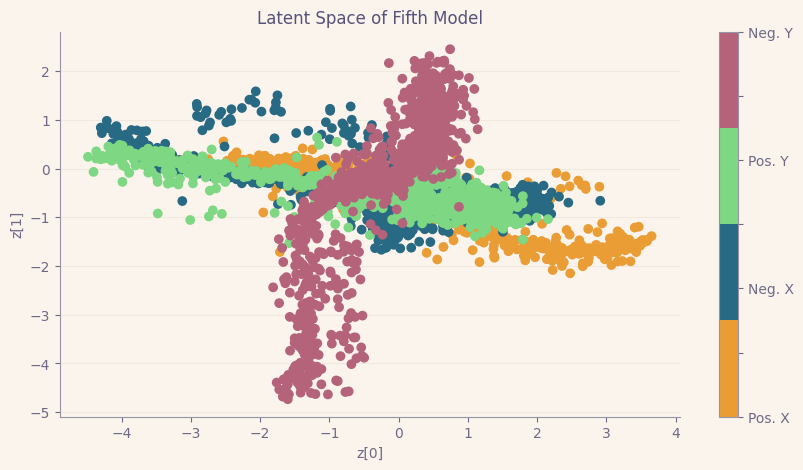

In [128]:
plt.figure(figsize=(10, 5))
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap)
cbar = plt.colorbar()
cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.title('Latent Space of Fifth Model')
plt.savefig('assets/images/FifthModelLatent.png', dpi=300)
plt.show()

### Timeseries of test dataset on Latent Space

The plot shows how sequences of data move through the 2D latent space over timesteps. Points are colored by label. The plot visualizes the latent space mapping learned by the VAE model.

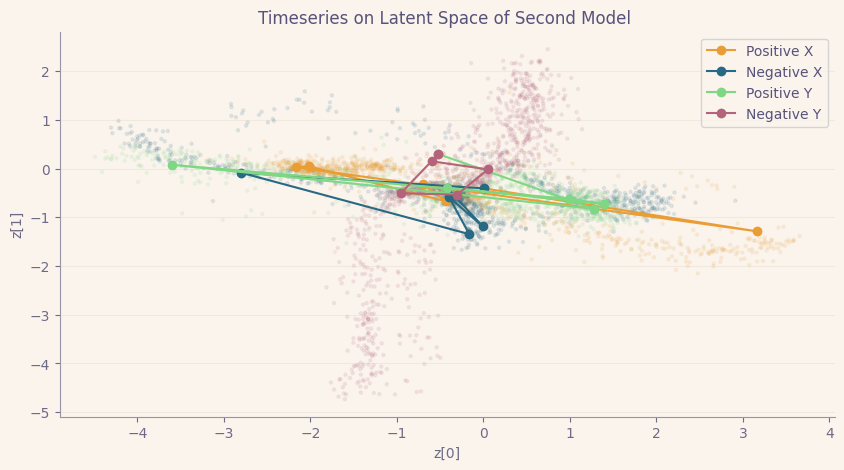

In [129]:
plt.figure(figsize=(10, 5))
plt.scatter(df_encoded[0].values, df_encoded[1].values, c=df_encoded['y_test'].values, cmap=cmap, s=5, alpha=0.1)
colors = ['#EA9D34', '#286983', '#7ED782', '#B4637A']

skip = 200
for i in range(4):
    selected_rows = df_encoded[(df_encoded['index_test'] >= i*1000) & (df_encoded['index_test'] <= (i+1)*1000)]
    selected_rows = selected_rows[::skip]
    plt.plot(selected_rows[0].values, selected_rows[1].values, '-o', color=colors[i], alpha=1, label=lab[i])
    
# cbar = plt.colorbar()
# cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))

plt.xlabel('z[0]')
plt.ylabel('z[1]')
plt.legend()
plt.title('Timeseries on Latent Space of Second Model ')
plt.savefig('assets/images/FifthModelTimeseries.png', dpi=300)
plt.show()

### Visualizing Action Space after VAE training

The reconstructed action space is visualized to see how well the VAE model learned the underlying structure.

40/40 [==============================] - 0s 451us/step


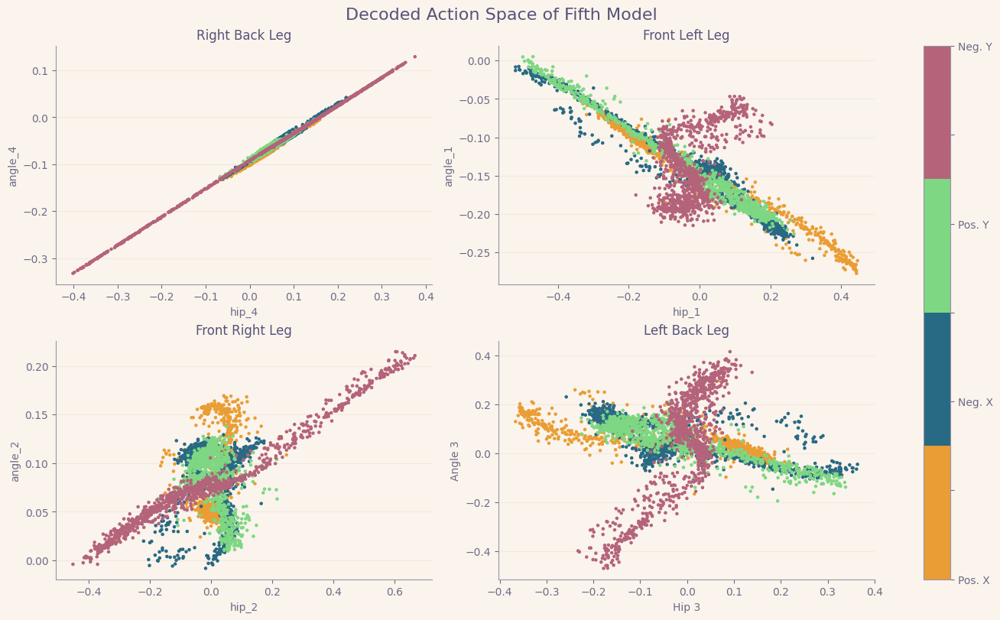

In [130]:
def action_sapce_after(x_test_decoded, y):
    """
    Plot the latent space.
    """
    fig, ax = plt.subplots(2, 2, figsize=(13, 8), constrained_layout=True)
    x = x_test_decoded
    ax[0, 0].scatter(x[:, 0], x[:, 1], c=y, cmap=cmap, s=5)
    ax[0, 0].set_title('Right Back Leg')
    ax[0, 0].set_xlabel('hip_4')
    ax[0, 0].set_ylabel('angle_4')

    ax[0, 1].scatter(x[:, 2], x[:, 3], c=y, cmap=cmap, s=5)
    ax[0, 1].set_title('Front Left Leg')
    ax[0, 1].set_xlabel('hip_1')
    ax[0, 1].set_ylabel('angle_1')

    ax[1, 0].scatter(x[:, 4], x[:, 5], c=y, cmap=cmap, s=5)
    ax[1, 0].set_title('Front Right Leg')
    ax[1, 0].set_xlabel('hip_2')
    ax[1, 0].set_ylabel('angle_2')

    ax[1, 1].scatter(x[:, 6], x[:, 7], c=y, cmap=cmap, s=5)
    ax[1, 1].set_title('Left Back Leg')
    ax[1, 1].set_xlabel('Hip 3')
    ax[1, 1].set_ylabel('Angle 3')
    
    # Add main title
    plt.suptitle('Decoded Action Space of Fifth Model', fontsize=16)

    # Legend for the whole figure
    cbar = fig.colorbar(ax[0, 0].collections[0], ax=ax.ravel().tolist(), pad=0.05)
    
    # Custom formatter for the colorbar
    cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))
    
    plt.savefig('assets/images/Model5ActionSpace.png', dpi=300)

    plt.show()

x_test_decoded = decoder.predict(x_test_encoded[2], batch_size=100)

action_sapce_after(x_test_decoded, model2_df_sorted['y_test'].values)

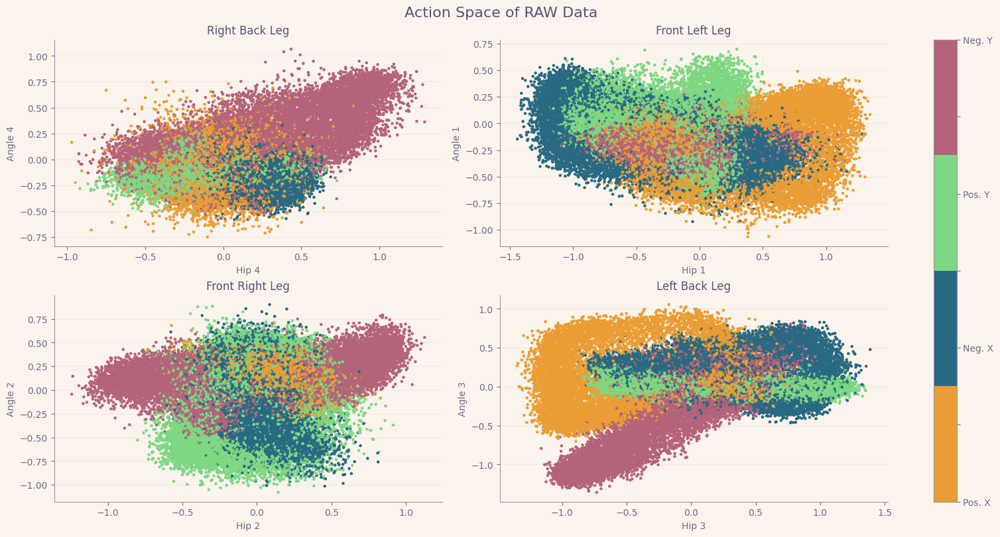

In [131]:
action_sapce_raw()

## Plotting original vs reconstructed actions

In [132]:
actions_encoded = encoder.predict(actions_obs_cust_diff_actT, batch_size=100)
actions_decoded = decoder.predict(actions_encoded[2], batch_size=100)

ActionsVsActionsDecodedDF = pd.DataFrame({'a0': actions_obs_cust_diff_actT[:][:, 0], 'ad0': actions_decoded[:][:, 0],
                                        'a1': actions_obs_cust_diff_actT[:][:, 1], 'ad1': actions_decoded[:][:, 1],
                                        'a2': actions_obs_cust_diff_actT[:][:, 2], 'ad2': actions_decoded[:][:, 2],
                                        'a3': actions_obs_cust_diff_actT[:][:, 3], 'ad3': actions_decoded[:][:, 3],
                                        'a4': actions_obs_cust_diff_actT[:][:, 4], 'ad4': actions_decoded[:][:, 4],
                                        'a5': actions_obs_cust_diff_actT[:][:, 5], 'ad5': actions_decoded[:][:, 5],
                                        'a6': actions_obs_cust_diff_actT[:][:, 6], 'ad6': actions_decoded[:][:, 6],
                                        'a7': actions_obs_cust_diff_actT[:][:, 7], 'ad7': actions_decoded[:][:, 7]})

 1/40 [..............................] - ETA: 0s

40/40 [==============================] - 0s 2ms/step


Each action is plotted against its reconstructed version. The MSE between original and reconstructed actions is displayed. This evaluates how well the VAE learned to represent the action space.

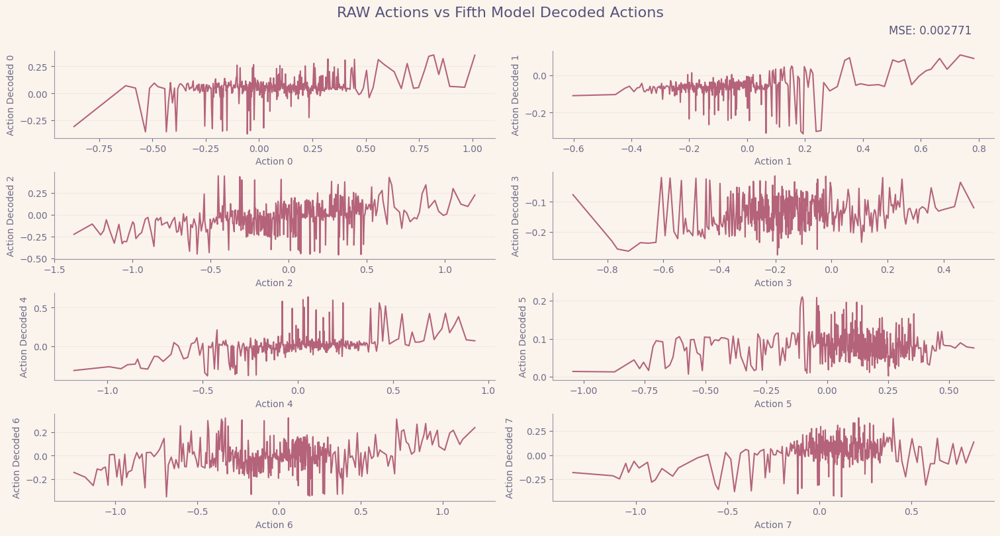

In [133]:
def inputs_outputs_plot(x, mse):
    """
    Plot the latent space.
    """
    # Set the default color cycle

    skip = 10
    fig, ax = plt.subplots(4, 2, figsize=(15, 8), constrained_layout=True)
    x = x.sort_values(by='a0')
    ax[0, 0].plot(x[::skip]['a0'].values, x[::skip]['ad0'].values)
    ax[0, 0].set_xlabel('Action 0')
    ax[0, 0].set_ylabel('Action Decoded 0')

    x = x.sort_values(by='a1')
    ax[0, 1].plot(x[::skip]['a1'].values, x[::skip]['ad1'].values)
    ax[0, 1].set_xlabel('Action 1')
    ax[0, 1].set_ylabel('Action Decoded 1')

    x = x.sort_values(by='a2')
    ax[1, 0].plot(x[::skip]['a2'].values, x[::skip]['ad2'].values)
    ax[1, 0].set_xlabel('Action 2')
    ax[1, 0].set_ylabel('Action Decoded 2')

    x = x.sort_values(by='a3')
    ax[1, 1].plot(x[::skip]['a3'].values, x[::skip]['ad3'].values)
    ax[1, 1].set_xlabel('Action 3')
    ax[1, 1].set_ylabel('Action Decoded 3')

    x = x.sort_values(by='a4')
    ax[2, 0].plot(x[::skip]['a4'].values, x[::skip]['ad4'].values)
    ax[2, 0].set_xlabel('Action 4')
    ax[2, 0].set_ylabel('Action Decoded 4')

    x = x.sort_values(by='a5')
    ax[2, 1].plot(x[::skip]['a5'].values, x[::skip]['ad5'].values)
    ax[2, 1].set_xlabel('Action 5')
    ax[2, 1].set_ylabel('Action Decoded 5')

    x = x.sort_values(by='a6')
    ax[3, 0].plot(x[::skip]['a6'].values, x[::skip]['ad6'].values)
    ax[3, 0].set_xlabel('Action 6')
    ax[3, 0].set_ylabel('Action Decoded 6')

    x = x.sort_values(by='a7')
    ax[3, 1].plot(x[::skip]['a7'].values, x[::skip]['ad7'].values)
    ax[3, 1].set_xlabel('Action 7')
    ax[3, 1].set_ylabel('Action Decoded 7')

    # Add main title
    plt.suptitle('RAW Actions vs Fifth Model Decoded Actions', fontsize=16)
    ax[0, 1].text(0.95, 1.3, f'MSE: {mse}', fontsize=12, verticalalignment='top', horizontalalignment='right', transform=ax[0, 1].transAxes)

    plt.savefig('assets/images/Model5ActionVsDecoded.png', dpi=300)
    plt.show()

mse_model1 = np.sum((np.square(actions_obs_cust_diff_act[:8] - actions_decoded[:8])) / len(actions_obs_cust_diff_act))

inputs_outputs_plot(ActionsVsActionsDecodedDF, "{:.6f}".format(mse_model1))

### Storing data in global variable for final evaluation of all models

In [134]:
histories.append(loaded_history)
encoded_data_list.append([df_encoded[0].values, df_encoded[1].values])
labels_list.append(df_encoded['y_test'].values)
mse_values.append(mse_model1)

## Comparing RAW Ant and Decoded Coordinates 

Plotting the x and y position of the RAW data vs x and y position of the decoded action values to compare the outcome of the model.

In [135]:
x_raw_dec_5 = []
y_raw_dec_5 = []
rewards_dec_5 = []

In [136]:
env = gym.make("Ant-v4")
observation, info = env.reset()

for i in range(len(x_test_decoded)):
    action = x_test_decoded[i][0:8]
    _, reward, terminated, truncated, info = env.step(action)
    x_raw_dec_5.append(info['x_position'])
    y_raw_dec_5.append(info['y_position'])
    rewards_dec_5.append(reward)
    if i == 1000: break

env.close()

Text(0.5, 1.0, 'Fifth Model RAW vs Decoded Coordinates')

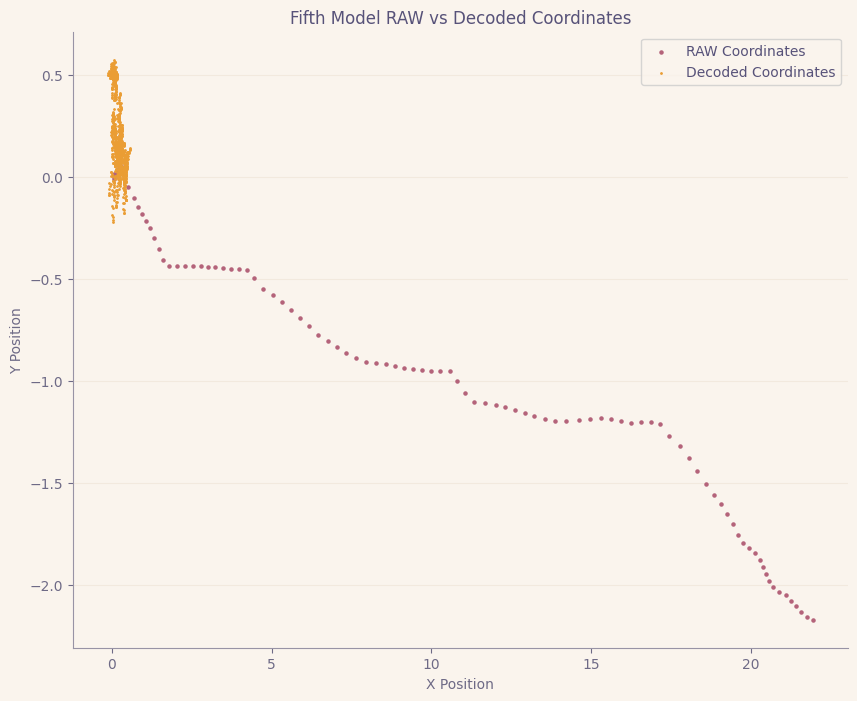

In [137]:
plt.figure(figsize=(10, 8))
plt.scatter(x_raw_1[0][:100], y_raw_1[0][:100],s=5, label='RAW Coordinates')
plt.scatter(x_raw_dec_5, y_raw_dec_5, s=1,label='Decoded Coordinates')

plt.legend()
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.title('Fifth Model RAW vs Decoded Coordinates')

Text(0.5, 1.0, 'Fifth Model RAW vs Decoded Action Rewards')

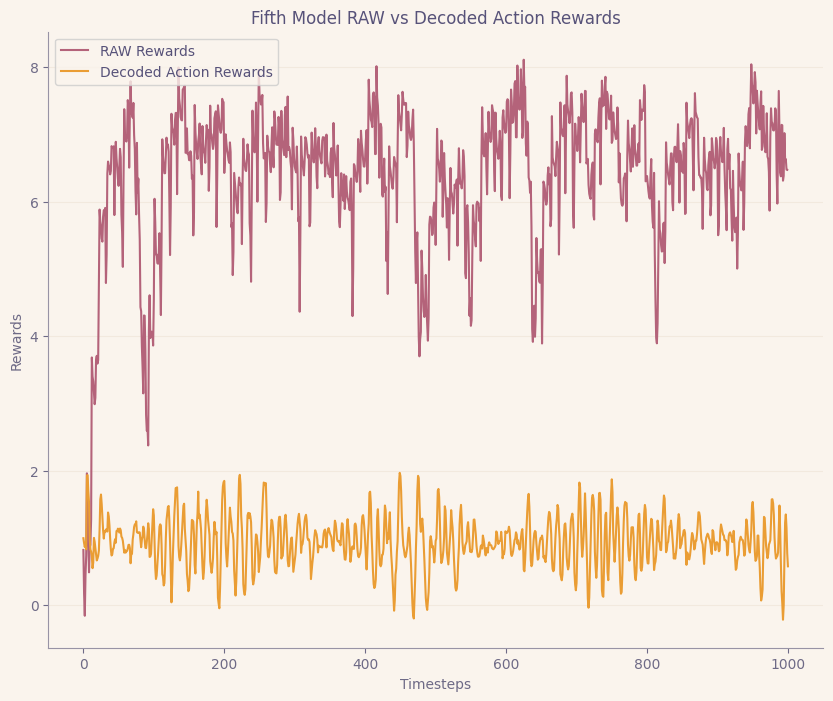

In [138]:
plt.figure(figsize=(10, 8))
plt.plot(rewards_test[:1000], label='RAW Rewards')
plt.plot(rewards_dec_5, label='Decoded Action Rewards')

plt.legend()
plt.xlabel('Timesteps')
plt.ylabel('Rewards')
plt.title('Fifth Model RAW vs Decoded Action Rewards')

## Evaluating VAE model on Mujoco Ant environment

### First Method - Controling Ant with decoded actions sequence

This code takes a sequence of decoded actions and uses them to control the simulated Ant environment.

In the following cell, range is starting from 3000 index which means it should move in the negative y direction

In [139]:
# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# for i in range(1000):
#     action = x_test_decoded[30000+i][0:8]
#     _, reward, terminated, truncated, info = env.step(action)

#     if terminated or truncated:
#         observation, info = env.reset()

# env.close()

### Second Method - Decoding latent space paths to action sequences with PyGame

This code takes a path drawn on the latent space visualization and decodes it into a sequence of actions.

- The `find_or_approximate` function finds the closest encoded point. 
- `decode_from_points` uses this to extract a sequence of points along the path which are decoded into a sequence of actions.

This allows interacting with the latent space visualization to extract semantically meaningful action sequences.

This code allows drawing a path in the latent space visualization and executing the decoded action sequence in the environment.

Clicking two points draws a path, decodes it to actions, and executes the sequence in the environment.

This allows interactively exploring and exploiting the latent space to generate semantically meaningful sequences.

In [140]:
# def find_or_approximate(df, col, value1, value2, third_col_value):
#     value1 = (value1 / WIDTH) * 2 - 1
#     value2 = (value2 / WIDTH) * 2 - 1

#     # Filter based on third column's value
#     if third_col_value is not None:
#         df = df[df['y_test'] == third_col_value]

#     # Calculate the absolute difference for both values in the filtered rows
#     df['diff'] = (df[col[0]] - value1).abs() + (df[col[1]] - value2).abs()
    
#     # Get the row with the minimum sum of absolute differences
#     min_diff_row = df.loc[df['diff'].idxmin()]
    
#     return min_diff_row.drop('diff')

# def decode_from_points(path_points):
#     a = find_or_approximate(df_encoded, [0, 1], path_points[0][0], path_points[0][1], None)
#     b = find_or_approximate(df_encoded, [0, 1], path_points[1][0], path_points[1][1], a['y_test'])

#     # Extract all rows between a and b with the same y_test value
#     start_idx, end_idx = sorted([a.name, b.name])  
#     in_between_rows = df_encoded.loc[start_idx:end_idx]
#     in_between_rows = in_between_rows[in_between_rows['y_test'] == a['y_test']]

#     x_y = np.column_stack((in_between_rows[0], in_between_rows[1]))
#     decoded_values = decoder.predict(x_y, batch_size=100)

#     return decoded_values[::20]


# env = gym.make("Ant-v4", render_mode="human")
# observation, info = env.reset()

# # Initialize pygame
# pygame.init()

# # Define screen dimensions
# WIDTH, HEIGHT = 800, 600

# # Create a screen and a clock
# screen = pygame.display.set_mode((WIDTH, HEIGHT))
# pygame.display.set_caption("VAE 2D Latent Space")
# clock = pygame.time.Clock()

# font = pygame.font.SysFont(None, 25)  # Font for displaying text

# def decode_from_latent_space(latent_x, latent_y):
#     action = decoder.predict(np.column_stack((latent_x, latent_y)))
#     return action[0][0:8]

# def get_color_from_latent_position(x, y):
#     return (int(x * 255), int(y * 255), 200)  # Example RGB value

# # Main loop
# running = True
# drawing_path = False
# path_points = []
# action = []


# first_point = None
# last_point = None

# while running:
#     screen.fill((255, 255, 255))

#     for x in range(WIDTH):
#         for y in range(HEIGHT):
#             color = get_color_from_latent_position(x/WIDTH, y/HEIGHT)
#             screen.set_at((x, y), color)
    
#     for event in pygame.event.get():
#         if event.type == pygame.QUIT:
#             running = False

#         if event.type == pygame.KEYDOWN:
#             if event.key == pygame.K_q:
#                 running = False

#         if event.type == pygame.MOUSEBUTTONDOWN:
#             if first_point is None:
#                 first_point = event.pos
#             elif last_point is None:
#                 last_point = event.pos
#                 # Process the points from first_point to last_point
#                 path_points = [first_point, last_point]
#                 # print(path_points)
#                 decoded_values = decode_from_points(path_points)
#                 print(len(decoded_values))
#                 for i in range(len(decoded_values)):
#                     action = decoded_values[i][0:8]
#                     _, reward, terminated, truncated, info = env.step(action)

#                     # if terminated or truncated:
#                     #     observation, info = env.reset()
#                     # if i > 1000:
#                     #     break

#                 first_point = last_point
#                 last_point = None
#             else:
#                 pass
        
#     # Display feedback about the action 
#     feedback_text = font.render(f"Last Action: {action}", True, (0, 0, 0))
#     screen.blit(feedback_text, (10, 10))
    
#     pygame.display.flip()
#     clock.tick(60)



# pygame.quit()
# env.close()


# Evaluation of all Five VAE Models

## Comparing training loss for all models

This code visualizes the training and validation loss curves for all the trained VAE models on a single plot.

The training and validation loss curves are visualized for each model to compare convergence. Legend entries are added to distinguish each model.
This plot helps compare how well different models were able to minimize loss during training across epochs.

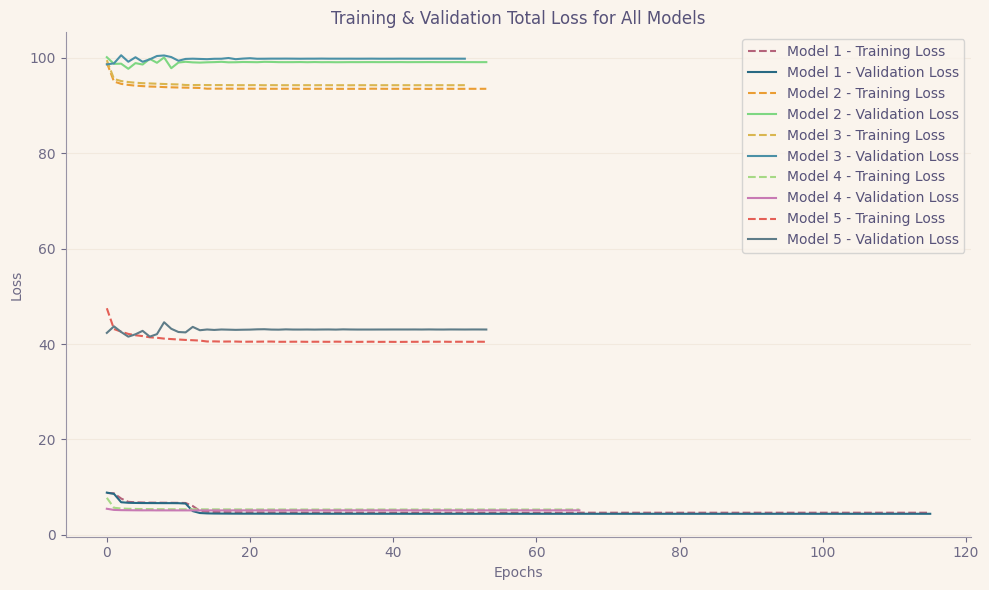

In [141]:
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=["#B4637A", "#286983",  "#EA9D34", "#7ED782", "#D9B650",
                                                    "#4A90A6", "#A6D985", "#C87AB4", "#E45F56", "#5E7C88"]) 
                                                    
plt.figure(figsize=(10, 6))

for i, history in enumerate(histories, 1):
    plt.plot(history['loss'], label=f'Model {i} - Training Loss', linestyle='--')
    plt.plot(history['val_loss'], label=f'Model {i} - Validation Loss')
    
plt.title('Training & Validation Total Loss for All Models')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
# plt.grid(True)
plt.tight_layout()
plt.savefig('assets/images/AllModelsTotalLoss.png', dpi=300)
plt.show()

## Comparing reconstruction loss for all models

This code specifically visualizes just the reconstruction loss component of the total loss for each trained VAE model.

The reconstruction loss indicates how well the model can reconstruct the original input. Lower values mean the latent representation preserves important information.
Visualizing just this component helps compare how well each model optimized the reconstruction loss specifically.

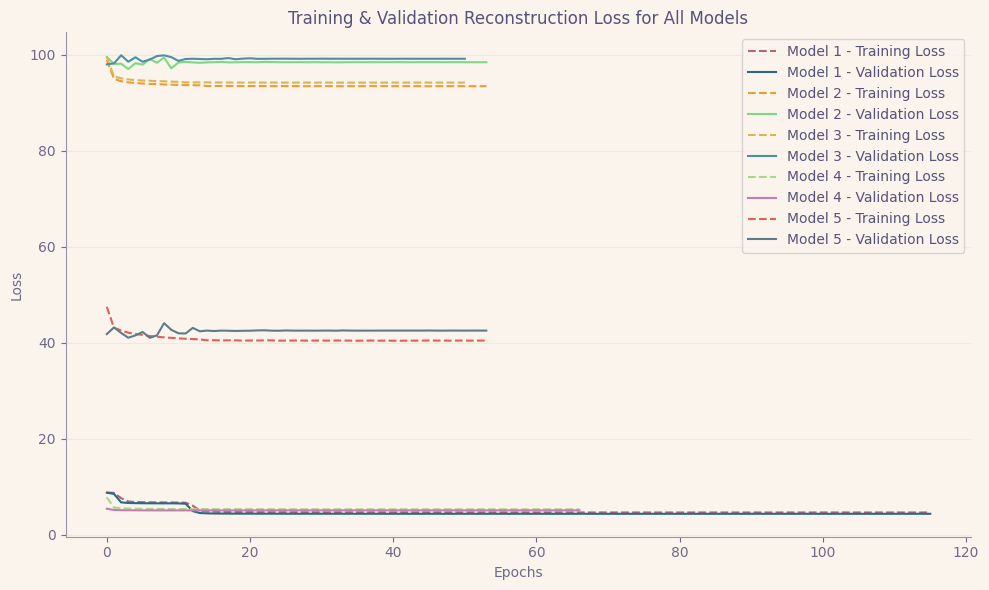

In [142]:
plt.figure(figsize=(10, 6))

for i, history in enumerate(histories, 1):
    plt.plot(history['reconstruction_loss'], label=f'Model {i} - Training Loss', linestyle='--')
    plt.plot(history['val_reconstruction_loss'], label=f'Model {i} - Validation Loss')
    
plt.title('Training & Validation Reconstruction Loss for All Models')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
# plt.grid(True)
plt.tight_layout()
plt.savefig('assets/images/AllModelsReconstructionLoss.png', dpi=300)
plt.show()

## Comparing KL divergence loss for all models

This code visualizes just the KL divergence component of the loss for each trained VAE model.

The KL divergence loss regularizes the latent space. Lower values mean a compact, normal latent distribution.
Visualizing just this loss component helps compare how the different models optimized the KL loss over epochs.

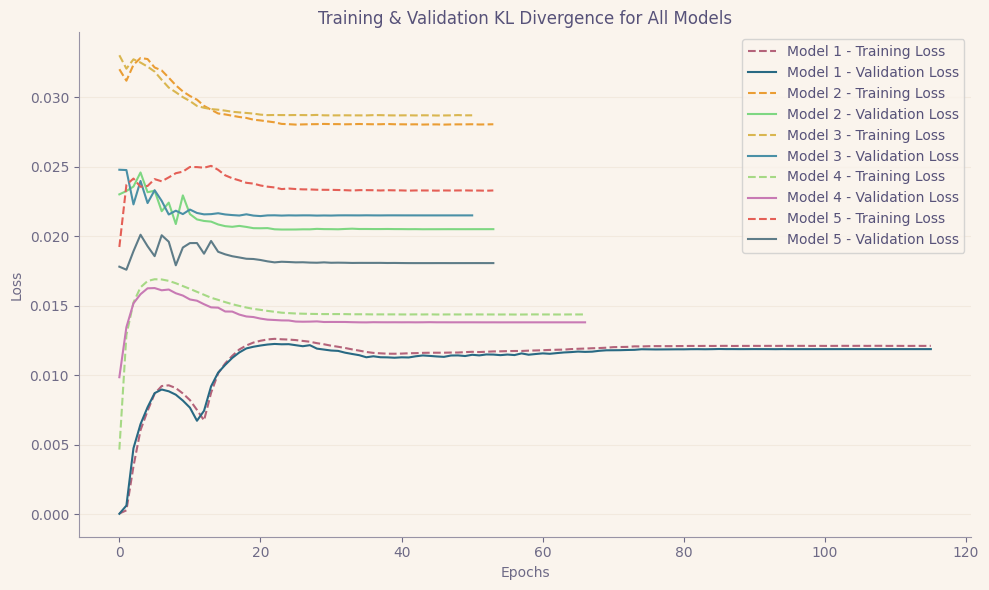

In [143]:
plt.figure(figsize=(10, 6))

for i, history in enumerate(histories, 1):
    plt.plot(history['kl_loss'], label=f'Model {i} - Training Loss', linestyle='--')
    plt.plot(history['val_kl_loss'], label=f'Model {i} - Validation Loss')
    
plt.title('Training & Validation KL Divergence for All Models')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
# plt.grid(True)
plt.tight_layout()
plt.savefig('assets/images/AllModelsKLLoss.png', dpi=300)
plt.show()

## Comparing reconstruction error across models

This code visualizes the mean squared error between original and reconstructed actions for each VAE model.

The MSE is shown for each model using a bar chart. Lower values indicate less reconstruction error and better preservation of action space details.
This helps assess and compare how accurately each model learned to reconstruct the original actions.

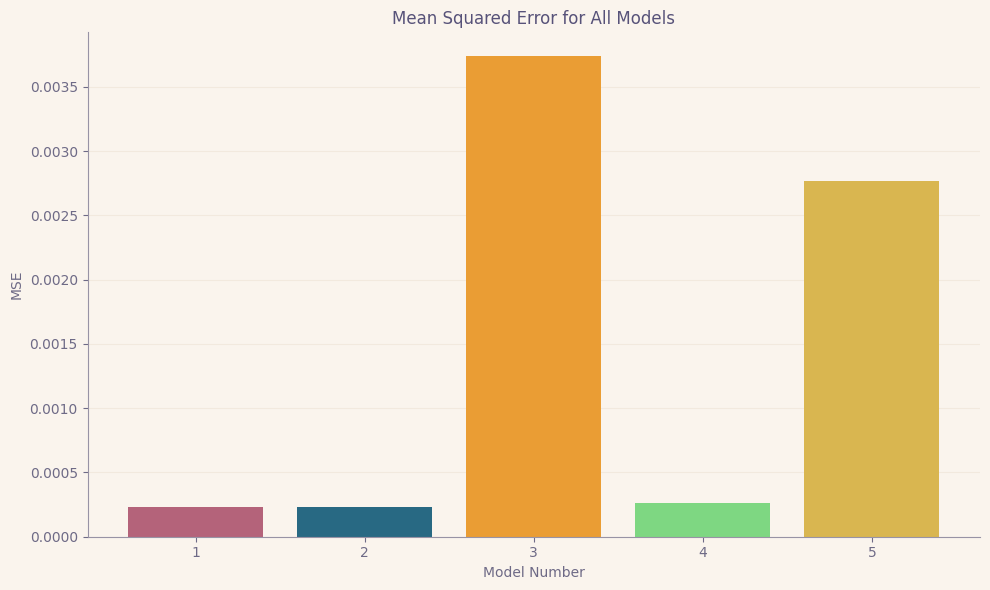

In [144]:
color=["#B4637A", "#286983",  "#EA9D34", "#7ED782", "#D9B650",
                                                    "#4A90A6", "#A6D985", "#C87AB4", "#E45F56", "#5E7C88"]
# Plotting MSE values for all models
plt.figure(figsize=(10, 6))
model_numbers = list(range(1, 6))
plt.bar(model_numbers, mse_values, color=color)
plt.xlabel('Model Number')
plt.ylabel('MSE')
plt.title('Mean Squared Error for All Models')
plt.xticks(model_numbers)
# plt.grid(axis='y')
# Display the plot
plt.tight_layout()
plt.savefig('assets/images/AllModelsMSE.png', dpi=300)
plt.show()

## Visualizing latent spaces for all models

This code generates a visualization to compare the 2D latent spaces learned by each VAE model.

The latent spaces are plotted side-by-side with shared colorbar and titles. This facilitates comparing the latent representations learned by different models.

/var/folders/w2/w5nbpgdx6x938lygn2q2g4b00000gn/T/ipykernel_60129/10261588.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


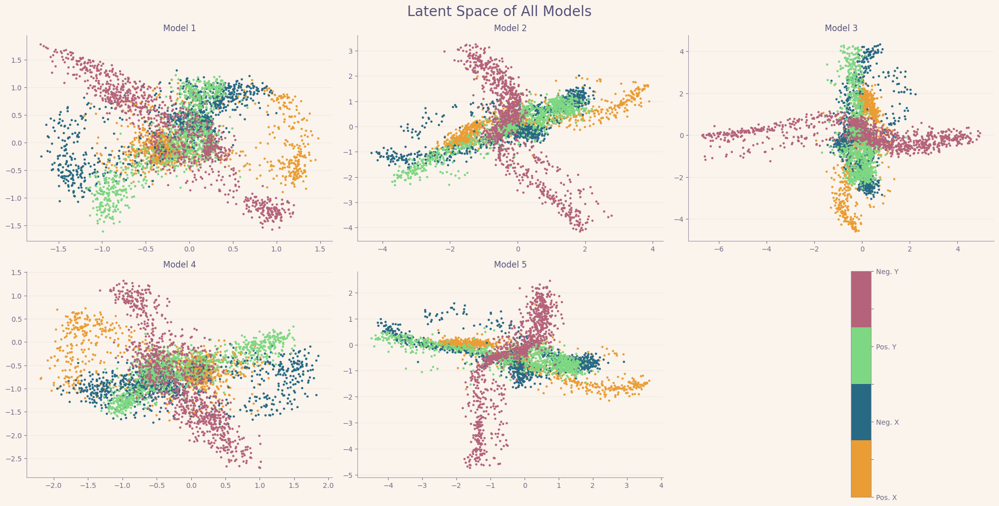

In [145]:
# Plotting latent space for all models side-by-side
fig, axs = plt.subplots(2, 3, figsize=(20, 10))

for i, (encoded_data, labels) in enumerate(zip(encoded_data_list, labels_list)):
    ax = axs[i // 3, i % 3]
    sc = ax.scatter(encoded_data[0], encoded_data[1], c=labels, cmap=cmap, s=5)
    ax.set_title(f'Model {i + 1}')

# Main title
plt.suptitle('Latent Space of All Models', fontsize=20)

# Add a colorbar to the right of the subplots
cbar_ax = fig.add_axes([0.85, 0.0, 0.02, 0.45])
cbar = fig.colorbar(sc, cax=cbar_ax)

# Custom formatter for the colorbar
cbar.ax.yaxis.set_major_formatter(FuncFormatter(format_func))

# Remove the last unused subplot
fig.delaxes(axs[1, 2])

plt.tight_layout()
plt.savefig('assets/images/AllModelsLatentSpace.png', dpi=300)
plt.show()


## Visualizing RAW Ant and Decoded Coordinates of All Models

Plotting the x and y position of the RAW data vs x and y position of the decoded action values to compare the outcome of the model.

Note: While running of gymnasium environment with fixed action space values, position will change on each run.

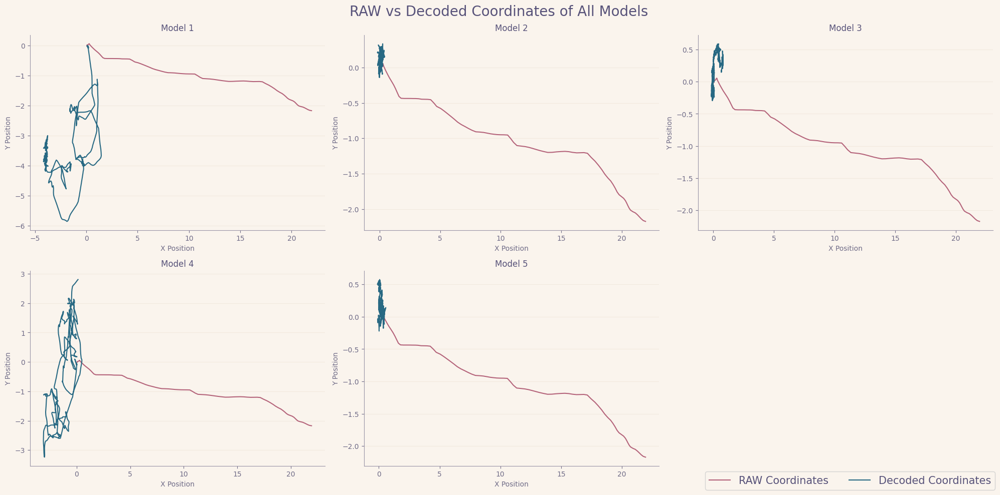

In [146]:
# Plotting latent space for all models side-by-side
fig, axs = plt.subplots(2, 3, figsize=(20, 10))

for i in range(5):
    ax = axs[i // 3, i % 3]
    x = x_raw_1[0][:100]
    y = y_raw_1[0][:100]
    x_dec = globals()[f'x_raw_dec_{i+1}']
    y_dec = globals()[f'y_raw_dec_{i+1}']

    sc = ax.plot(x, y)
    ac = ax.plot(x_dec, y_dec)
    ax.set_title(f'Model {i + 1}')
    ax.set_xlabel("X Position")
    ax.set_ylabel("Y Position")


# Main title
plt.suptitle('RAW vs Decoded Coordinates of All Models', fontsize=20)

# Remove the last unused subplot
fig.delaxes(axs[1, 2])

# Global legend
fig.legend([sc[0], ac[0]], ['RAW Coordinates', 'Decoded Coordinates'], loc='lower right', ncol=2, fontsize=15)

plt.tight_layout()
plt.savefig('assets/images/AllModelsCoordinates.png', dpi=300)
plt.show()


## Visualizing RAW and Decoded Rewards of All Models

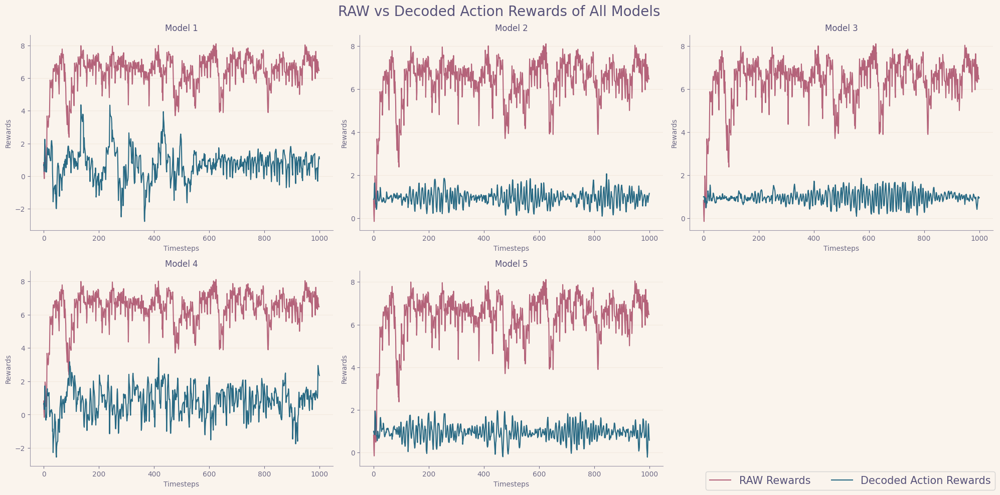

In [147]:
# Plotting latent space for all models side-by-side
fig, axs = plt.subplots(2, 3, figsize=(20, 10))

for i in range(5):
    ax = axs[i // 3, i % 3]
    x = rewards_test[:1000]
    x2 = globals()[f'rewards_dec_{i+1}']
    sc = ax.plot(x)
    ac = ax.plot(x2)
    ax.set_title(f'Model {i + 1}')
    ax.set_xlabel("Timesteps")
    ax.set_ylabel("Rewards")


# Main title
plt.suptitle('RAW vs Decoded Action Rewards of All Models', fontsize=20)

# Remove the last unused subplot
fig.delaxes(axs[1, 2])

# Global legend
fig.legend([sc[0], ac[0]], ['RAW Rewards', 'Decoded Action Rewards'], loc='lower right', ncol=2, fontsize=15)

plt.tight_layout()
plt.savefig('assets/images/AllModelsRewards.png', dpi=300)
plt.show()